# Stationarity of NAB Dataset
This notebook demonstrates the application of various methods to detect stationarity for each signal in the NAB Dataset. It includes rolling mean, ACF, PACF plots, ADF, and KPSS tests.

In [2]:
#import libraries
import os
import glob
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.api import OLS
from statsmodels.tsa.stattools import adfuller, kpss
from sklearn.impute import SimpleImputer

Necessary functions.

In [3]:
#function to plot a roling statistics

def plot_rolling_statistics(df, file_name, window=12):
    """
    Plots the rolling statistics of a time series, including the original data and the rolling mean.

    Parameters:
    - df (DataFrame): The DataFrame containing the time series data.
    - file_name (str): A string representing the name or description of the data for the plot title.
    - window (int, optional): The window size for calculating the rolling mean. Default is set to 12.
    """

    series = df['value']
    rolling_mean = series.rolling(window=window).mean()
    #rolling_std = series.rolling(window=window).std()

    plt.figure(figsize=(16, 10))
    plt.plot(series, label='Original')
    plt.plot(rolling_mean, label='Rolling Mean')
    #plt.plot(rolling_std, label='Rolling Std')
    plt.title(f'Rolling Mean {file_name}')
    #plt.title(f'Rolling Mean & Standard Deviation {file_name}')
    plt.xlabel('timestamp')
    plt.ylabel('value')
    plt.legend()
    plt.show()

In [4]:
# Function to plot ACF and PACF
def plot_acf_pacf(series,file_name):
    """
    Plots the AutoCorrelation Function (ACF) and Partial AutoCorrelation Function (PACF) of a time series.

    Parameters:
    - series (Series): A pandas Series containing the time series data.
    - file_name (str): A string representing the name or description of the data for the plot titles.
    """
    plt.figure(figsize=(12, 6))
    plt.subplot(121)
    plot_acf(series, ax=plt.gca(), lags=None)  # Automatically determine the number of lags
    plt.title(f'ACF {file_name}')

    plt.subplot(122)
    plot_pacf(series, ax=plt.gca(), lags=None) # Automatically determine the number of lags
    plt.title(f'PACF {file_name}')
    plt.tight_layout()
    plt.show()

In [5]:
#Augmented Dickey Fuller unit root for time series Stationarity. 
#After the changeing of regression parameter we can test different types of stationarity
#c - constant only
#ct - constant and trend
#ctt - constant and quadratic trend
#n - no constant, no trend
def adf_test(series, reg ='c'):
    """
    Performs the Augmented Dickey-Fuller (ADF) test for stationarity.

    Parameters:
    - series (array-like): The time series data to be tested for stationarity.
    - reg (str, optional): The type of regression used in the ADF test. 'c' (default) indicates stationary around a constant.
                           'ct' indicates stationary around a constant and trend.

    Returns:
    - AD_Test (tuple): A tuple containing the ADF test results including the ADF statistic, p-value, number of lags, and critical values.
    """

    #series = df.loc[:, 'value'].values
    AD_Test = adfuller(series, regression=reg, autolag='AIC')
    return AD_Test

# Function to print core information from Augmented Dickey Fuller Test
def print_adf_results(AD_Test):
    """
    Prints the core information obtained from the Augmented Dickey-Fuller (ADF) test.

    Parameters:
    - AD_Test (tuple): A tuple containing the ADF test results.

    """
    
    print(f'ADF Statistic: {AD_Test[0]}')
    print(f'p-value: {AD_Test[1]}')
    print(f'n_lags: {AD_Test[2]}')
    print(f'Number of observations:{AD_Test[3]}')
    for key, value in AD_Test[4].items():
        print('Critical Values:')
        print(f'   {key}, {value}')



In [6]:
#Kwiatkowski Phillips Schmidt Test
#After the changeing of Regressions parameter we can test different types of stationarity
#c - data is stationary around constant
#ct - data is stationary around constant and trend
def kpss_test(series,reg = 'c'):
    """
    Performs the Kwiatkowski-Phillips-Schmidt-Shin (KPSS) test for stationarity.

    Parameters:
    - series (array-like): The time series data to be tested for stationarity.
    - reg (str, optional): The type of regression used in the KPSS test. 'c' (default) indicates stationary around a constant.
                          'ct' indicates stationary around a constant and trend.

    Returns:
    - KPSS_test (tuple): A tuple containing the KPSS test results including the KPSS statistic, p-value, number of lags, and critical values.
    """

    #series = df.loc[:, 'value'].values
    KPSS_test = kpss(series, regression=reg)
    return KPSS_test


#Function to print the core information from Kwiatkowski Phillips Schmidt Test
def print_kpss_results(KPSS_test):
    """
    Prints the core information obtained from the Kwiatkowski-Phillips-Schmidt-Shin (KPSS) test.

    Parameters:
    - KPSS_test (tuple): A tuple containing the KPSS test results.

    """
    print(f'KPSS Statistic: {KPSS_test[0]}')
    print(f'p-value: {KPSS_test[1]}')
    print(f'n_lags: {KPSS_test[2]}')
    for key, value in KPSS_test[3].items():
        print('Critial Values:')
        print(f'   {key}, {value}')  

In [7]:
def print_information_about_file(df, file_name):
    """
    Prints information about a time series dataset including rolling statistics, ADF test results, KPSS test results, and ACF/PACF plots.

    Parameters:
    - df (DataFrame): The DataFrame containing the time series data.
    - file_name (str): A string representing the name or description of the data for the printed information.
    """
    print(f'Information about: {file_name}')
    #extract the series values
    series = df.loc[:, 'value'].values
    plot_rolling_statistics(df,file_name)
    #perform Tests
    AD_Test = adf_test(series)
    KPSS_test = kpss_test(series)
    #print ADF test results
    print_adf_results(AD_Test)
    print_kpss_results(KPSS_test)
    #plot ACF and PACF
    plot_acf_pacf(series,file_name)

In [8]:
#process fill and add to summary data Frame
#This function calculates various statistics and test results for a given time series dataset and appends them to an existing summary DataFrame.
#The summary includes the dataset's length, the number of anomaly points, ADF test statistics (ADF Statistic, p-value, lags, critical values), and KPSS test statistics (KPSS Statistics, p-value, critical values).

def create_summary_frame(df_info, df ,file_name,regression_ADF,regression_KPSS):
     """
    Creates a summary DataFrame containing information about a time series dataset, including statistical results from ADF and KPSS tests.

    Parameters:
    - df_info (DataFrame): The existing DataFrame where summary information will be appended.
    - df (DataFrame): The DataFrame containing the time series data.
    - file_name (str): A string representing the name or description of the data for the summary.
    - regression_ADF (str): The type of regression used in the Augmented Dickey-Fuller (ADF) test ('c' or 'ct').
    - regression_KPSS (str): The type of regression used in the Kwiatkowski-Phillips-Schmidt-Shin (KPSS) test ('c' or 'ct').

    Returns:
    - df_info (DataFrame): The updated DataFrame containing the summary information.
    """

     length = len(df)
     num_anomalies = sum(df.is_anomaly)
     adf_result = adf_test(df['value'], regression_ADF)
     adf_statistic, adf_pvalue,adf_lags = adf_result[:3]
     adf_5_percent_critical_value, adf_10_percent_critical_value = adf_result[4]['5%'], adf_result[4]['10%']
     kpss_results = kpss_test(df['value'], regression_KPSS)
     kpss_statistics, kpss_pvalue = kpss_results[:2]
     kpss_5_percent_critical_value, kpss_10_percent_critical_value = kpss_results[3]['5%'], kpss_results[3]['10%']

     df_info = df_info.append({'File Name': file_name,
                              'Length': length,
                              'Amount of Anomaly Points': num_anomalies,
                              'ADF Statistic': adf_statistic,
                              'ADF Regression': regression_ADF,  
                              'ADF p-value': adf_pvalue,
                              'ADF lags': adf_lags,
                              'ADF Critical Value 10%': adf_10_percent_critical_value,
                              'ADF Critical Value 5%': adf_5_percent_critical_value,
                              'KPSS Statistics': kpss_statistics,
                              'KPSS Regression': regression_KPSS,
                              'KPSS p-value': kpss_pvalue,
                              'KPSS Critical Value 10%': kpss_10_percent_critical_value,
                              'KPSS Critical Value 5%': kpss_5_percent_critical_value},
                             ignore_index=True)
     return df_info

## Compute statistics for different collections of NAB dataset
A summary is stored in a separate DataFrame (and saved as .csv file) for each collection of the NAB dataset.

Artificial with Anomaly

In [17]:
#create a new info_frame
columns = ['File Name', 'Length', 'Amount of Anomaly Points', 'ADF Statistic', 'ADF Regression', 'ADF p-value', 'ADF lags', 'ADF Critical Value 10%', 'ADF Critical Value 5%', 'KPSS Statistics', 'KPSS Regression', 'KPSS p-value', 'KPSS Critical Value 10%', 'KPSS Critical Value 5%']
df_info = pd.DataFrame(columns=columns)

#define regression parameters
regression_ADF_values = ['c', 'n', 'ct', 'ctt']
regression_KPSS_values = ['c', 'c', 'ct', 'ct']

Information about: art_load_balancer_spikes_anomaly.csv


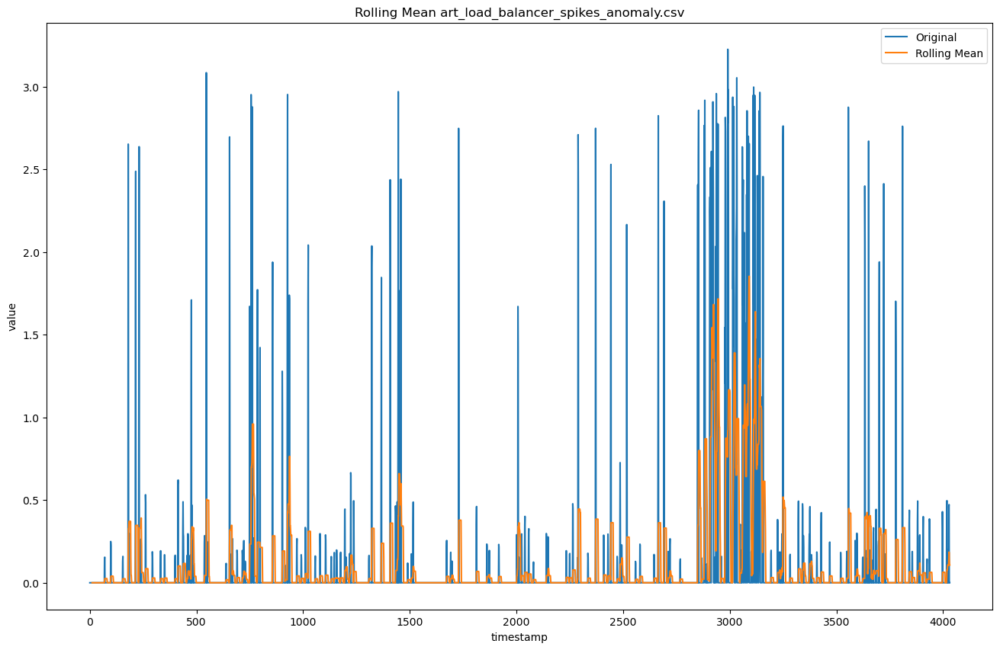

/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/255004051.py:19: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  KPSS_test = kpss(series, regression=reg)


ADF Statistic: -6.248298201558203
p-value: 4.518893287749649e-08
n_lags: 31
Number of observations:4000
Critical Values:
   1%, -3.4319858753661405
Critical Values:
   5%, -2.8622628402506254
Critical Values:
   10%, -2.5671547755625
KPSS Statistic: 1.0689171864379008
p-value: 0.01
n_lags: 27
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


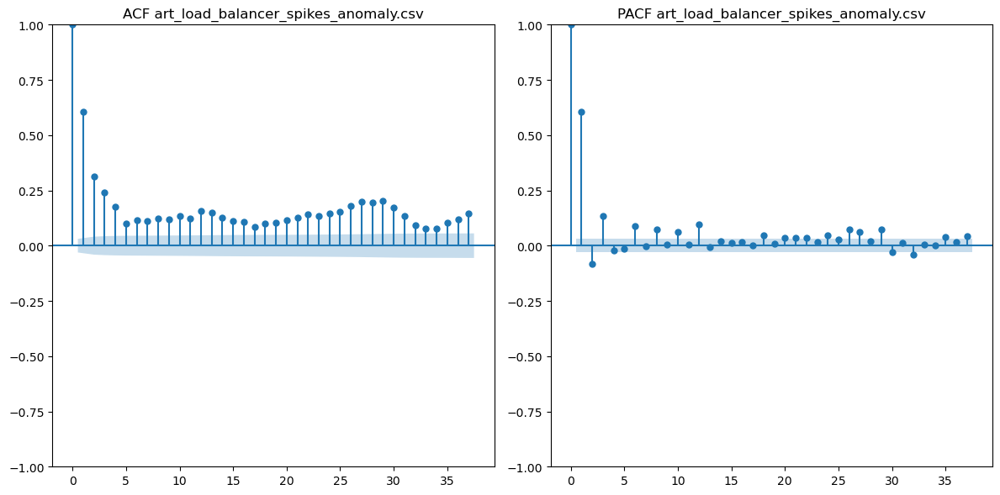

Information about: art_daily_jumpsdown_anomaly.csv


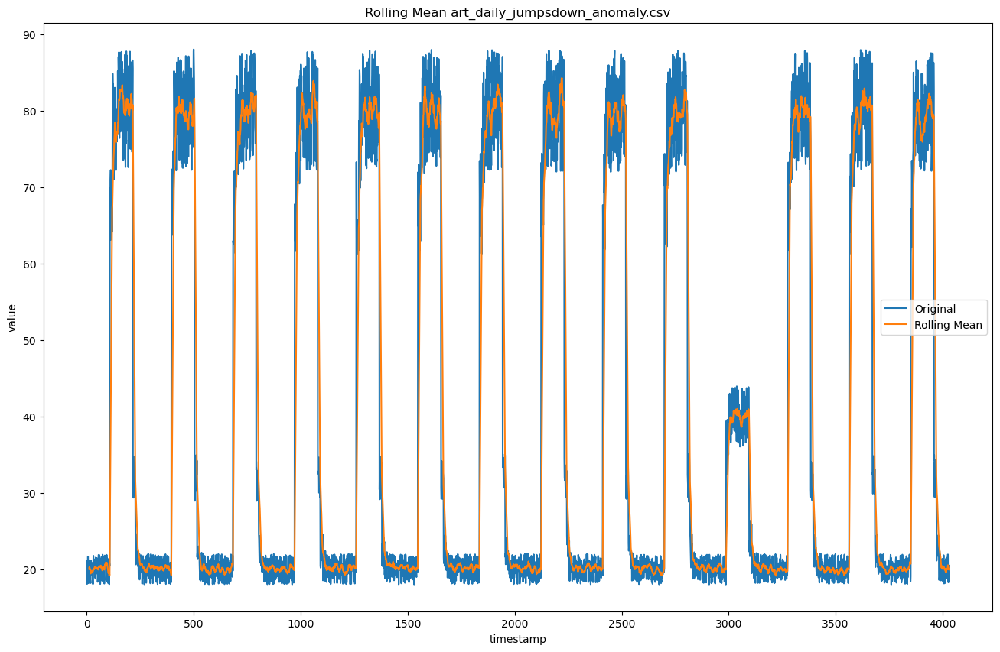

/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/255004051.py:19: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  KPSS_test = kpss(series, regression=reg)


ADF Statistic: -5.991232661832864
p-value: 1.7436715073849838e-07
n_lags: 15
Number of observations:4016
Critical Values:
   1%, -3.431979353761444
Critical Values:
   5%, -2.8622599593539513
Critical Values:
   10%, -2.567153241895466
KPSS Statistic: 0.031045002774095717
p-value: 0.1
n_lags: 39
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


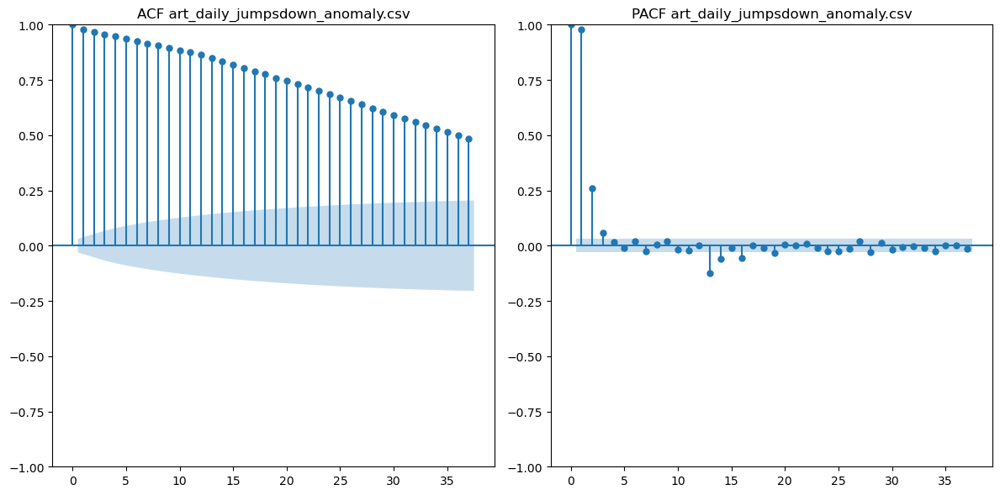

Information about: art_increase_spike_density_anomaly.csv


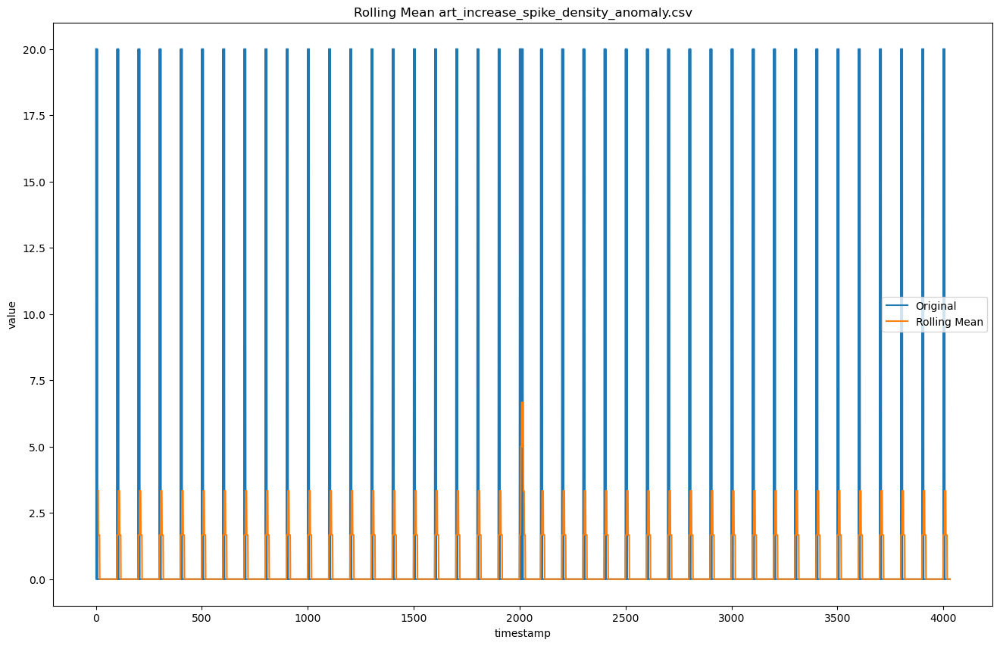

/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/255004051.py:19: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  KPSS_test = kpss(series, regression=reg)


ADF Statistic: -12.269915695993081
p-value: 8.687692101167218e-23
n_lags: 29
Number of observations:4002
Critical Values:
   1%, -3.4319850573119437
Critical Values:
   5%, -2.8622624788783146
Critical Values:
   10%, -2.567154583183171
KPSS Statistic: 0.009055057100336291
p-value: 0.1
n_lags: 37
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


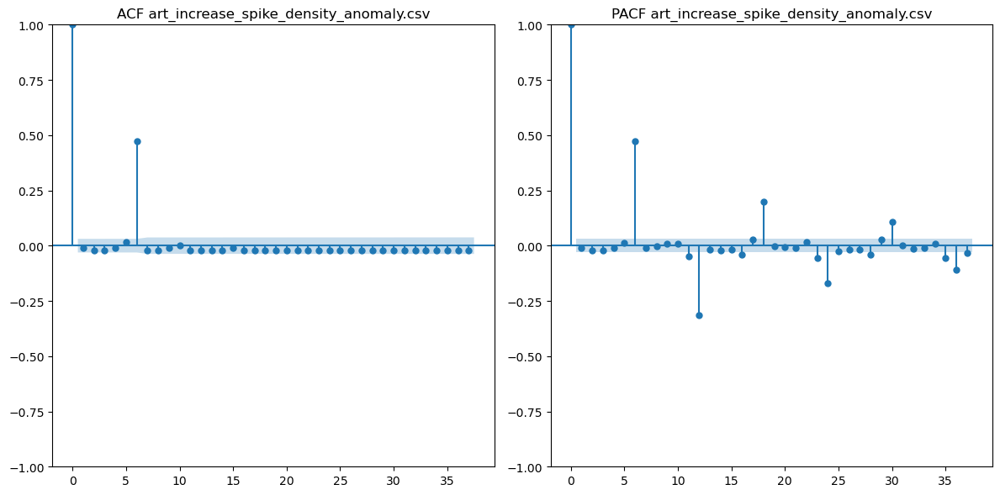

Information about: art_daily_flatmiddle_anomaly.csv


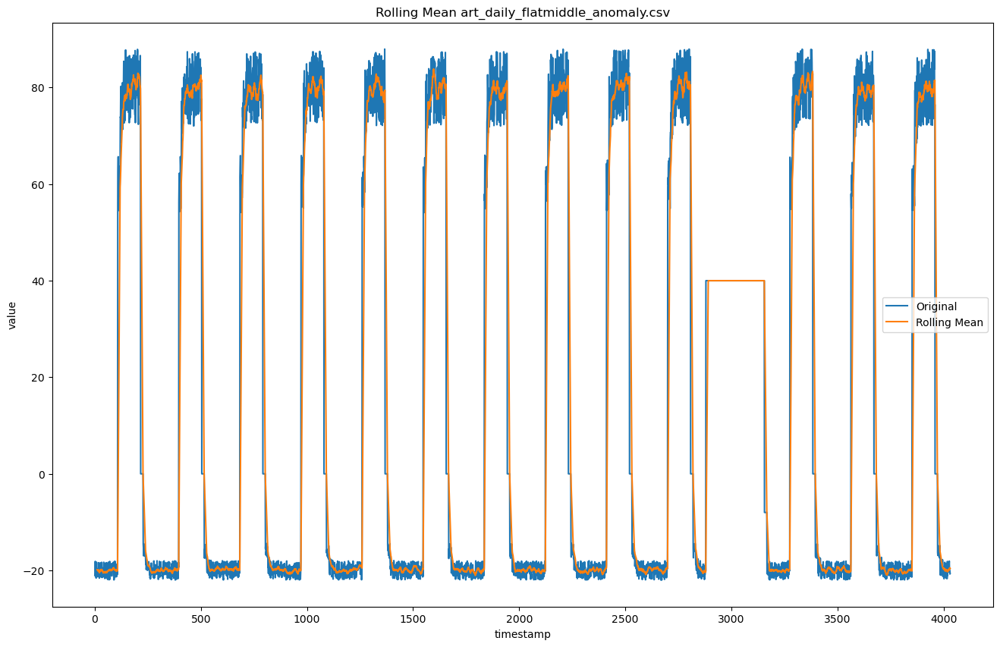

/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/255004051.py:19: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  KPSS_test = kpss(series, regression=reg)


ADF Statistic: -5.858763157354087
p-value: 3.449916857881481e-07
n_lags: 13
Number of observations:4018
Critical Values:
   1%, -3.431978542215164
Critical Values:
   5%, -2.8622596008557037
Critical Values:
   10%, -2.5671530510462994
KPSS Statistic: 0.03856315309096897
p-value: 0.1
n_lags: 39
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


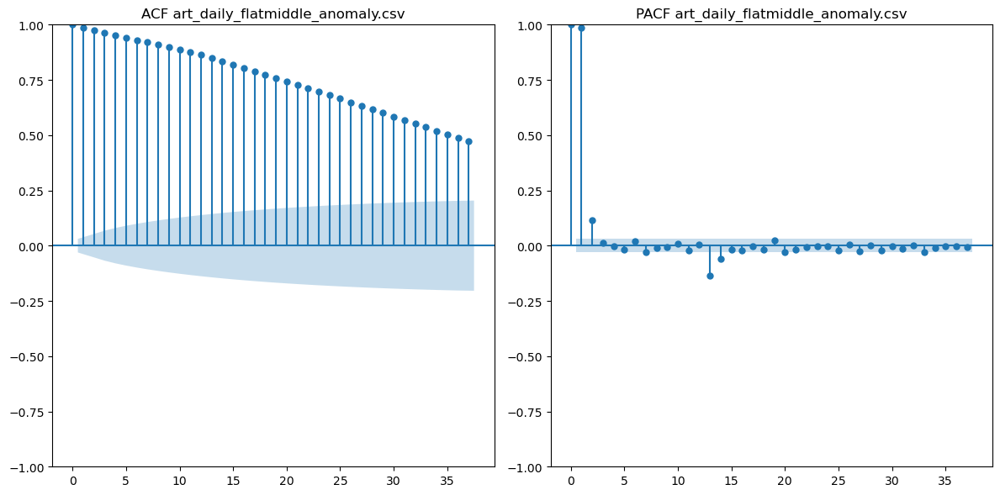

Information about: art_daily_jumpsup_anomaly.csv


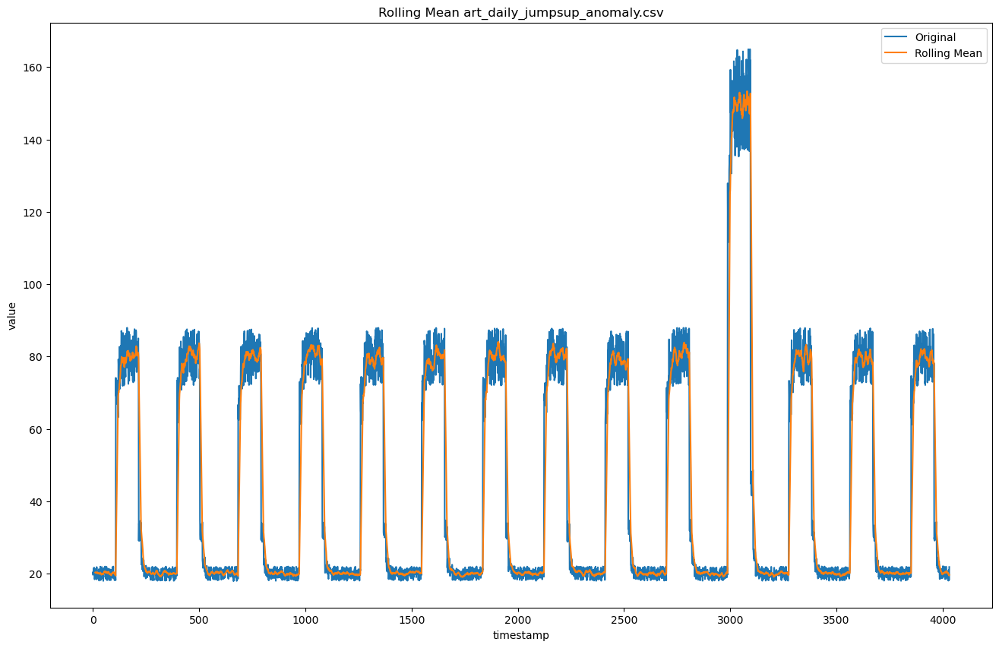

/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/255004051.py:19: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  KPSS_test = kpss(series, regression=reg)


ADF Statistic: -5.90838739337223
p-value: 2.674748786179366e-07
n_lags: 17
Number of observations:4014
Critical Values:
   1%, -3.4319801661169578
Critical Values:
   5%, -2.862260318209578
Critical Values:
   10%, -2.5671534329349024
KPSS Statistic: 0.08198901766493469
p-value: 0.1
n_lags: 39
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


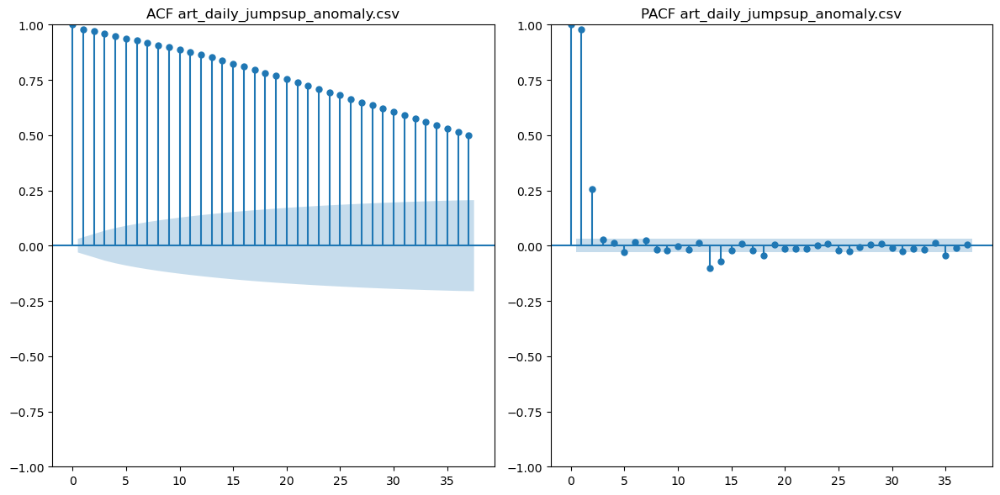

Information about: art_daily_nojump_anomaly.csv


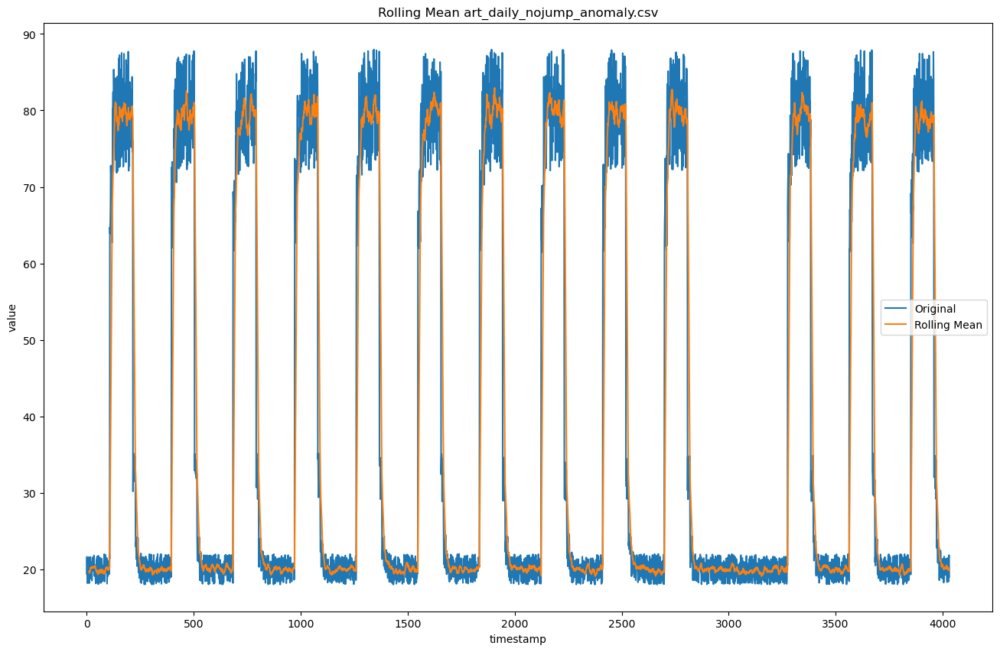

/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/255004051.py:19: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  KPSS_test = kpss(series, regression=reg)


ADF Statistic: -5.798243612724722
p-value: 4.6966808482828115e-07
n_lags: 14
Number of observations:4017
Critical Values:
   1%, -3.431978947887225
Critical Values:
   5%, -2.8622597800601888
Critical Values:
   10%, -2.567153146447117
KPSS Statistic: 0.05821112934573597
p-value: 0.1
n_lags: 39
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


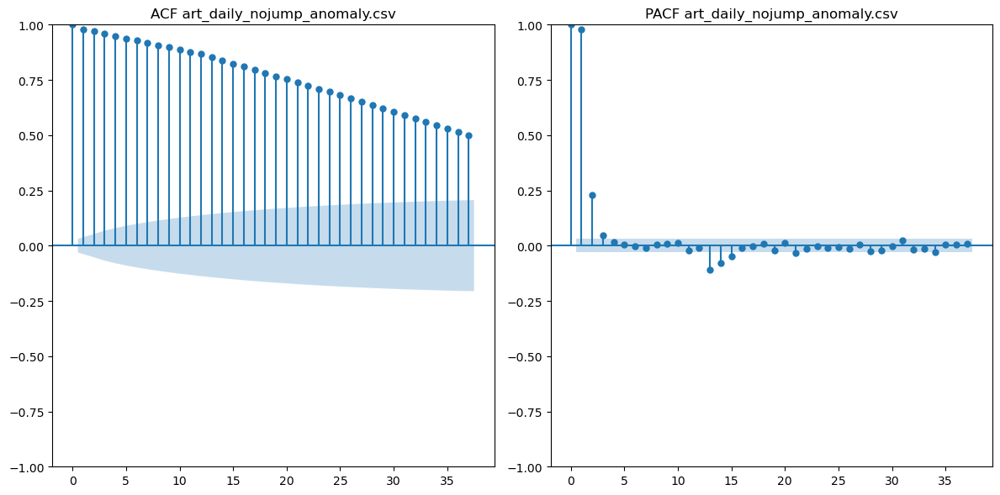

In [18]:
#become file lists
csv_files = glob.glob("NAB_labelled/artificialWithAnomaly/*.csv")
file_names = [os.path.basename(file) for file in csv_files]
for file_name in file_names:
    df = pd.read_csv(f'NAB_labelled/artificialWithAnomaly/{file_name}')
    print_information_about_file(df, file_name)

In [19]:
#create summary for each ADF and KPSS regression parameters
for i in range(len(regression_ADF_values)):
    regression_ADF = regression_ADF_values[i]
    regression_KPSS = regression_KPSS_values[i]
    for file_name in file_names:
        df = pd.read_csv(f'NAB_labelled/artificialWithAnomaly/{file_name}')
        df_info = create_summary_frame(df_info, df, file_name, regression_ADF, regression_KPSS)

/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/255004051.py:19: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  KPSS_test = kpss(series, regression=reg)
/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/1717271452.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_info = df_info.append({'File Name': file_name,
/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/255004051.py:19: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  KPSS_test = kpss(series, regression=reg)
/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/1717271452.py:30: FutureWarning: The frame.append method is deprecated and will be remo

In [20]:
#save the information as .csv file
df_info.to_csv('Summary/Summary_stationarity_NAB_Art_An.csv',index=False)

Real AdExchange

In [21]:
#create an information data frame
columns = ['File Name', 'Length', 'Amount of Anomaly Points', 'ADF Statistic', 'ADF Regression', 'ADF p-value', 'ADF lags', 'ADF Critical Value 10%', 'ADF Critical Value 5%', 'KPSS Statistics', 'KPSS Regression', 'KPSS p-value', 'KPSS Critical Value 10%', 'KPSS Critical Value 5%']
df_info = pd.DataFrame(columns=columns)
regression_ADF_values = ['c', 'n', 'ct', 'ctt']
regression_KPSS_values = ['c', 'c', 'ct', 'ct']

Information about: exchange-2_cpc_results_anomaly.csv


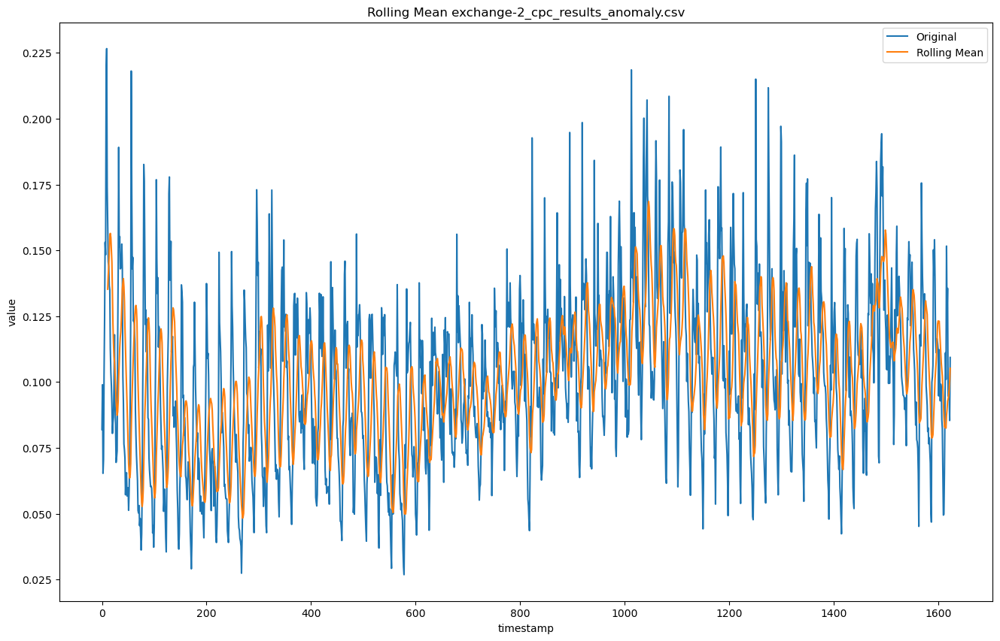

/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/255004051.py:19: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  KPSS_test = kpss(series, regression=reg)


ADF Statistic: -2.457233107834472
p-value: 0.12622965234176275
n_lags: 25
Number of observations:1598
Critical Values:
   1%, -3.4344487706424953
Critical Values:
   5%, -2.8633503662338877
Critical Values:
   10%, -2.567733803393165
KPSS Statistic: 3.277123774558454
p-value: 0.01
n_lags: 21
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


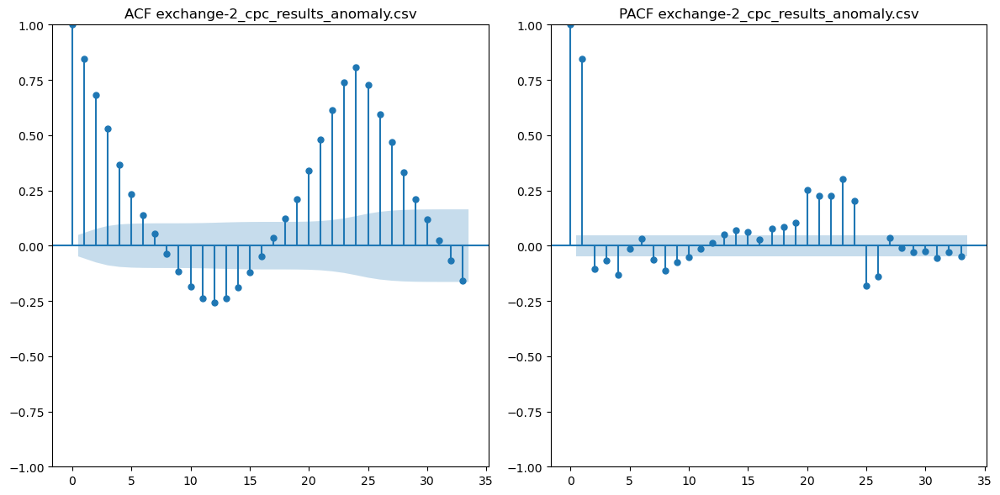

Information about: exchange-2_cpm_results_anomaly.csv


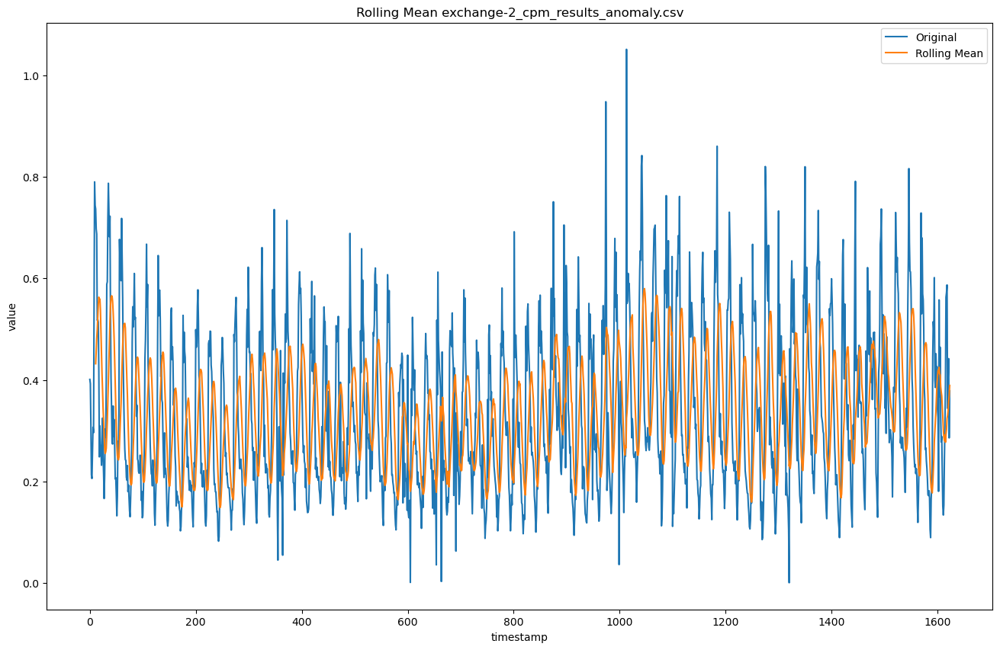

/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/255004051.py:19: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  KPSS_test = kpss(series, regression=reg)


ADF Statistic: -3.092048148050169
p-value: 0.027147285284142567
n_lags: 25
Number of observations:1598
Critical Values:
   1%, -3.4344487706424953
Critical Values:
   5%, -2.8633503662338877
Critical Values:
   10%, -2.567733803393165
KPSS Statistic: 1.6082838905923296
p-value: 0.01
n_lags: 20
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


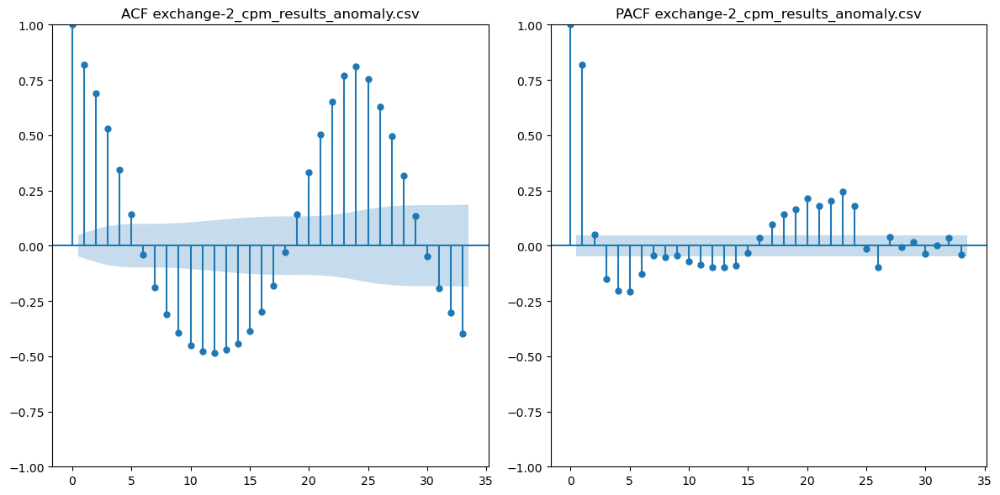

Information about: exchange-3_cpc_results_anomaly.csv


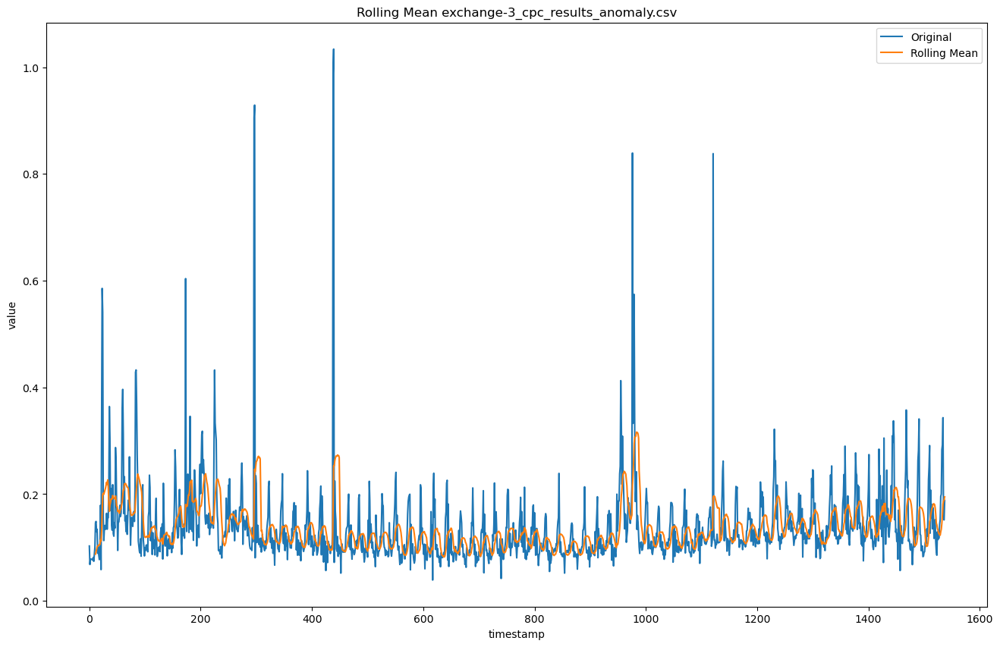

ADF Statistic: -3.7687927990372687
p-value: 0.003243239100412174
n_lags: 24
Number of observations:1513
Critical Values:
   1%, -3.4346794310731665
Critical Values:
   5%, -2.8634521717811046
Critical Values:
   10%, -2.567788014921572
KPSS Statistic: 0.6498970072129311
p-value: 0.018100272071551717
n_lags: 17
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


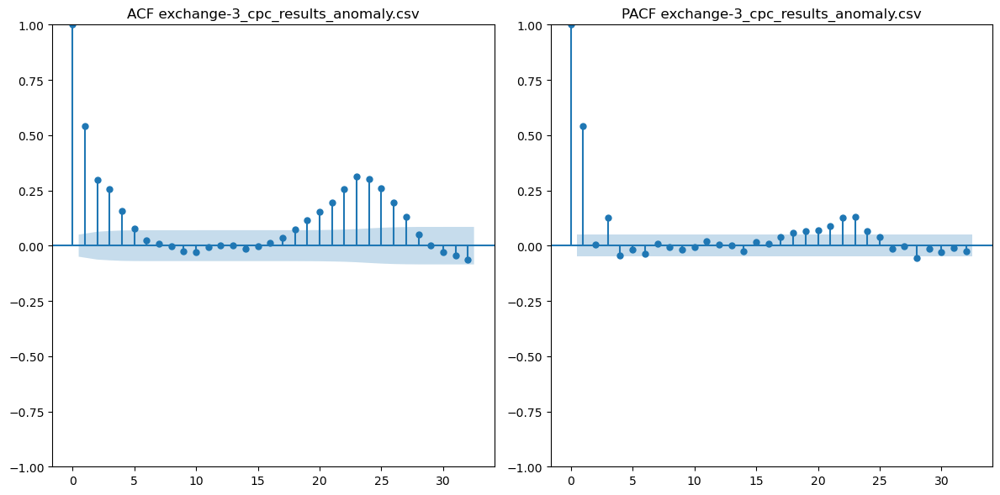

Information about: exchange-4_cpm_results_anomaly.csv


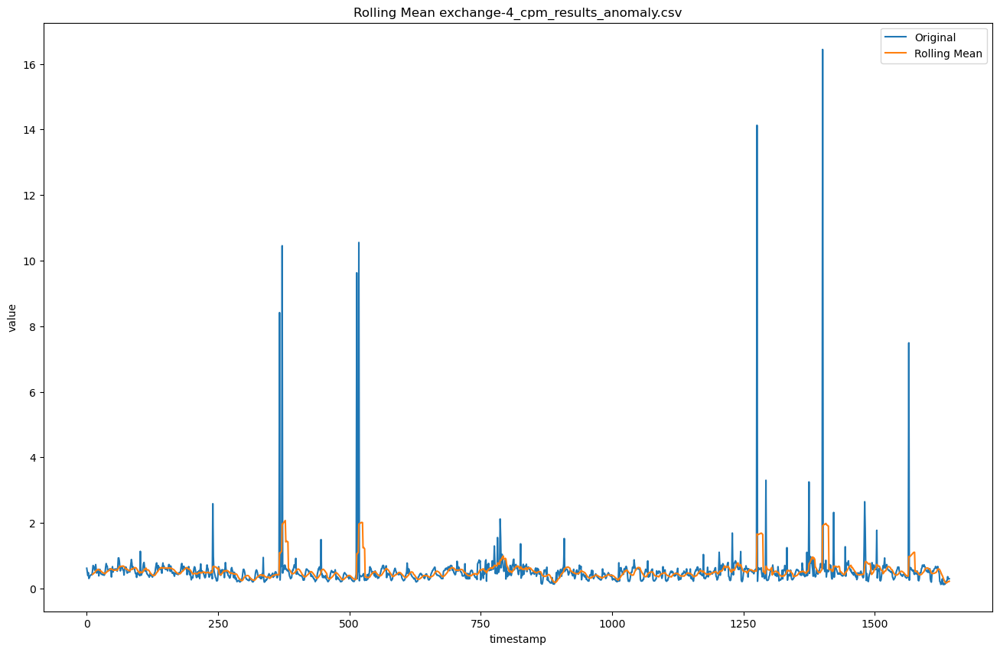

/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/255004051.py:19: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  KPSS_test = kpss(series, regression=reg)


ADF Statistic: -14.453974360624455
p-value: 7.023088505821499e-27
n_lags: 4
Number of observations:1638
Critical Values:
   1%, -3.4343485210432236
Critical Values:
   5%, -2.863306117083598
Critical Values:
   10%, -2.5677102410843804
KPSS Statistic: 0.1700145903396511
p-value: 0.1
n_lags: 16
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


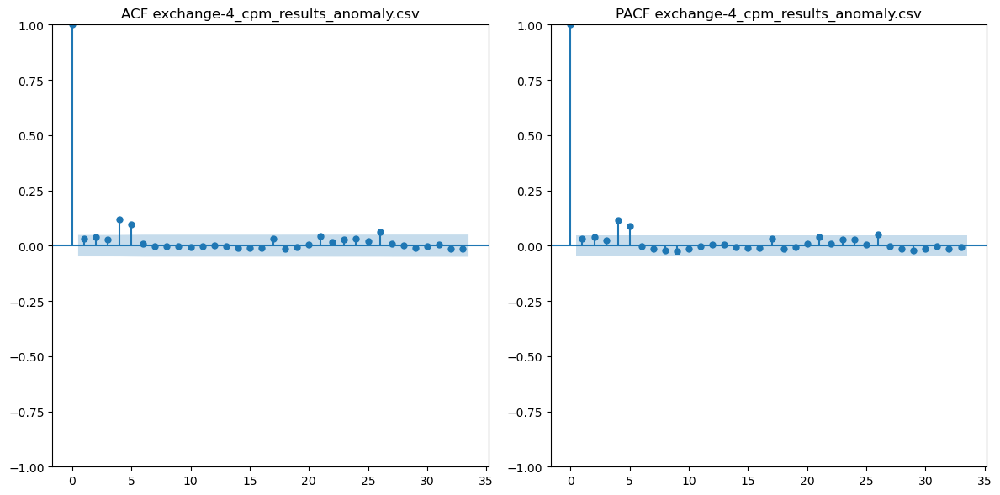

Information about: exchange-4_cpc_results_anomaly.csv


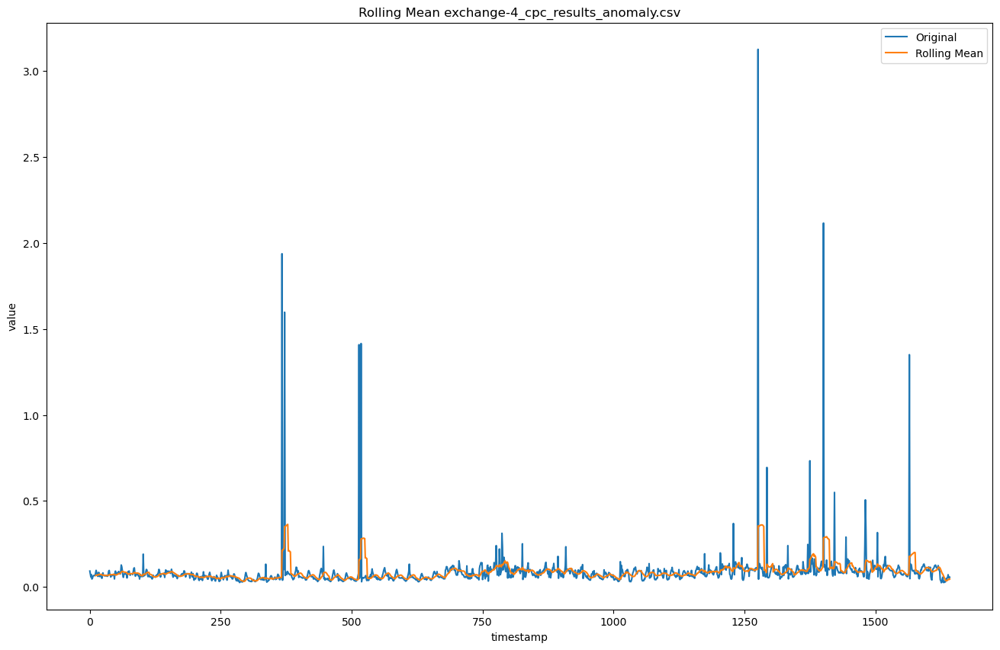

/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/255004051.py:19: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  KPSS_test = kpss(series, regression=reg)


ADF Statistic: -14.08006033734772
p-value: 2.83920502870565e-26
n_lags: 4
Number of observations:1638
Critical Values:
   1%, -3.4343485210432236
Critical Values:
   5%, -2.863306117083598
Critical Values:
   10%, -2.5677102410843804
KPSS Statistic: 1.4713688393242925
p-value: 0.01
n_lags: 17
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


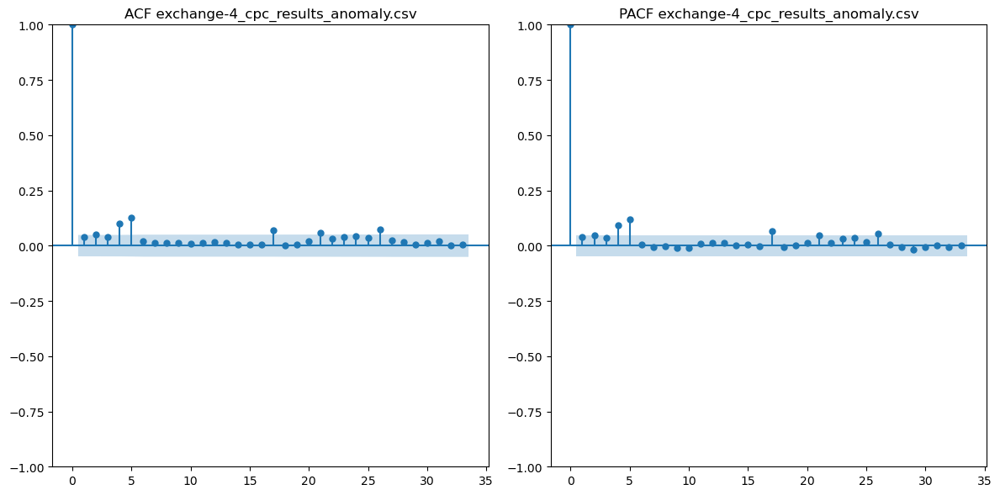

Information about: exchange-3_cpm_results_anomaly.csv


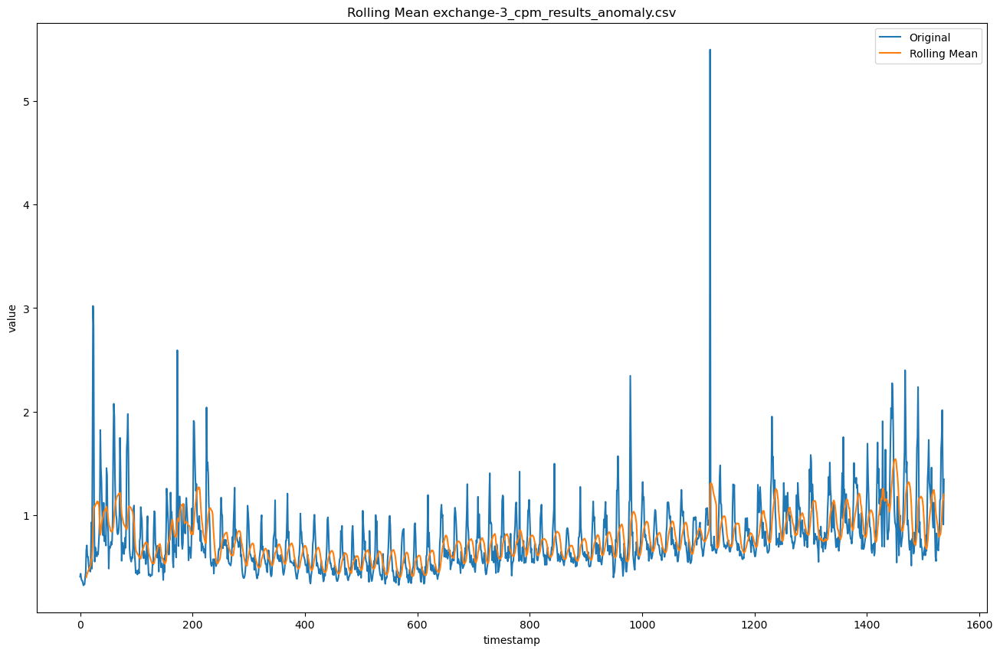

/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/255004051.py:19: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  KPSS_test = kpss(series, regression=reg)


ADF Statistic: -1.982011849362878
p-value: 0.29451554163445637
n_lags: 23
Number of observations:1514
Critical Values:
   1%, -3.4346765666049732
Critical Values:
   5%, -2.8634509075517536
Critical Values:
   10%, -2.5677873417107437
KPSS Statistic: 2.7715238631003563
p-value: 0.01
n_lags: 20
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


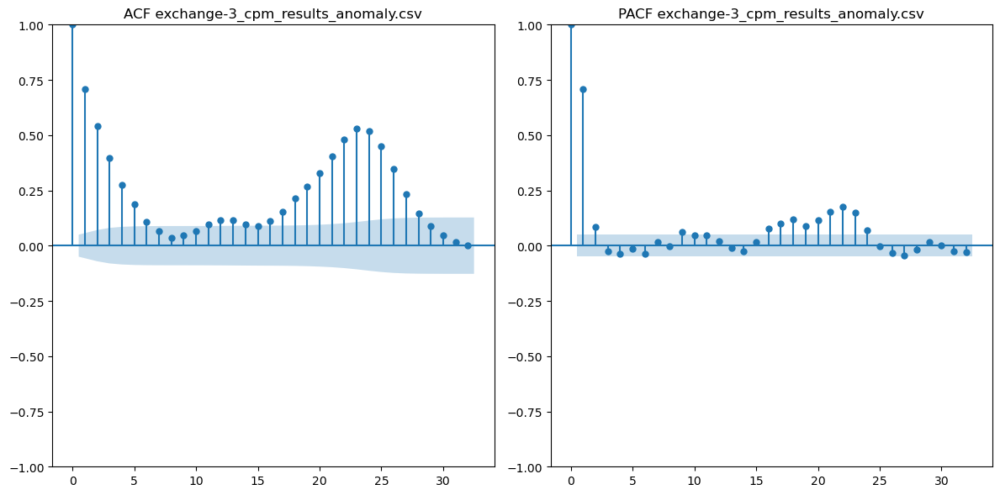

In [22]:
#become file lists
csv_files = glob.glob("NAB_labelled/realAdExchange/*.csv")
file_names = [os.path.basename(file) for file in csv_files]
#print information and plots
for file_name in file_names:
    df = pd.read_csv(f'NAB_labelled/realAdExchange/{file_name}')
    print_information_about_file(df, file_name)

In [23]:
#create a summary information
for i in range(len(regression_ADF_values)):
    regression_ADF = regression_ADF_values[i]
    regression_KPSS = regression_KPSS_values[i]
    for file_name in file_names:
        df = pd.read_csv(f'NAB_labelled/realAdExchange/{file_name}')
        df_info = create_summary_frame(df_info, df, file_name, regression_ADF, regression_KPSS)

/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/255004051.py:19: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  KPSS_test = kpss(series, regression=reg)
/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/1717271452.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_info = df_info.append({'File Name': file_name,
/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/255004051.py:19: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  KPSS_test = kpss(series, regression=reg)
/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/1717271452.py:30: FutureWarning: The frame.append method is deprecated and will be remo

In [24]:
#save the information as .csv file
df_info.to_csv('Summary/Summary_stationarity_NAB_real_AD_exhange.csv',index=False)

Real AWS Cloudwatch

In [25]:
#create an information data frame
columns = ['File Name', 'Length', 'Amount of Anomaly Points', 'ADF Statistic', 'ADF Regression', 'ADF p-value', 'ADF lags', 'ADF Critical Value 10%', 'ADF Critical Value 5%', 'KPSS Statistics', 'KPSS Regression', 'KPSS p-value', 'KPSS Critical Value 10%', 'KPSS Critical Value 5%']
df_info = pd.DataFrame(columns=columns)
regression_ADF_values = ['c', 'n', 'ct', 'ctt']
regression_KPSS_values = ['c', 'c', 'ct', 'ct']

Information about: ec2_disk_write_bytes_c0d644_anomaly.csv


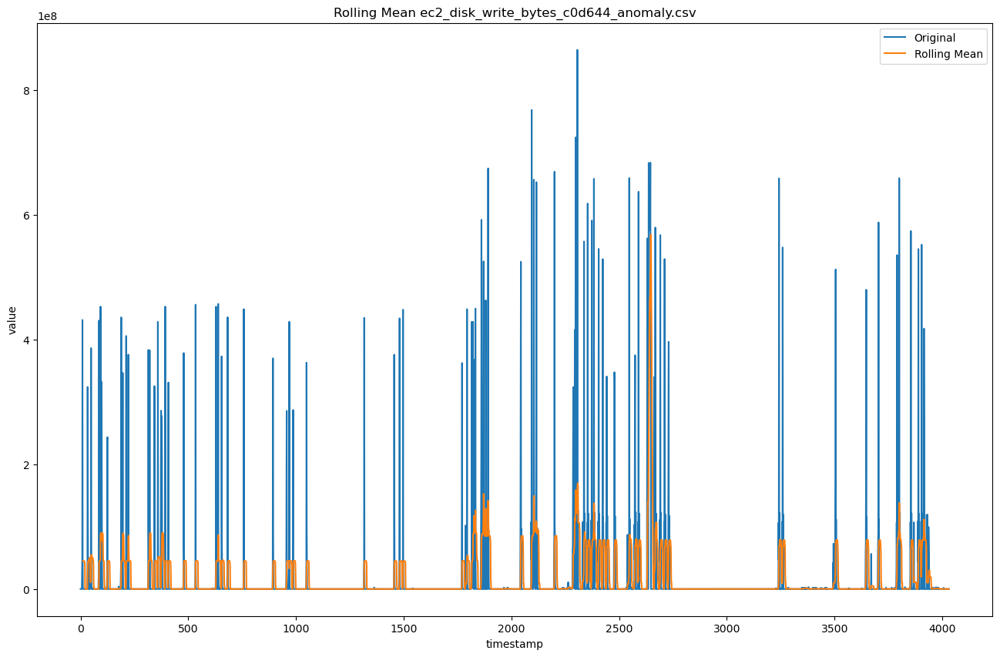

/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/255004051.py:19: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  KPSS_test = kpss(series, regression=reg)


ADF Statistic: -11.280685787930011
p-value: 1.458782797318559e-20
n_lags: 18
Number of observations:4013
Critical Values:
   1%, -3.431980572598556
Critical Values:
   5%, -2.8622604977715755
Critical Values:
   10%, -2.5671535285260605
KPSS Statistic: 0.25392223737506364
p-value: 0.1
n_lags: 28
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


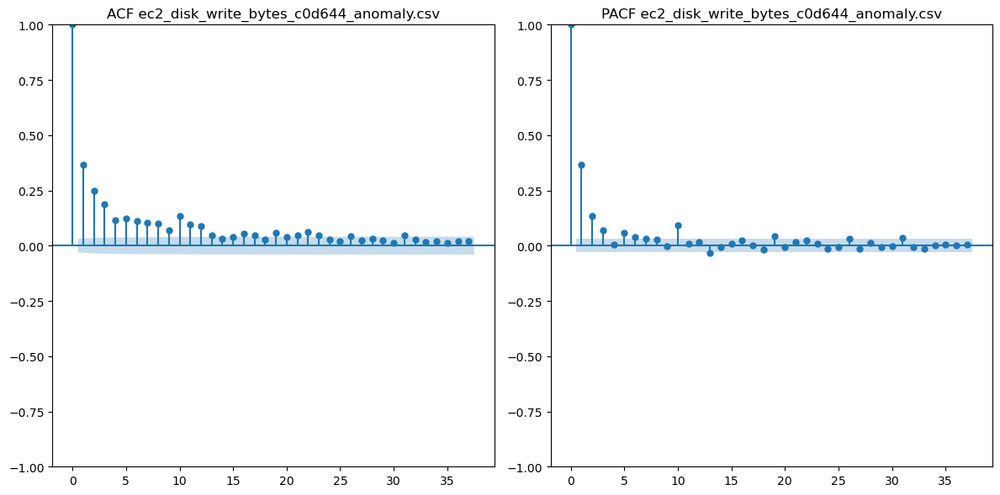

Information about: ec2_network_in_5abac7_anomaly.csv


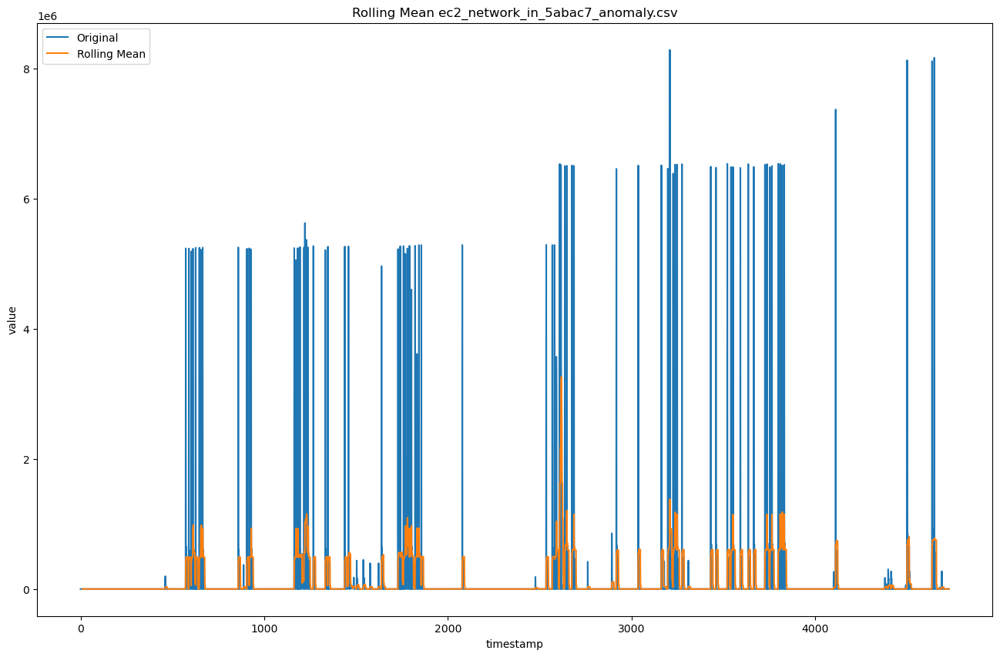

/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/255004051.py:19: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  KPSS_test = kpss(series, regression=reg)


ADF Statistic: -8.360852896908487
p-value: 2.8262880799837784e-13
n_lags: 28
Number of observations:4701
Critical Values:
   1%, -3.4317418047913173
Critical Values:
   5%, -2.862155018606945
Critical Values:
   10%, -2.567097376628896
KPSS Statistic: 0.23909901923413893
p-value: 0.1
n_lags: 15
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


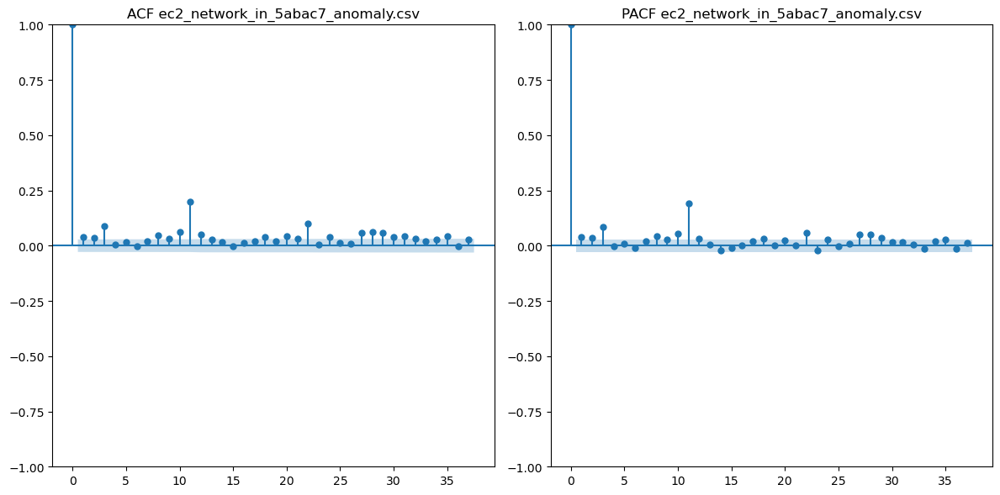

Information about: rds_cpu_utilization_cc0c53_anomaly.csv


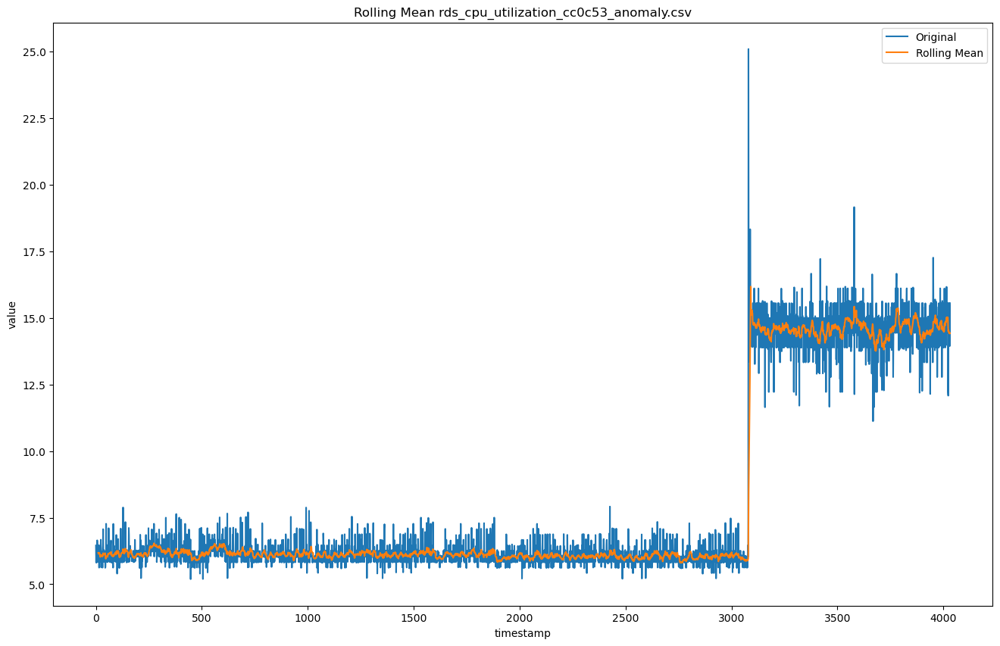

/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/255004051.py:19: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  KPSS_test = kpss(series, regression=reg)


ADF Statistic: -0.6320219396958835
p-value: 0.8635809919522153
n_lags: 28
Number of observations:4003
Critical Values:
   1%, -3.431984648591583
Critical Values:
   5%, -2.862262298327622
Critical Values:
   10%, -2.5671544870656278
KPSS Statistic: 6.0522877080203585
p-value: 0.01
n_lags: 39
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


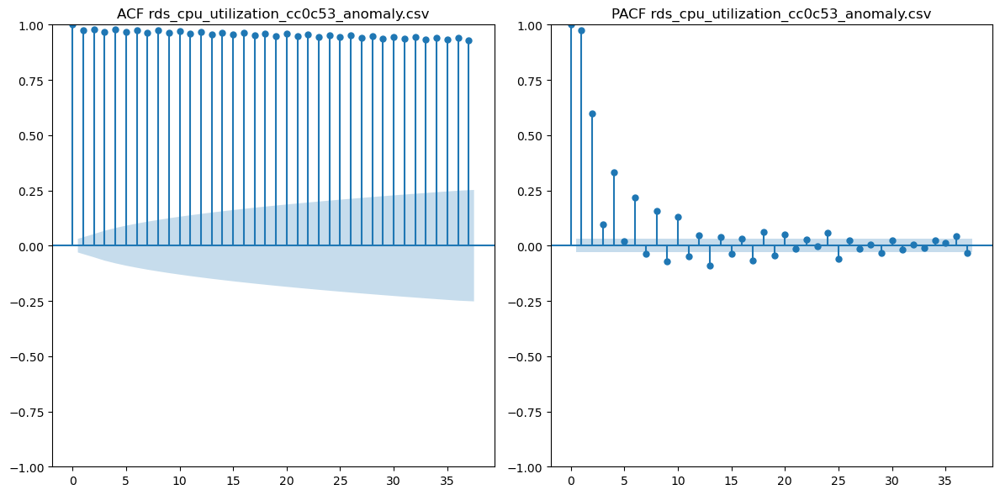

Information about: ec2_cpu_utilization_fe7f93_anomaly.csv


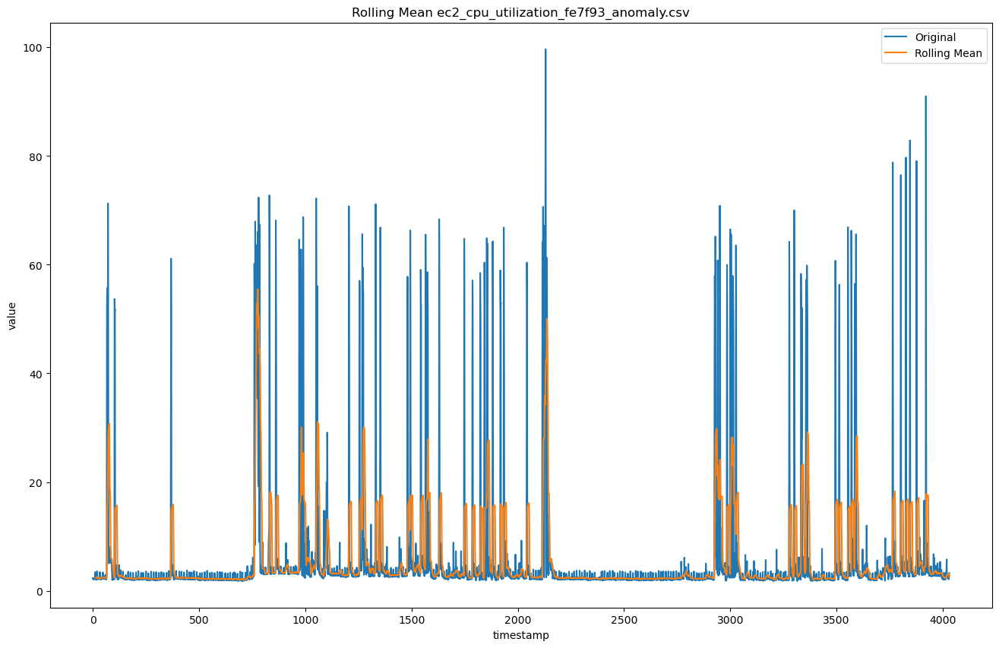

/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/255004051.py:19: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  KPSS_test = kpss(series, regression=reg)


ADF Statistic: -10.604609749186894
p-value: 6.047717222243296e-19
n_lags: 17
Number of observations:4014
Critical Values:
   1%, -3.4319801661169578
Critical Values:
   5%, -2.862260318209578
Critical Values:
   10%, -2.5671534329349024
KPSS Statistic: 0.12912957348607954
p-value: 0.1
n_lags: 28
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


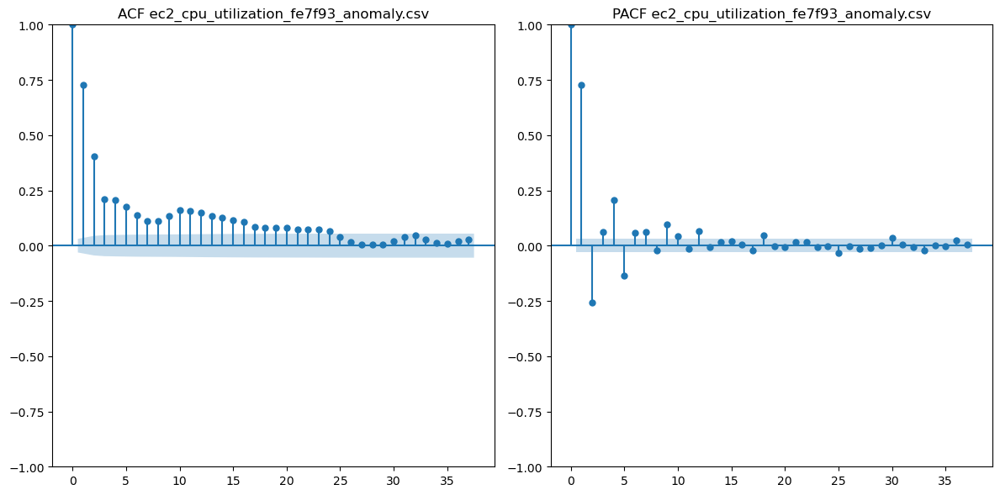

Information about: ec2_cpu_utilization_825cc2_anomaly.csv


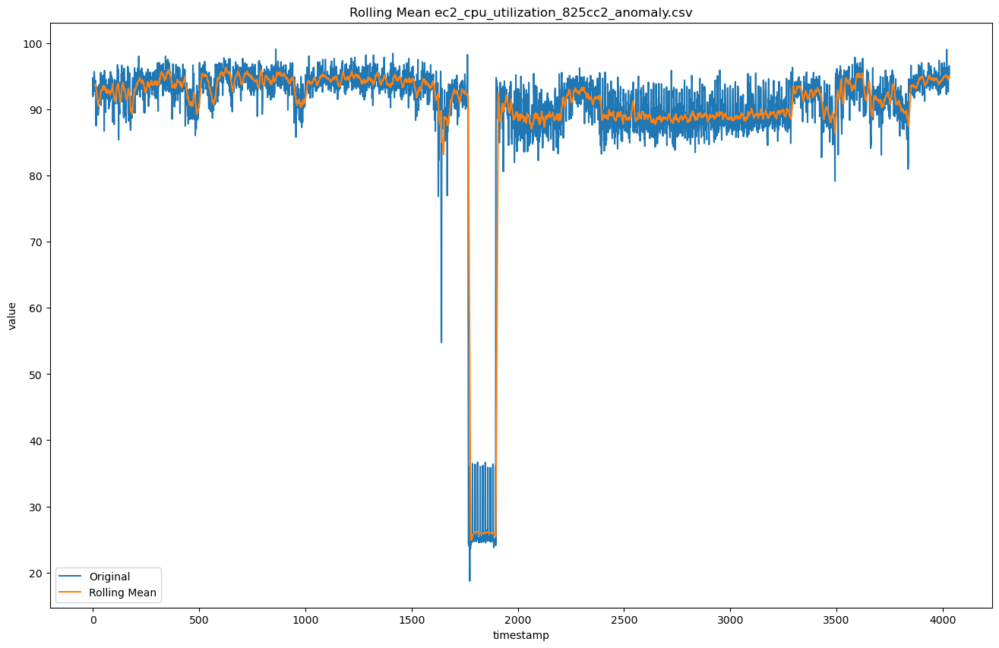

ADF Statistic: -4.234294501716964
p-value: 0.0005761516001126831
n_lags: 25
Number of observations:4006
Critical Values:
   1%, -3.4319834236556113
Critical Values:
   5%, -2.8622617572165847
Critical Values:
   10%, -2.567154199001049
KPSS Statistic: 0.43375065031916715
p-value: 0.06260747831070382
n_lags: 39
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


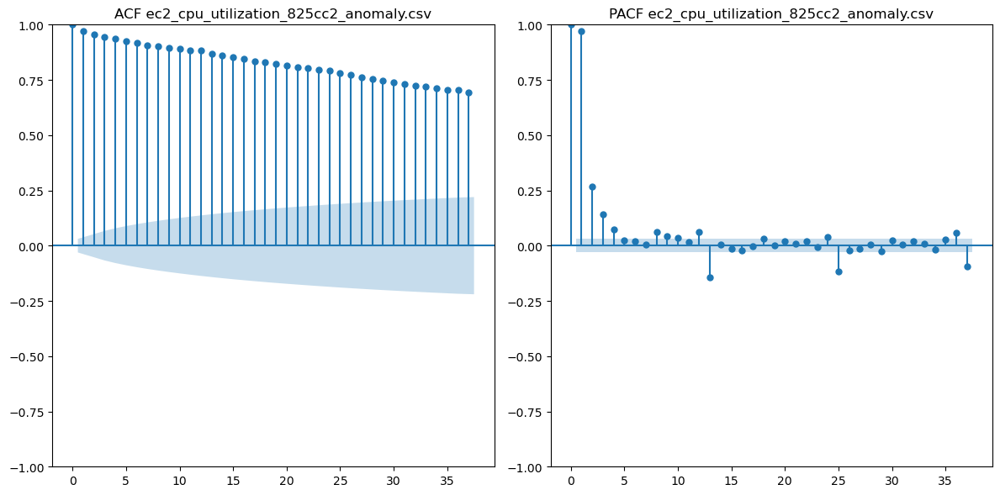

Information about: ec2_network_in_257a54_anomaly.csv


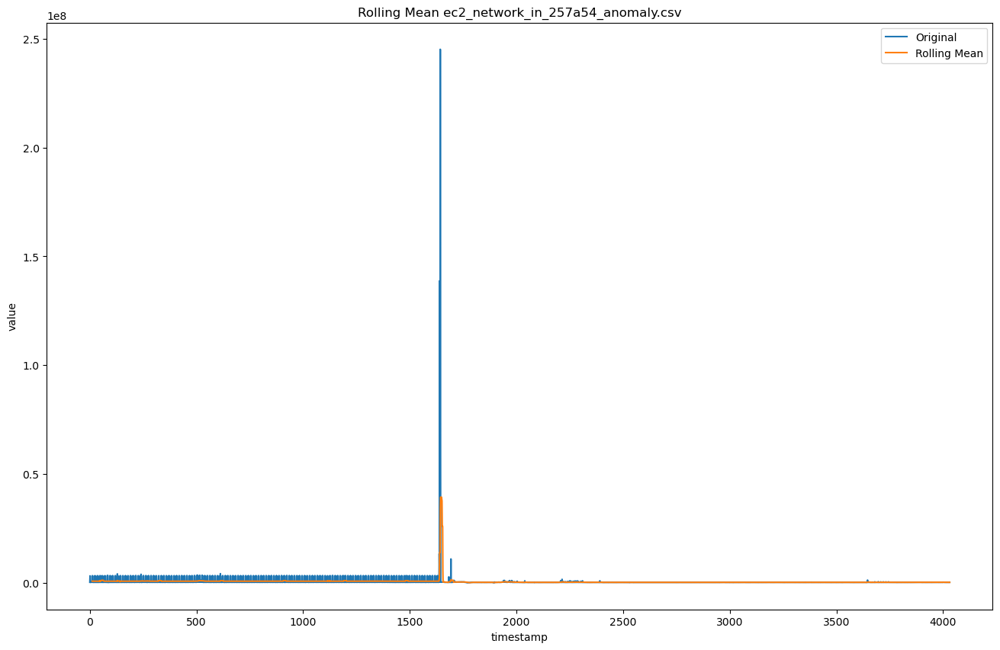

ADF Statistic: -10.355116564168092
p-value: 2.478233582984095e-18
n_lags: 31
Number of observations:4000
Critical Values:
   1%, -3.4319858753661405
Critical Values:
   5%, -2.8622628402506254
Critical Values:
   10%, -2.5671547755625
KPSS Statistic: 0.688035223186413
p-value: 0.01463316152850791
n_lags: 25
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


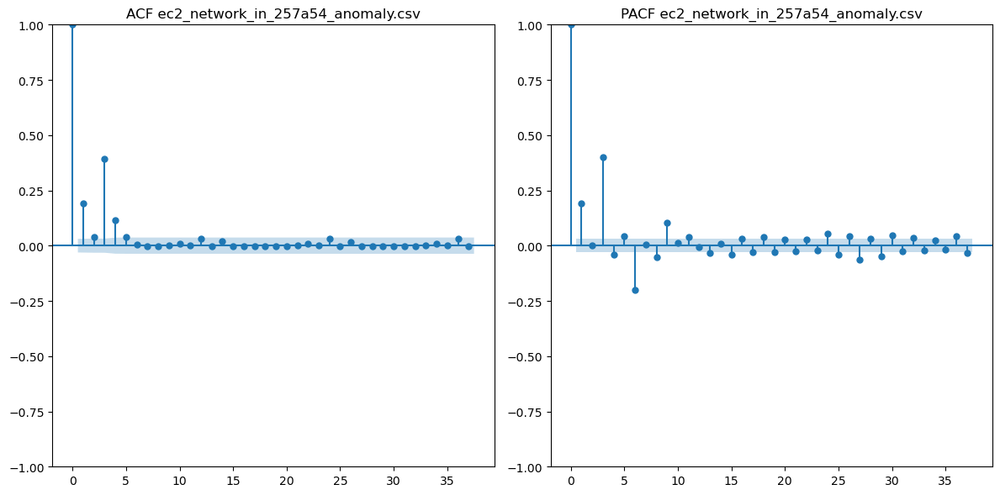

Information about: elb_request_count_8c0756_anomaly.csv


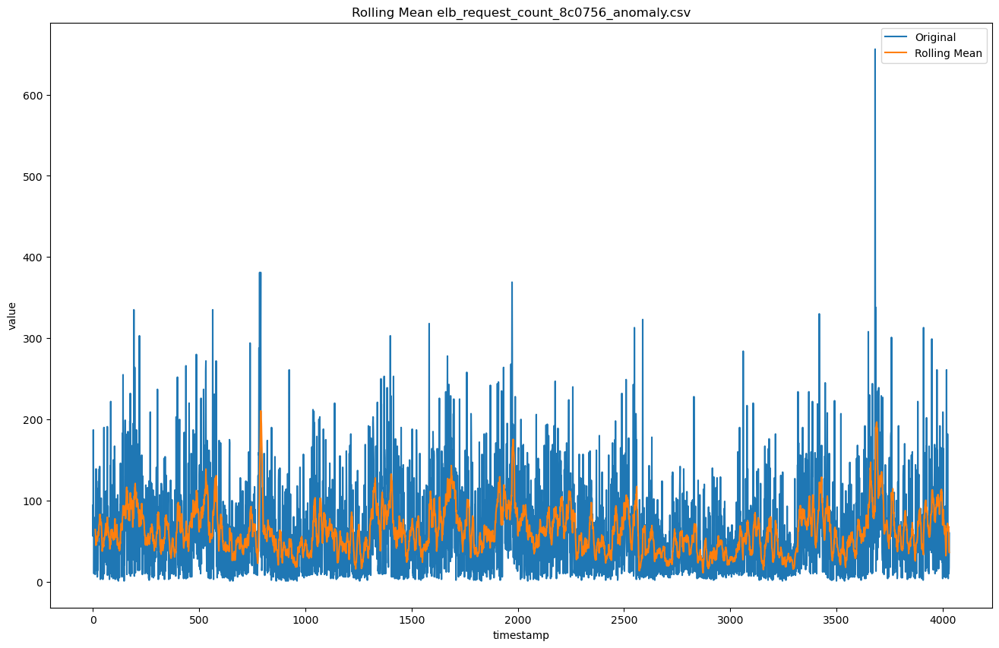

ADF Statistic: -6.6201619320478455
p-value: 6.065341739854626e-09
n_lags: 29
Number of observations:4002
Critical Values:
   1%, -3.4319850573119437
Critical Values:
   5%, -2.8622624788783146
Critical Values:
   10%, -2.567154583183171
KPSS Statistic: 0.35778396738063994
p-value: 0.09535173819800002
n_lags: 29
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


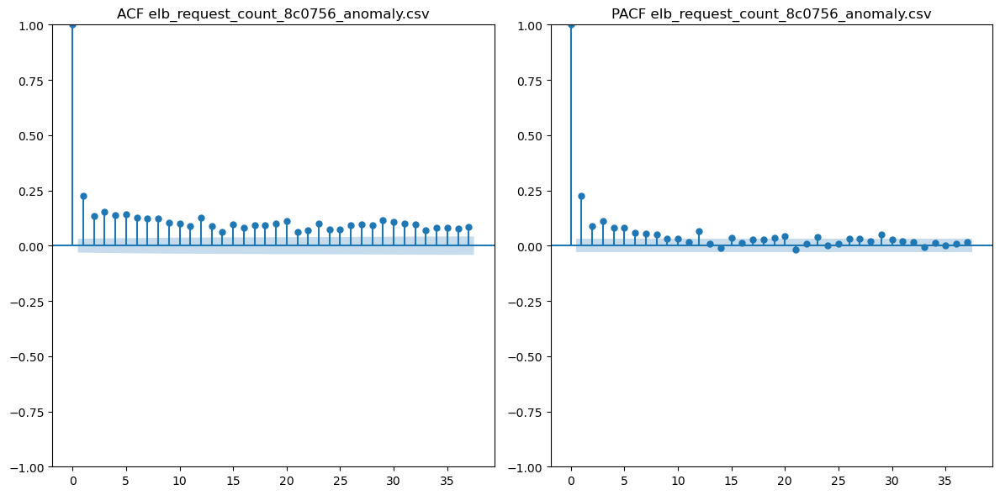

Information about: ec2_cpu_utilization_5f5533_anomaly.csv


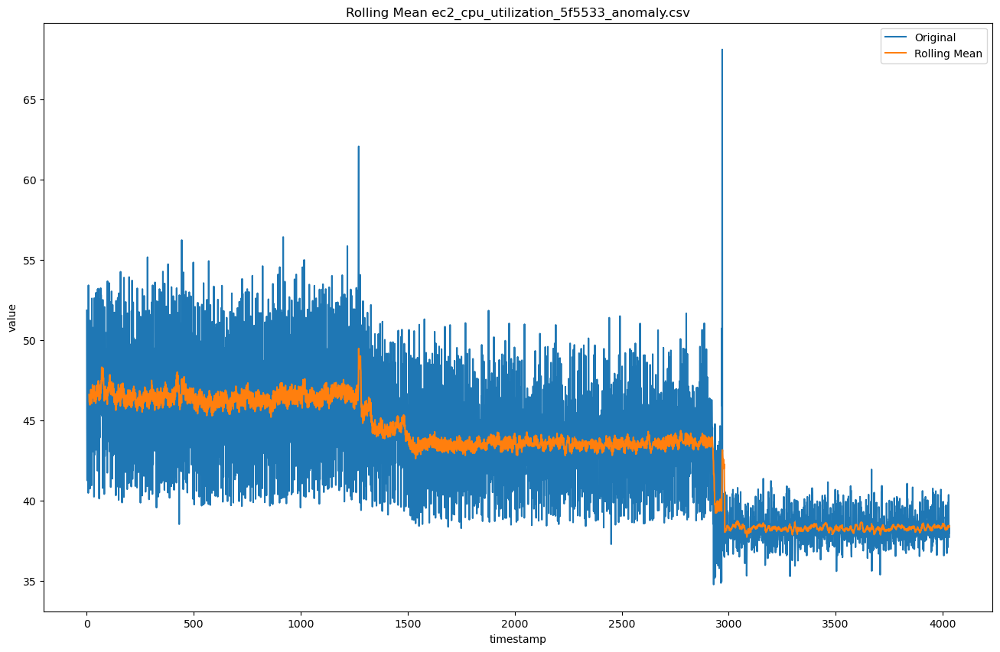

/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/255004051.py:19: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  KPSS_test = kpss(series, regression=reg)


ADF Statistic: -0.7335076896084122
p-value: 0.837878364104657
n_lags: 28
Number of observations:4003
Critical Values:
   1%, -3.431984648591583
Critical Values:
   5%, -2.862262298327622
Critical Values:
   10%, -2.5671544870656278
KPSS Statistic: 8.888223982962968
p-value: 0.01
n_lags: 39
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


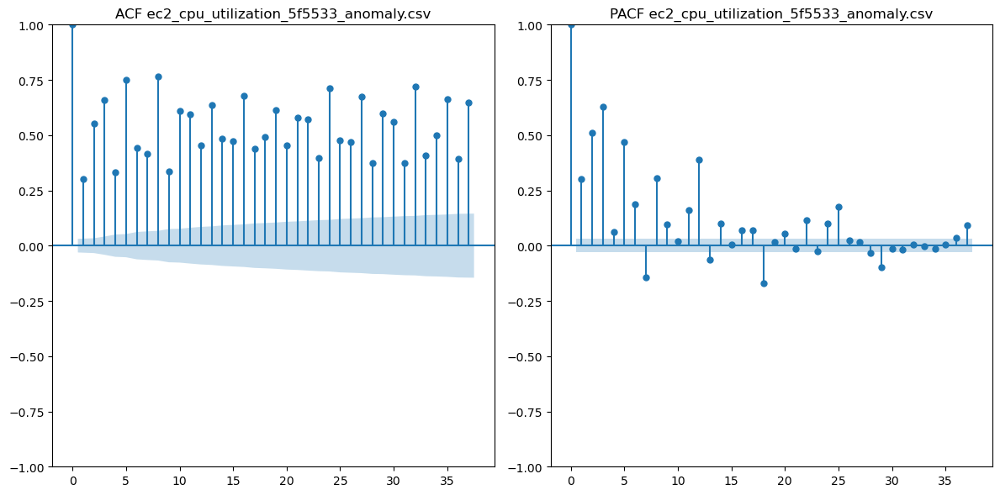

Information about: ec2_cpu_utilization_53ea38_anomaly.csv


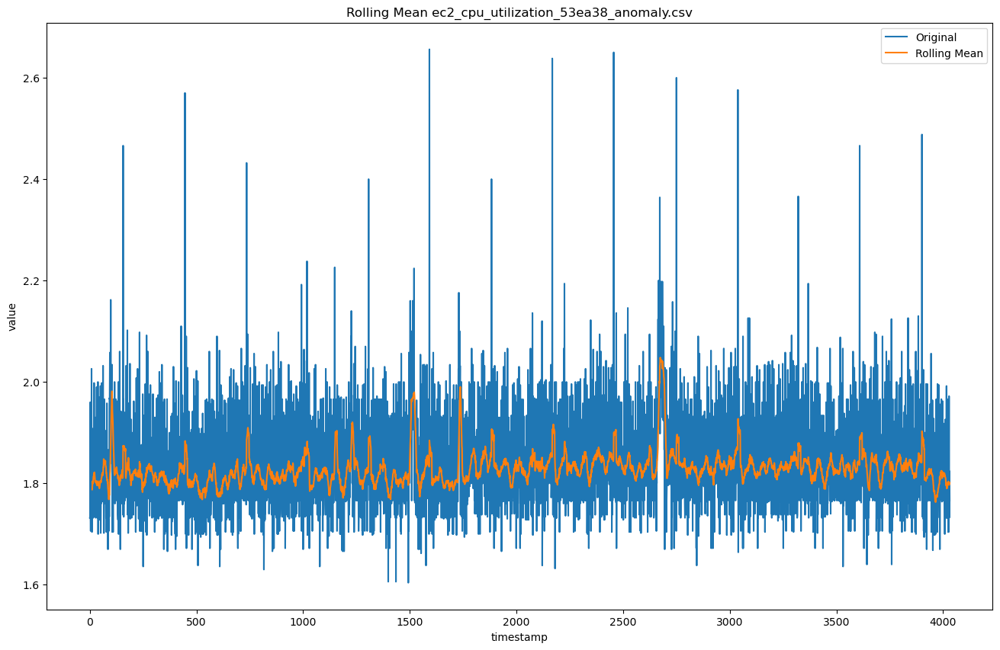

/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/255004051.py:19: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  KPSS_test = kpss(series, regression=reg)


ADF Statistic: -9.841901893567485
p-value: 4.729072075495008e-17
n_lags: 29
Number of observations:4002
Critical Values:
   1%, -3.4319850573119437
Critical Values:
   5%, -2.8622624788783146
Critical Values:
   10%, -2.567154583183171
KPSS Statistic: 1.2274485308458882
p-value: 0.01
n_lags: 41
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


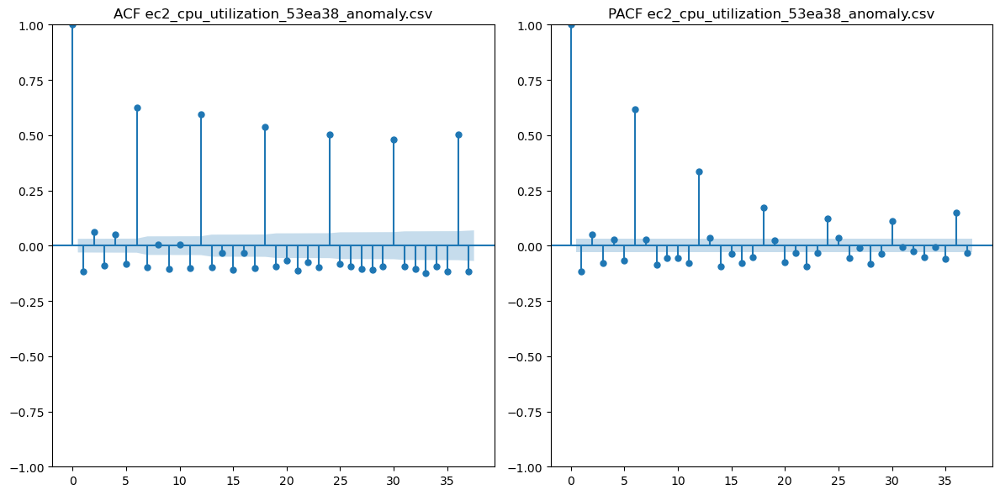

Information about: iio_us-east-1_i-a2eb1cd9_NetworkIn_anomaly.csv


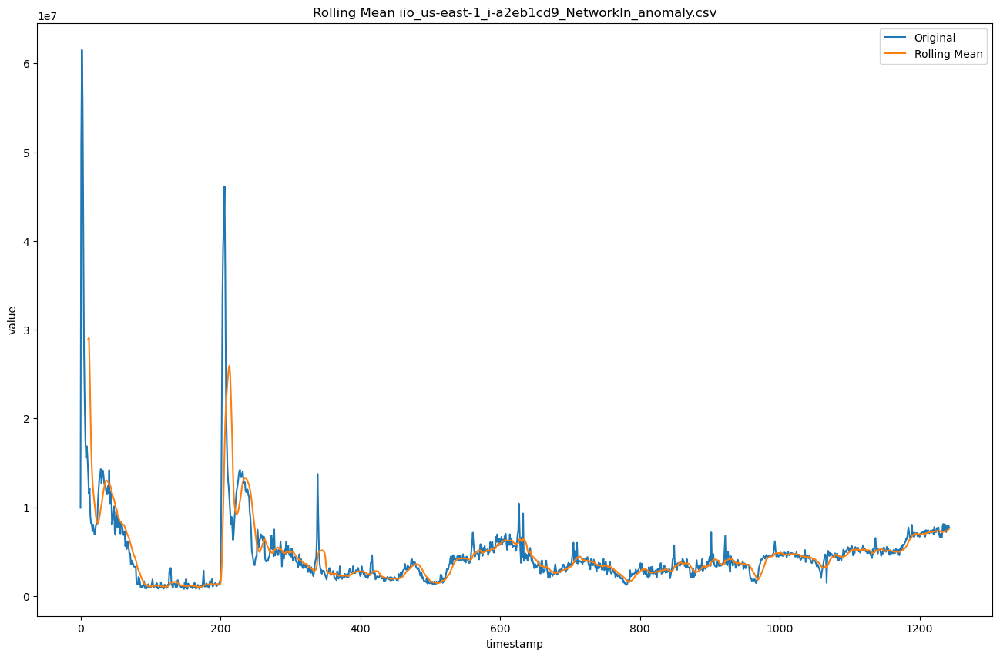

ADF Statistic: -5.902388807287285
p-value: 2.758511088482325e-07
n_lags: 13
Number of observations:1229
Critical Values:
   1%, -3.4356819860439574
Critical Values:
   5%, -2.863894574114006
Critical Values:
   10%, -2.568023609111511
KPSS Statistic: 0.42652072349504216
p-value: 0.06572382607972321
n_lags: 19
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


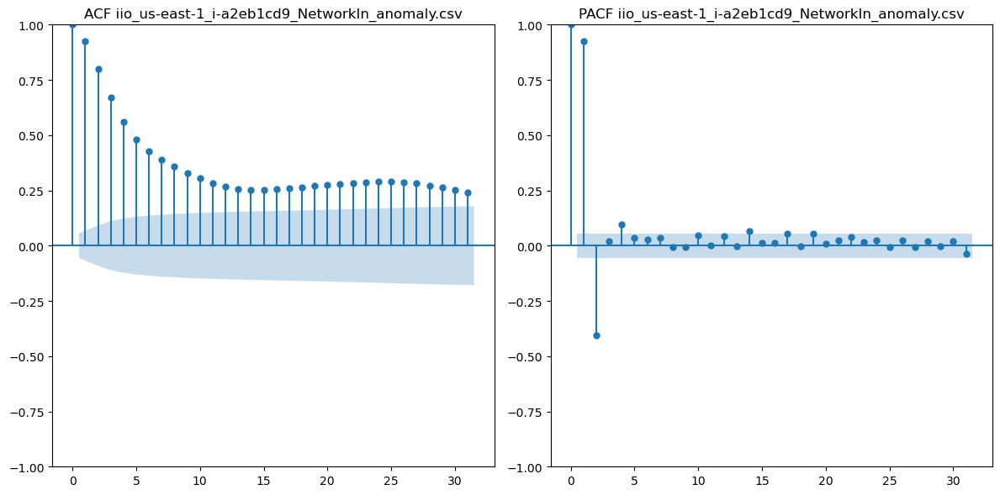

Information about: rds_cpu_utilization_e47b3b_anomaly.csv


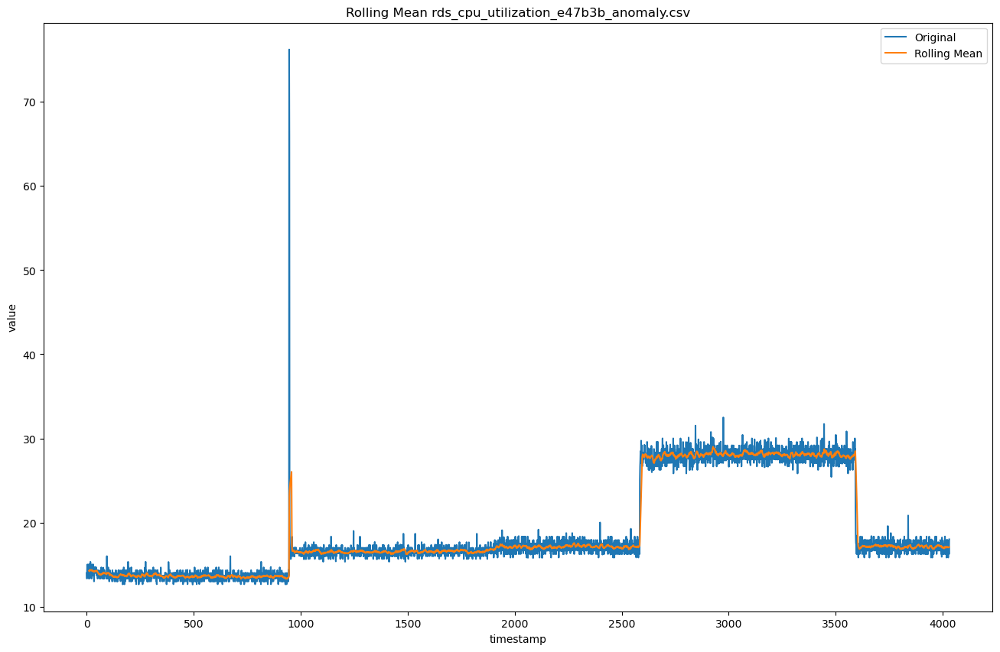

/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/255004051.py:19: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  KPSS_test = kpss(series, regression=reg)


ADF Statistic: -1.638642096991737
p-value: 0.46297042446551534
n_lags: 25
Number of observations:4006
Critical Values:
   1%, -3.4319834236556113
Critical Values:
   5%, -2.8622617572165847
Critical Values:
   10%, -2.567154199001049
KPSS Statistic: 5.63499151910609
p-value: 0.01
n_lags: 39
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


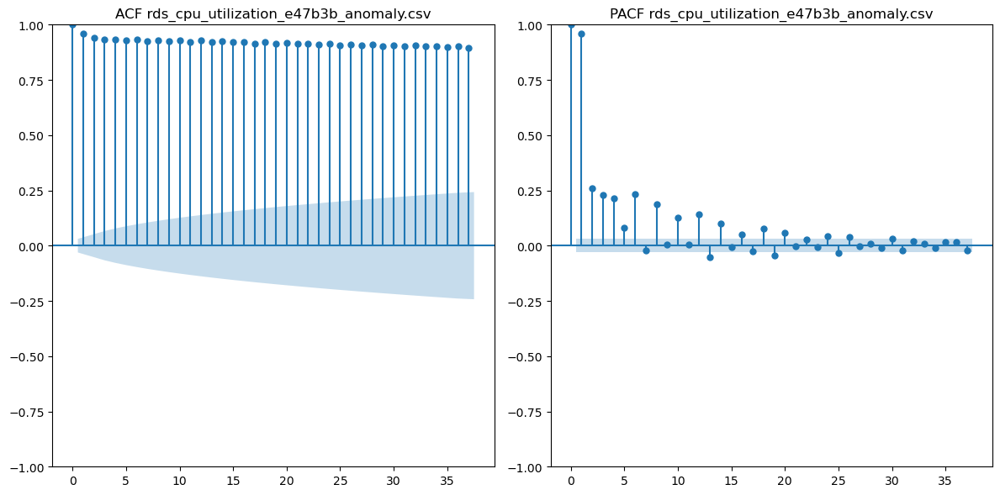

Information about: ec2_cpu_utilization_c6585a_anomaly.csv


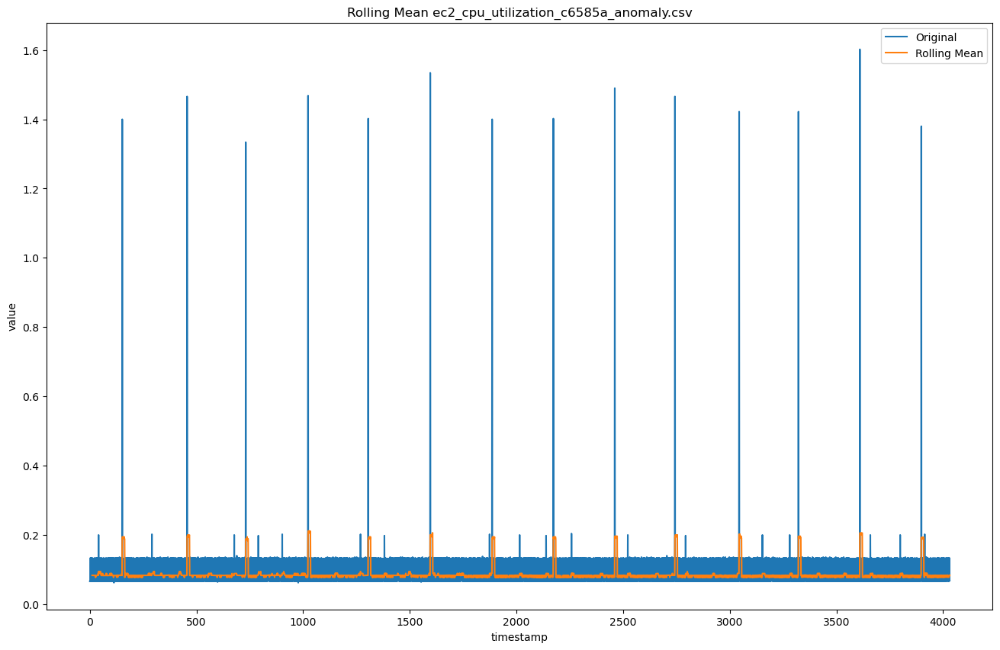

/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/255004051.py:19: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  KPSS_test = kpss(series, regression=reg)


ADF Statistic: -47.09936870158161
p-value: 0.0
n_lags: 1
Number of observations:4030
Critical Values:
   1%, -3.431973689863888
Critical Values:
   5%, -2.862257457341372
Critical Values:
   10%, -2.5671519099310998
KPSS Statistic: 0.0449071977569188
p-value: 0.1
n_lags: 7
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


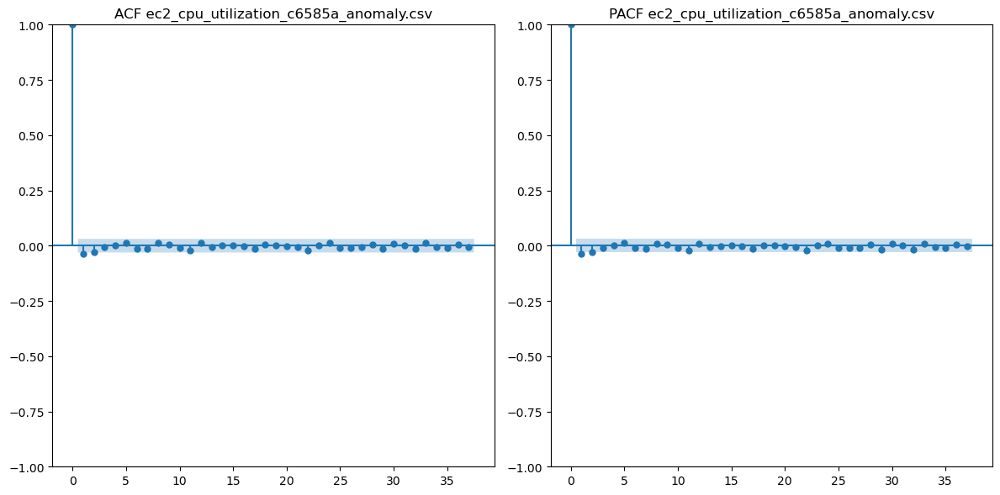

Information about: ec2_cpu_utilization_ac20cd_anomaly.csv


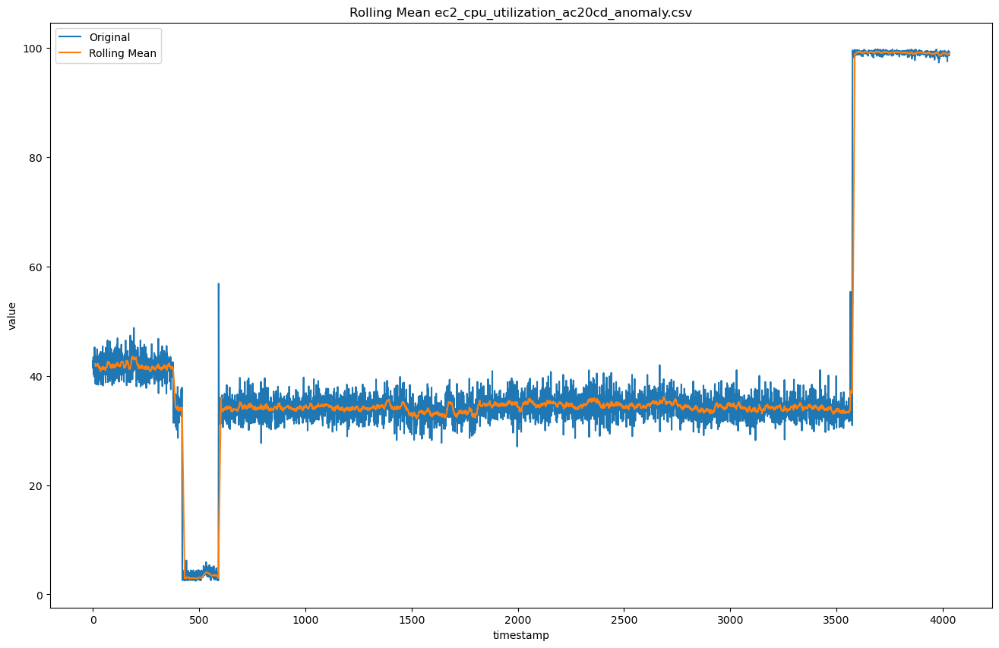

/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/255004051.py:19: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  KPSS_test = kpss(series, regression=reg)


ADF Statistic: -0.8536453954549702
p-value: 0.8028543196998938
n_lags: 24
Number of observations:4007
Critical Values:
   1%, -3.4319830157514812
Critical Values:
   5%, -2.86226157702636
Critical Values:
   10%, -2.56715410307542
KPSS Statistic: 3.41373581772213
p-value: 0.01
n_lags: 39
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


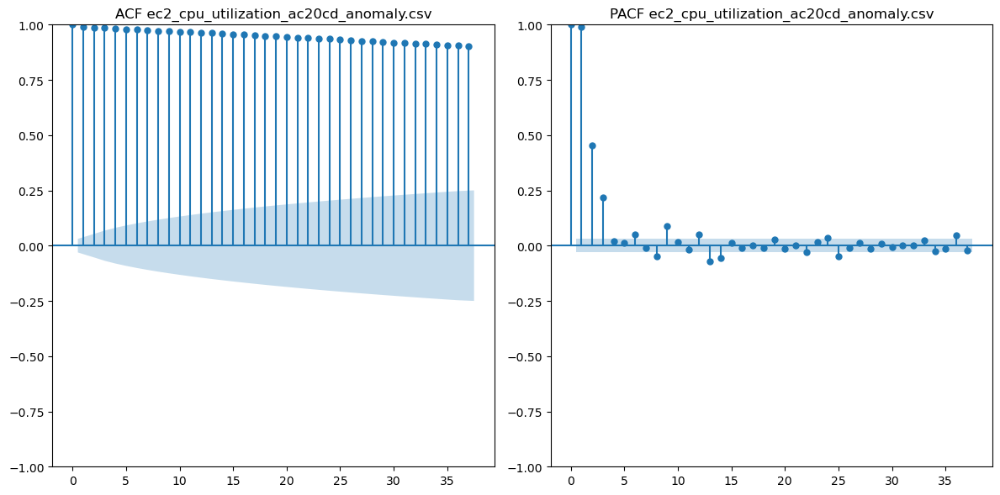

Information about: ec2_cpu_utilization_24ae8d_anomaly.csv


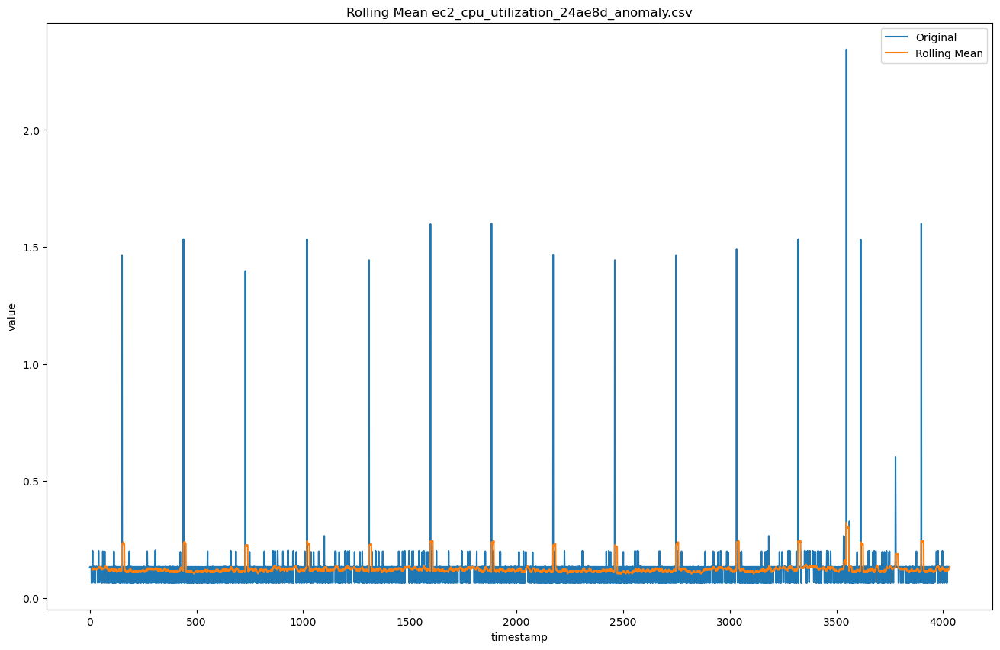

/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/255004051.py:19: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  KPSS_test = kpss(series, regression=reg)


ADF Statistic: -46.92283631890565
p-value: 0.0
n_lags: 1
Number of observations:4030
Critical Values:
   1%, -3.431973689863888
Critical Values:
   5%, -2.862257457341372
Critical Values:
   10%, -2.5671519099310998
KPSS Statistic: 0.2084950631443226
p-value: 0.1
n_lags: 8
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


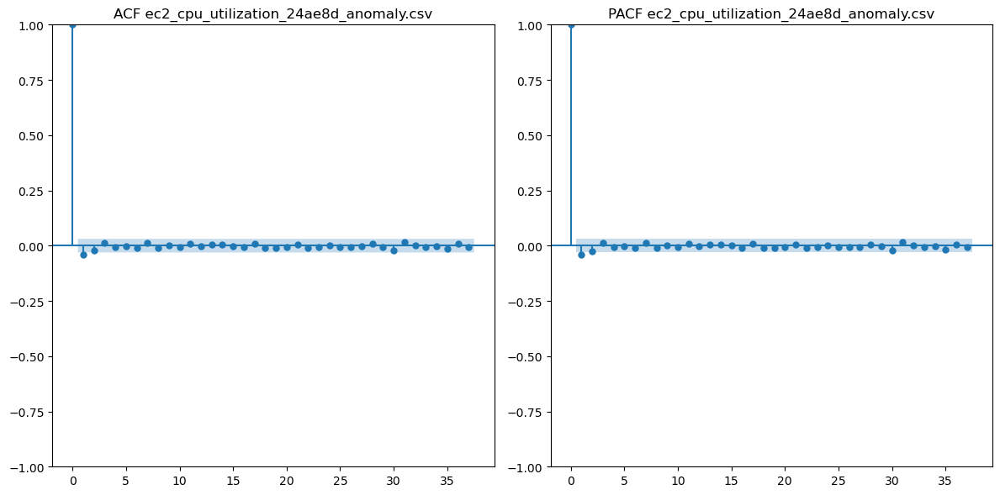

Information about: ec2_cpu_utilization_77c1ca_anomaly.csv


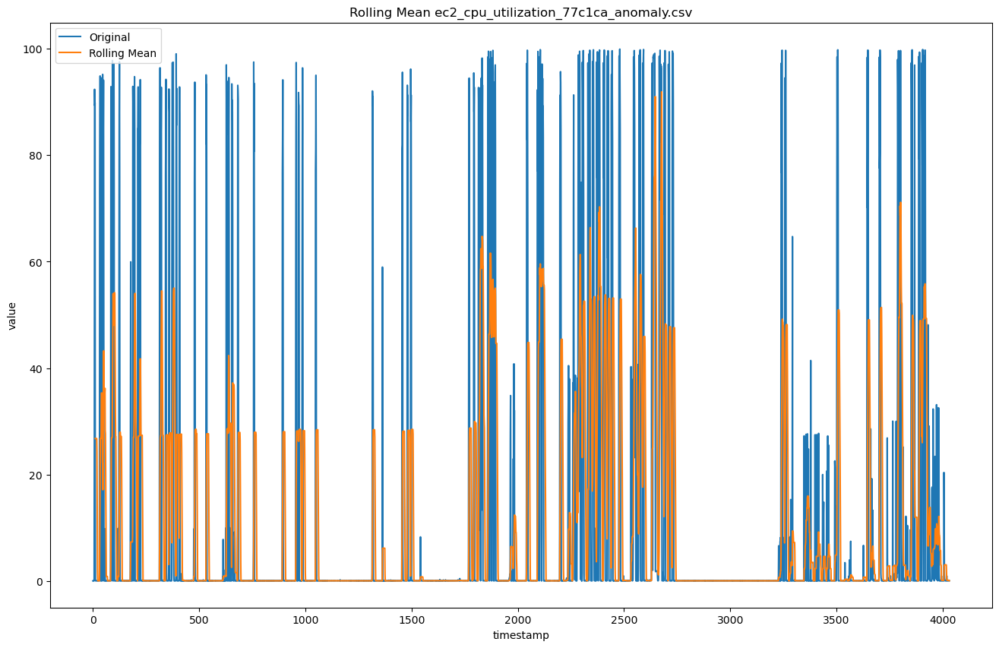

/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/255004051.py:19: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  KPSS_test = kpss(series, regression=reg)


ADF Statistic: -11.024359034364663
p-value: 5.878852699937138e-20
n_lags: 15
Number of observations:4016
Critical Values:
   1%, -3.431979353761444
Critical Values:
   5%, -2.8622599593539513
Critical Values:
   10%, -2.567153241895466
KPSS Statistic: 0.31893512560113896
p-value: 0.1
n_lags: 29
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


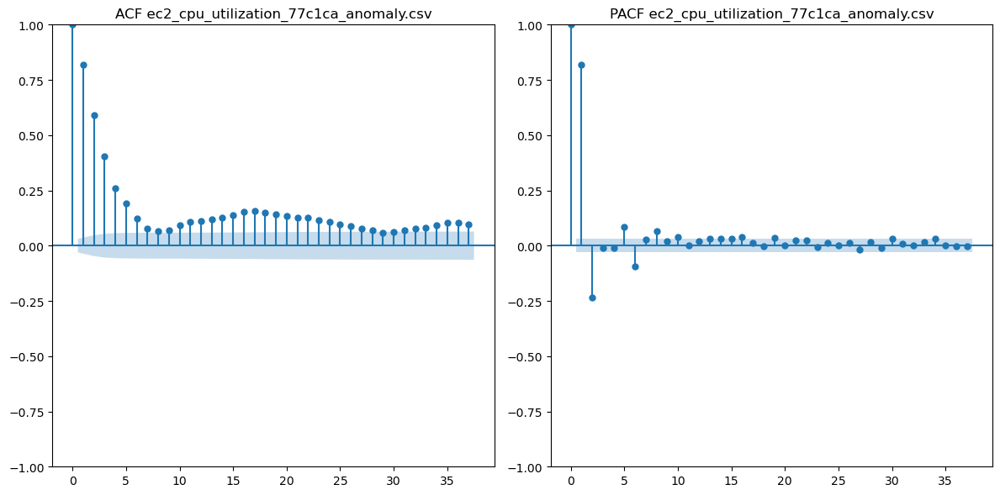

Information about: grok_asg_anomaly.csv


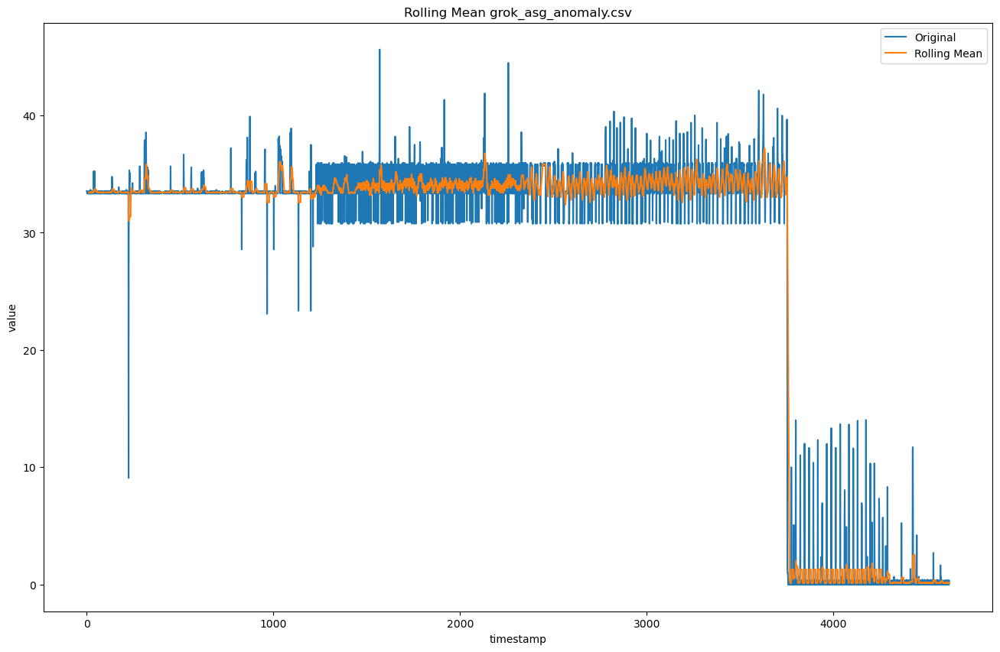

/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/255004051.py:19: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  KPSS_test = kpss(series, regression=reg)


ADF Statistic: -0.6872306404260786
p-value: 0.850029422619869
n_lags: 27
Number of observations:4593
Critical Values:
   1%, -3.4317745500669052
Critical Values:
   5%, -2.862169484810712
Critical Values:
   10%, -2.5671050776361515
KPSS Statistic: 5.5067491541692055
p-value: 0.01
n_lags: 41
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


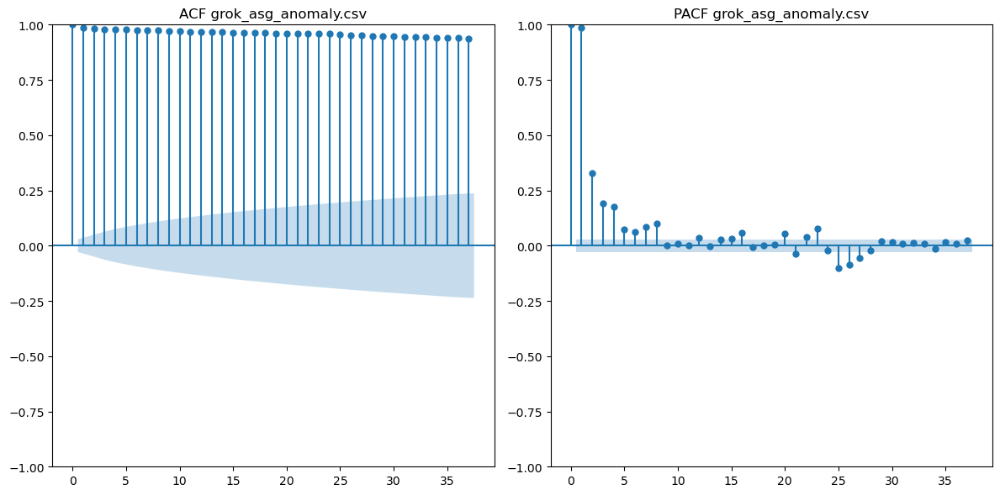

Information about: ec2_disk_write_bytes_1ef3de_anomaly.csv


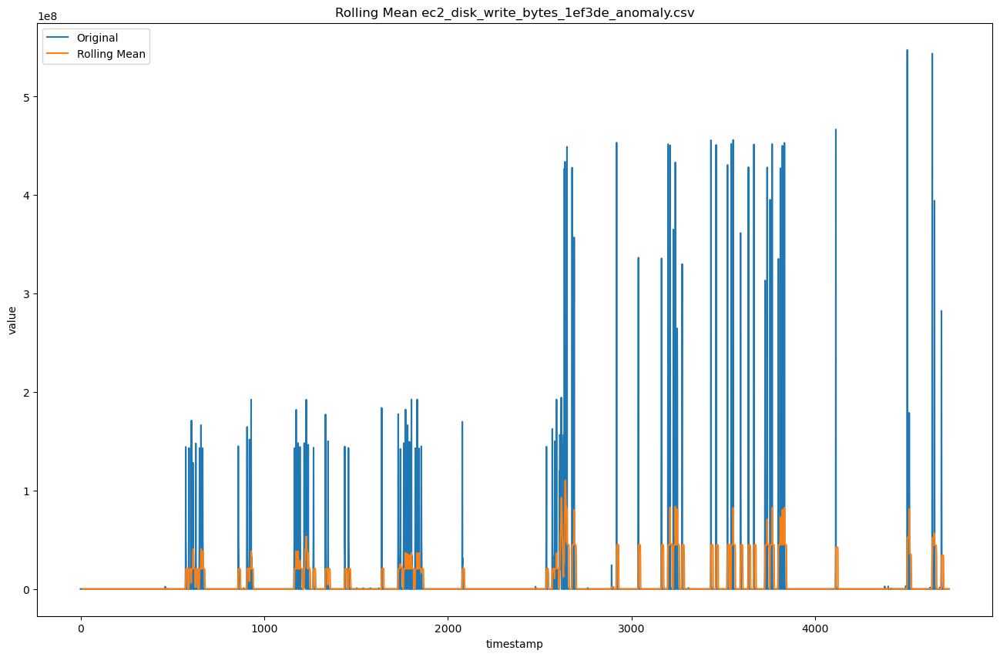

/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/255004051.py:19: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  KPSS_test = kpss(series, regression=reg)


ADF Statistic: -8.892912741858707
p-value: 1.2286741976235979e-14
n_lags: 27
Number of observations:4702
Critical Values:
   1%, -3.4317415086267644
Critical Values:
   5%, -2.86215488776668
Critical Values:
   10%, -2.567097306976895
KPSS Statistic: 1.0535635227522098
p-value: 0.01
n_lags: 9
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


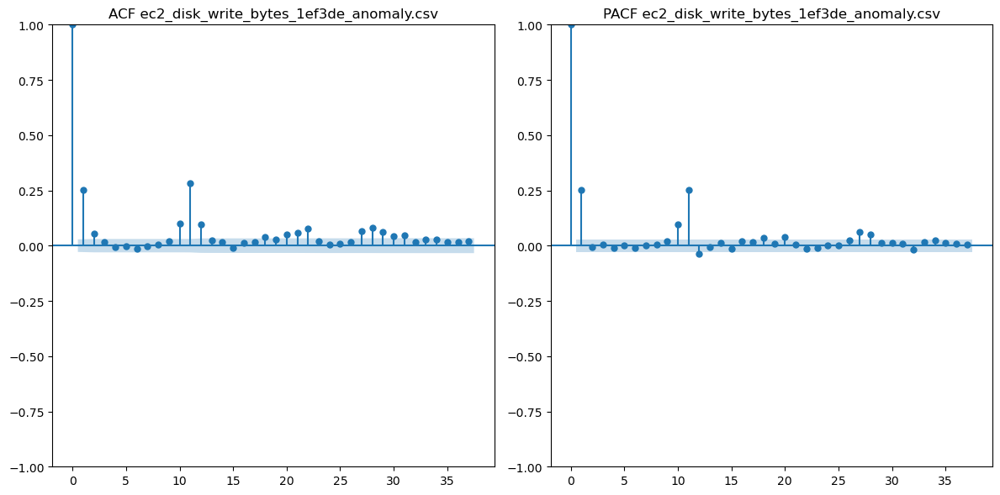

In [26]:
#become file lists
csv_files = glob.glob("NAB_labelled/realAWSCloudwatch/*.csv")
file_names = [os.path.basename(file) for file in csv_files]

#print information and plots
for file_name in file_names:
    df = pd.read_csv(f'NAB_labelled/realAWSCloudwatch/{file_name}')
    print_information_about_file(df, file_name)

In [27]:
#create a summary information
for i in range(len(regression_ADF_values)):
    regression_ADF = regression_ADF_values[i]
    regression_KPSS = regression_KPSS_values[i]
    for file_name in file_names:
        df = pd.read_csv(f'NAB_labelled/realAWSCloudwatch/{file_name}')
        df_info = create_summary_frame(df_info, df, file_name, regression_ADF, regression_KPSS)

/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/255004051.py:19: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  KPSS_test = kpss(series, regression=reg)
/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/1717271452.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_info = df_info.append({'File Name': file_name,
/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/255004051.py:19: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  KPSS_test = kpss(series, regression=reg)
/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/1717271452.py:30: FutureWarning: The frame.append method is deprecated and will be remo

In [28]:
#save information as .csv file
df_info.to_csv('Summary/Summary_stationarity_NAB_real_aws_cloudwatch.csv',index=False)

Real Known Cause

In [29]:
#create an information data frame
columns = ['File Name', 'Length', 'Amount of Anomaly Points', 'ADF Statistic', 'ADF Regression', 'ADF p-value', 'ADF lags', 'ADF Critical Value 10%', 'ADF Critical Value 5%', 'KPSS Statistics', 'KPSS Regression', 'KPSS p-value', 'KPSS Critical Value 10%', 'KPSS Critical Value 5%']
df_info = pd.DataFrame(columns=columns)
regression_ADF_values = ['c', 'n', 'ct', 'ctt']
regression_KPSS_values = ['c', 'c', 'ct', 'ct']

Information about: rogue_agent_key_updown_anomaly.csv


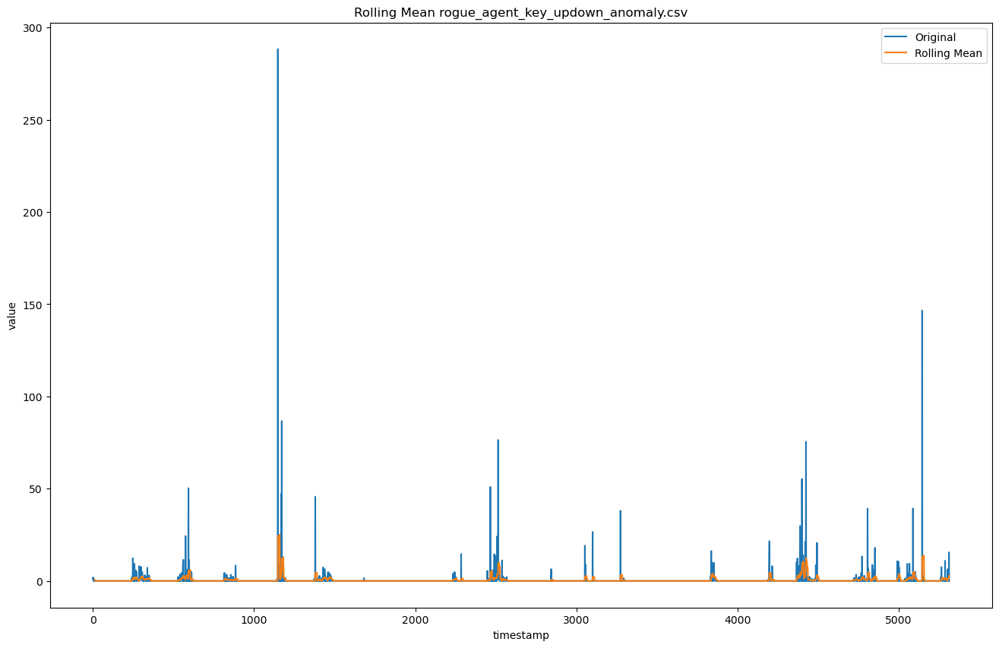

/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/255004051.py:19: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  KPSS_test = kpss(series, regression=reg)


ADF Statistic: -9.831793321648123
p-value: 5.014575106628057e-17
n_lags: 23
Number of observations:5291
Critical Values:
   1%, -3.431586529086109
Critical Values:
   5%, -2.8620864187596053
Critical Values:
   10%, -2.5670608582312475
KPSS Statistic: 0.24267083944378104
p-value: 0.1
n_lags: 16
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


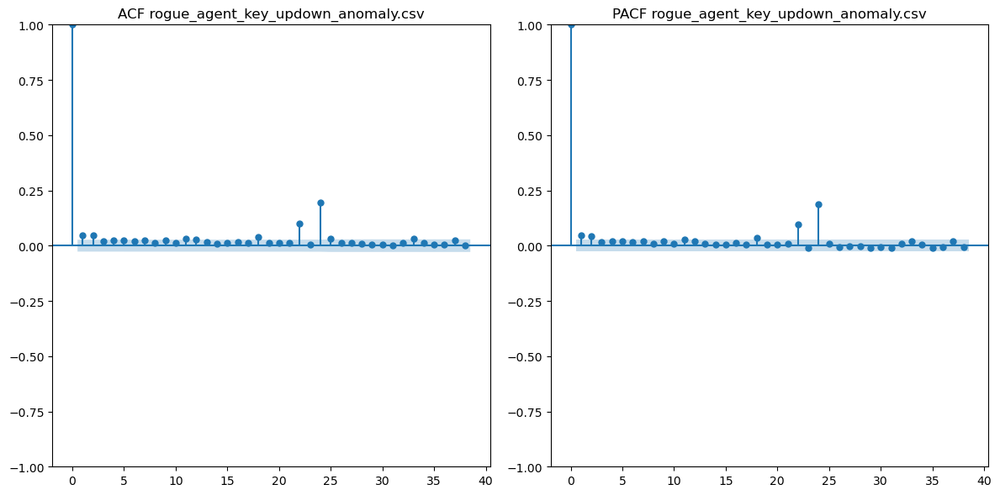

Information about: ambient_temperature_system_failure_anomaly.csv


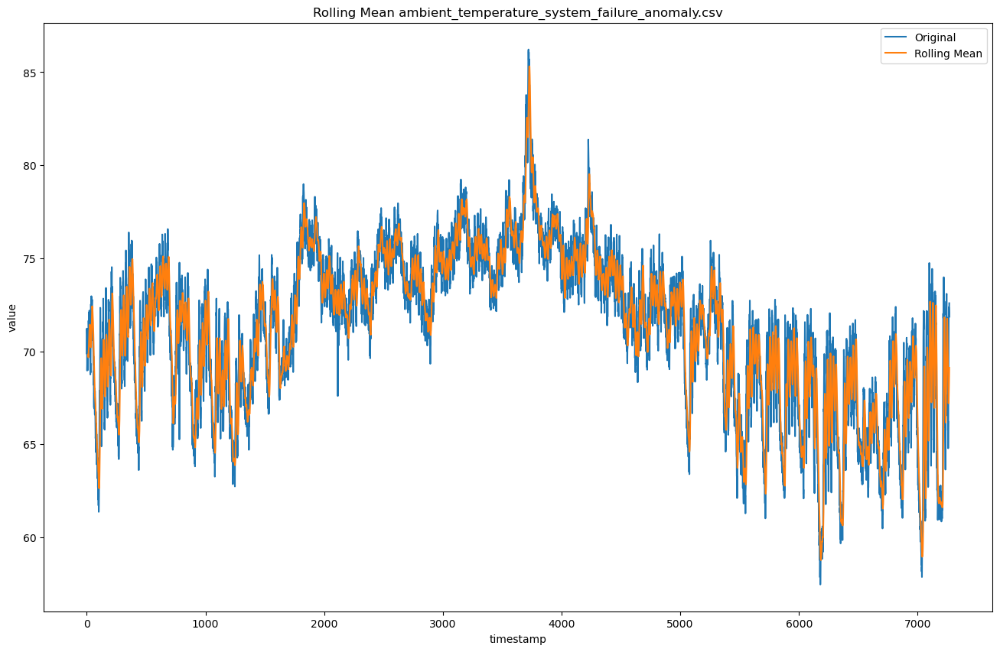

/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/255004051.py:19: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  KPSS_test = kpss(series, regression=reg)


ADF Statistic: -5.517563052178544
p-value: 1.909754729598037e-06
n_lags: 30
Number of observations:7236
Critical Values:
   1%, -3.431254038323245
Critical Values:
   5%, -2.861939514358018
Critical Values:
   10%, -2.566982657296559
KPSS Statistic: 3.797020553336175
p-value: 0.01
n_lags: 52
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


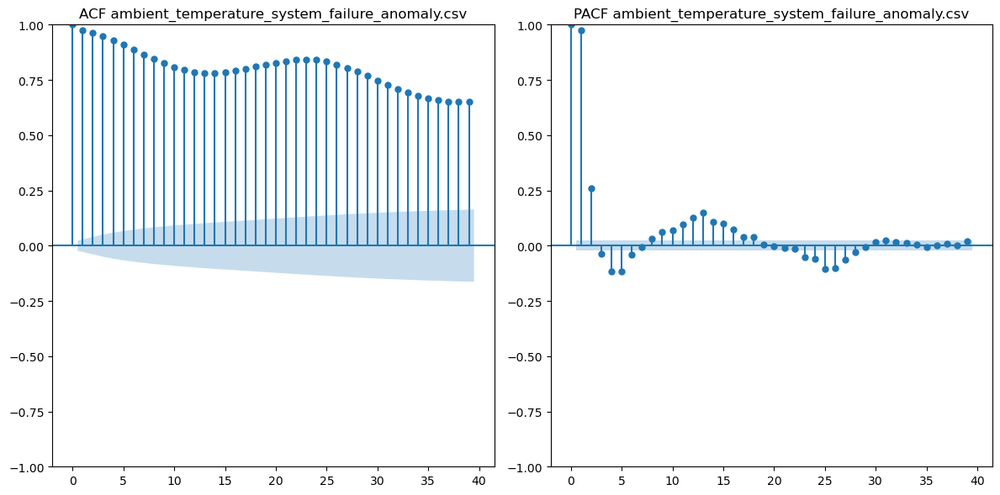

Information about: ec2_request_latency_system_failure_anomaly.csv


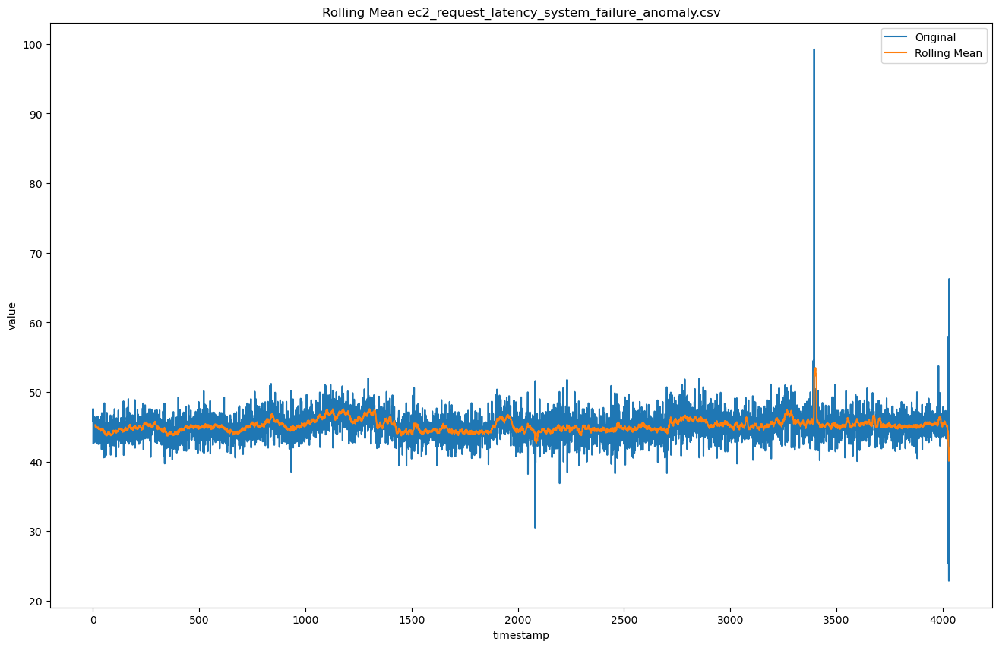

ADF Statistic: -5.156198007131904
p-value: 1.0795035969443514e-05
n_lags: 28
Number of observations:4003
Critical Values:
   1%, -3.431984648591583
Critical Values:
   5%, -2.862262298327622
Critical Values:
   10%, -2.5671544870656278
KPSS Statistic: 0.6378917599869031
p-value: 0.01919165818300881
n_lags: 33
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


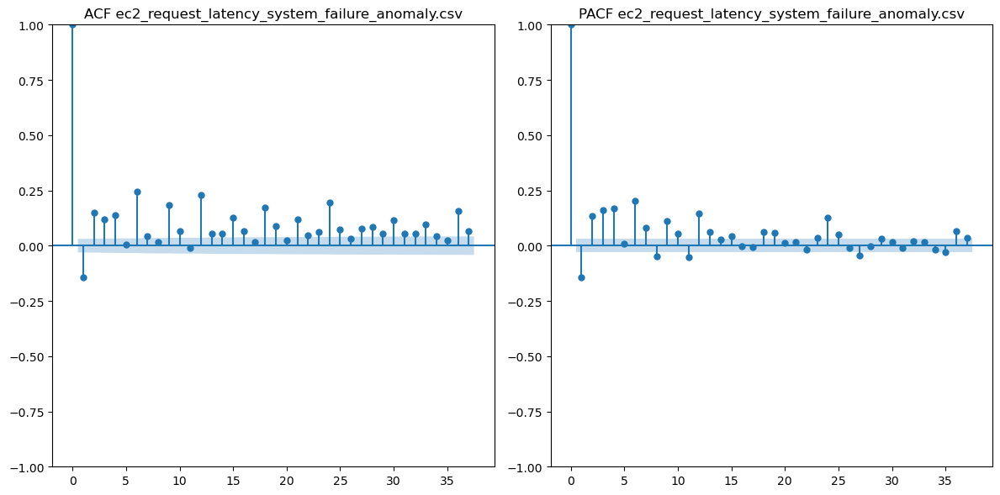

Information about: cpu_utilization_asg_misconfiguration_anomaly.csv


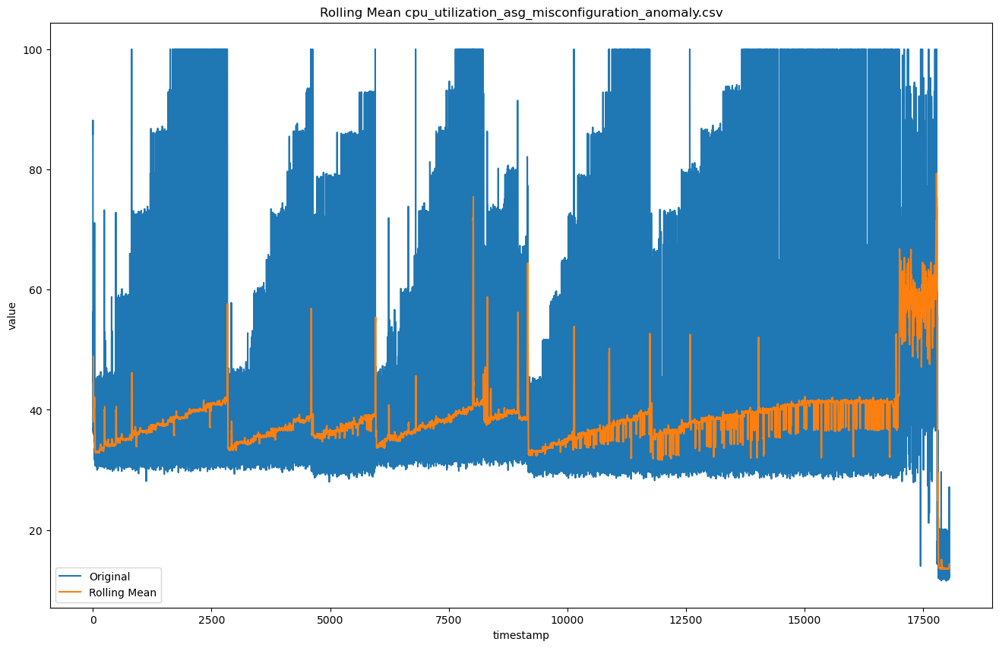

/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/255004051.py:19: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  KPSS_test = kpss(series, regression=reg)


ADF Statistic: -5.926239900811173
p-value: 2.439927820973927e-07
n_lags: 44
Number of observations:18005
Critical Values:
   1%, -3.4307132453508253
Critical Values:
   5%, -2.8617005406987177
Critical Values:
   10%, -2.566855451597457
KPSS Statistic: 5.888750481177466
p-value: 0.01
n_lags: 24
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


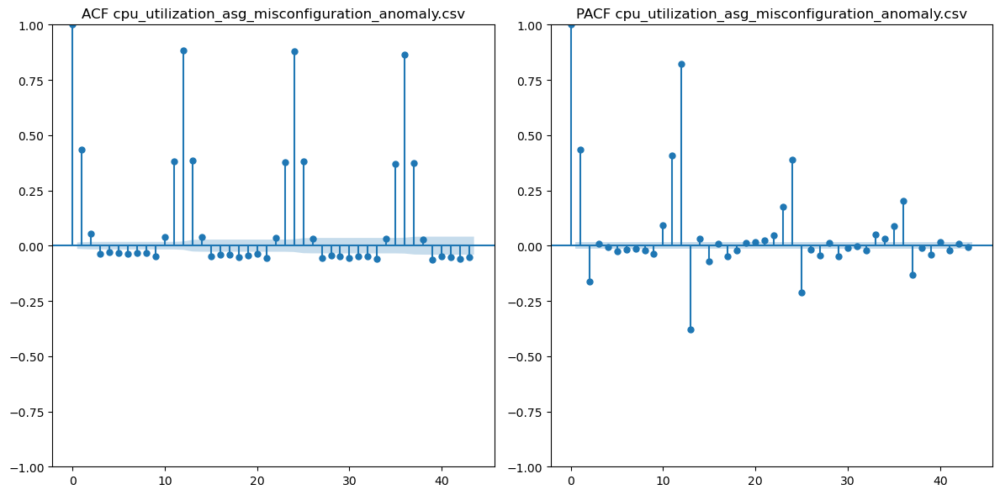

Information about: machine_temperature_system_failure_anomaly.csv


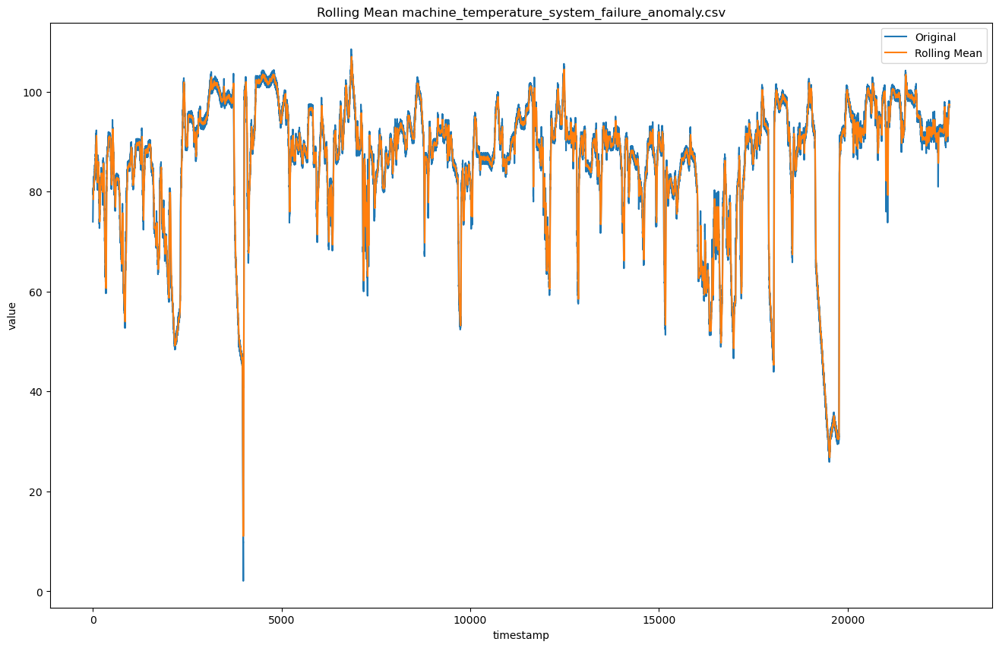

ADF Statistic: -7.369089564491342
p-value: 9.07134531551817e-11
n_lags: 20
Number of observations:22674
Critical Values:
   1%, -3.4306384378792365
Critical Values:
   5%, -2.861667480233377
Critical Values:
   10%, -2.566837854101014
KPSS Statistic: 0.47248579710844446
p-value: 0.047863559209809815
n_lags: 91
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


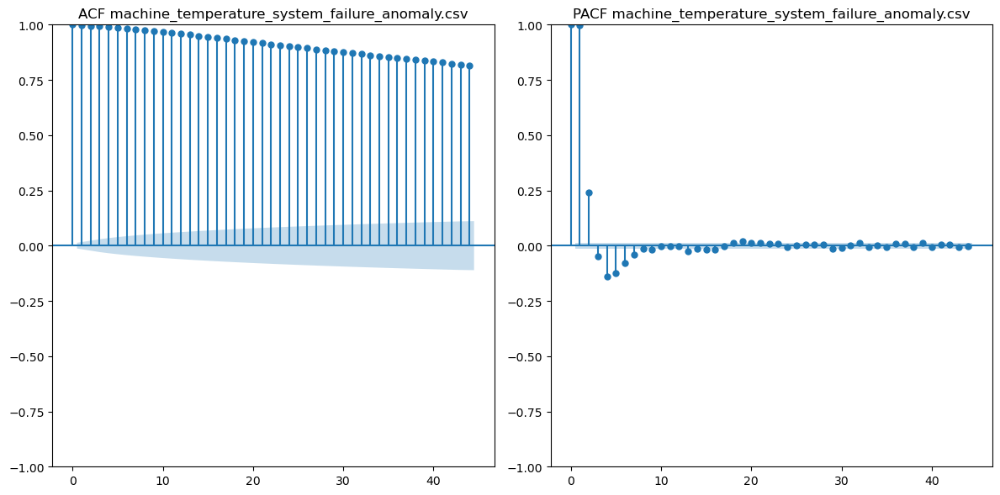

Information about: nyc_taxi_anomaly.csv


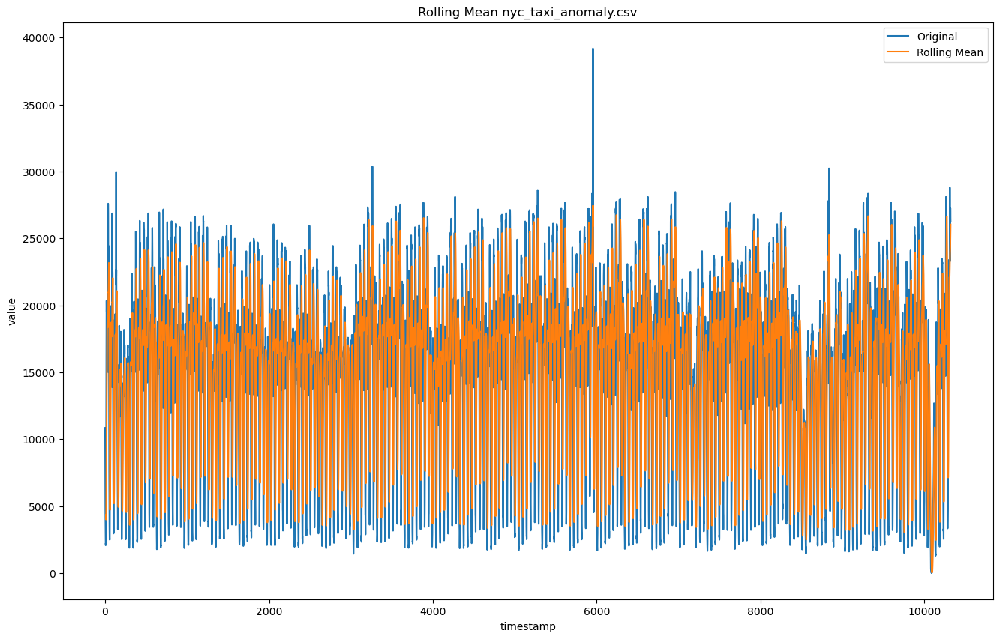

ADF Statistic: -10.764517454017046
p-value: 2.472131722066544e-19
n_lags: 39
Number of observations:10280
Critical Values:
   1%, -3.4309862775905664
Critical Values:
   5%, -2.8618211976893573
Critical Values:
   10%, -2.566919676386092
KPSS Statistic: 0.418064394398016
p-value: 0.06936879551809655
n_lags: 52
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


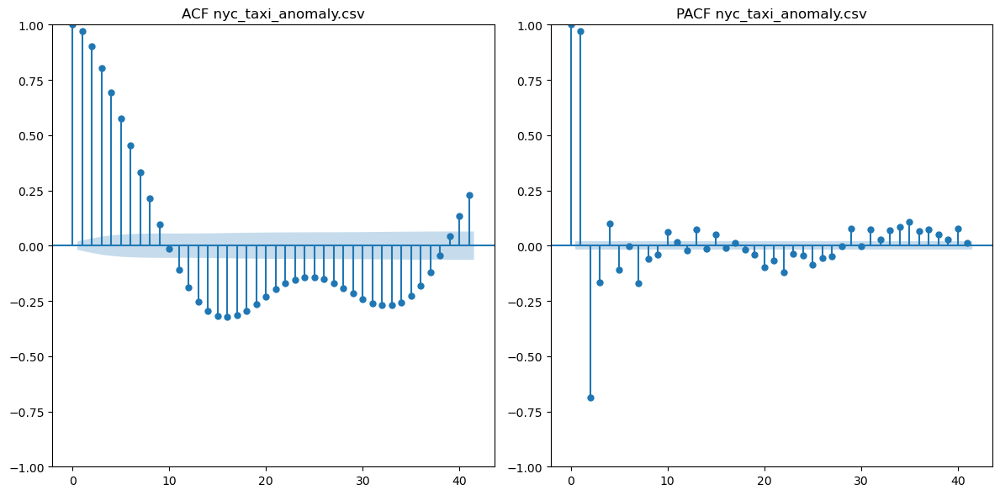

Information about: rogue_agent_key_hold_anomaly.csv


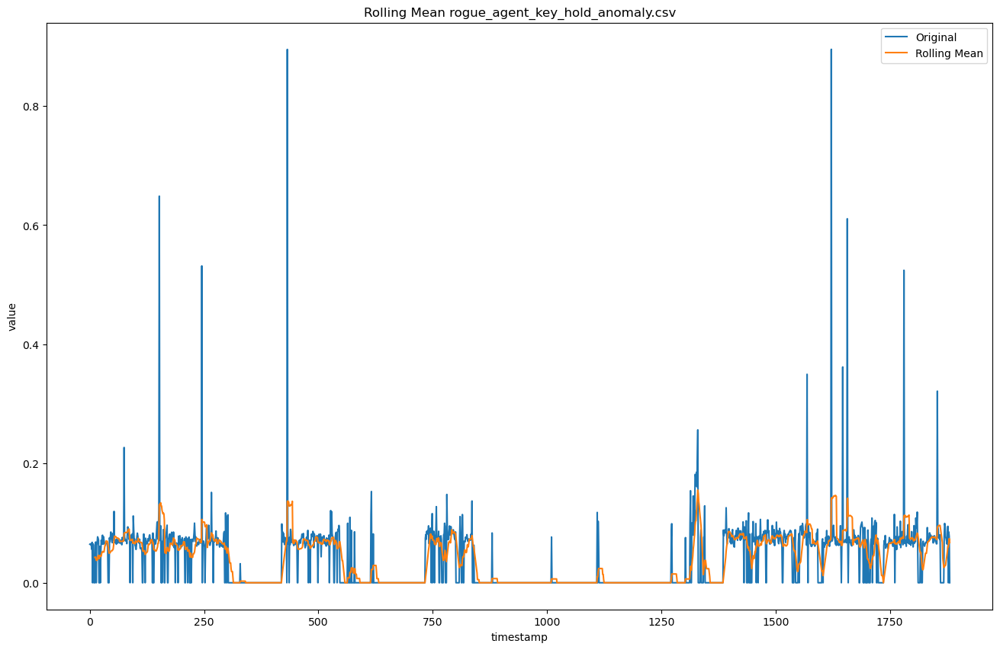

/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/255004051.py:19: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  KPSS_test = kpss(series, regression=reg)


ADF Statistic: -6.03546551431029
p-value: 1.385482076731385e-07
n_lags: 9
Number of observations:1872
Critical Values:
   1%, -3.4338480179204556
Critical Values:
   5%, -2.863085177979608
Critical Values:
   10%, -2.567592596439203
KPSS Statistic: 0.9274312729653883
p-value: 0.01
n_lags: 24
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


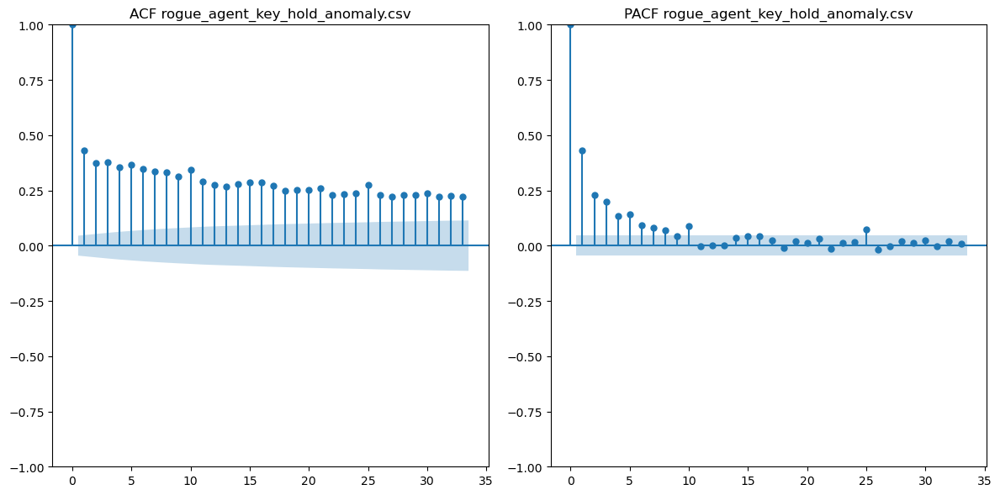

In [30]:
#become file lists
csv_files = glob.glob("NAB_labelled/realKnownCause/*.csv")
file_names = [os.path.basename(file) for file in csv_files]
#print information and plots
for file_name in file_names:
    df = pd.read_csv(f'NAB_labelled/realKnownCause/{file_name}')
    print_information_about_file(df, file_name)

In [31]:
#create a summary information
for i in range(len(regression_ADF_values)):
    regression_ADF = regression_ADF_values[i]
    regression_KPSS = regression_KPSS_values[i]
    for file_name in file_names:
        df = pd.read_csv(f'NAB_labelled/realKnownCause/{file_name}')
        df_info = create_summary_frame(df_info, df, file_name, regression_ADF, regression_KPSS)

/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/255004051.py:19: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  KPSS_test = kpss(series, regression=reg)
/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/1717271452.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_info = df_info.append({'File Name': file_name,
/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/255004051.py:19: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  KPSS_test = kpss(series, regression=reg)
/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/1717271452.py:30: FutureWarning: The frame.append method is deprecated and will be remo

In [32]:
#save information as .csv file
df_info.to_csv('Summary/Summary_stationarity_NAB_real_known_cause.csv',index=False)

Real Traffic

In [33]:
#create an information data frame
columns = ['File Name', 'Length', 'Amount of Anomaly Points', 'ADF Statistic', 'ADF Regression', 'ADF p-value', 'ADF lags', 'ADF Critical Value 10%', 'ADF Critical Value 5%', 'KPSS Statistics', 'KPSS Regression', 'KPSS p-value', 'KPSS Critical Value 10%', 'KPSS Critical Value 5%']
df_info = pd.DataFrame(columns=columns)
regression_ADF_values = ['c', 'n', 'ct', 'ctt']
regression_KPSS_values = ['c', 'c', 'ct', 'ct']

Information about: TravelTime_387_anomaly.csv


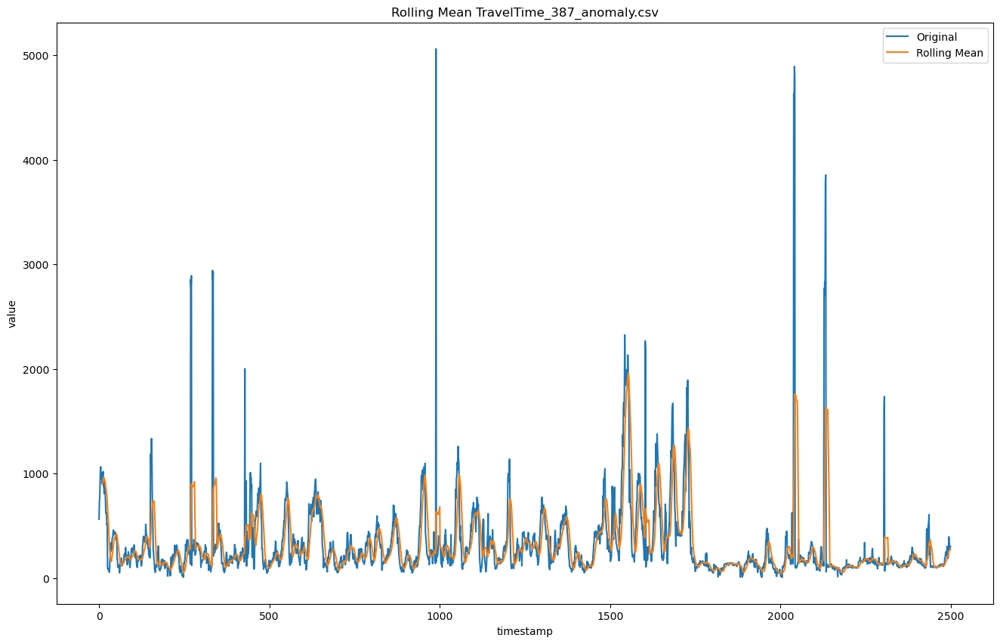

/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/255004051.py:19: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  KPSS_test = kpss(series, regression=reg)


ADF Statistic: -11.721641967292419
p-value: 1.4087772557376121e-21
n_lags: 6
Number of observations:2493
Critical Values:
   1%, -3.4329757705711432
Critical Values:
   5%, -2.862700050059295
Critical Values:
   10%, -2.567387539813443
KPSS Statistic: 0.32976835558103446
p-value: 0.1
n_lags: 26
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


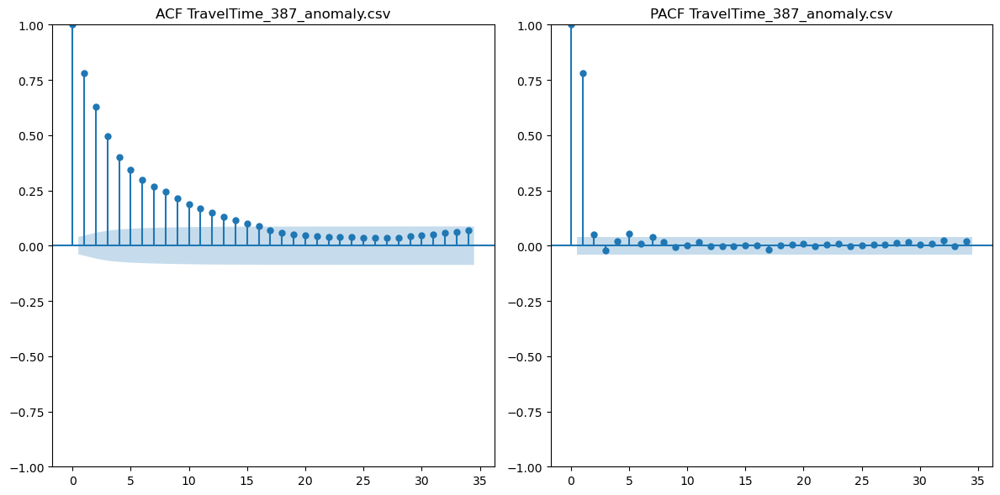

Information about: TravelTime_451_anomaly.csv


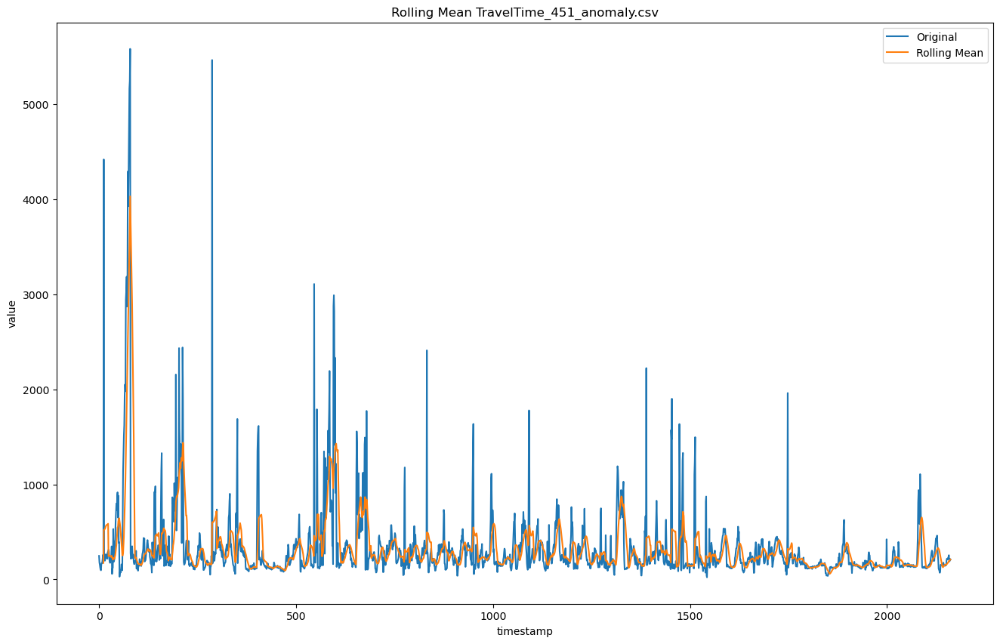

/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/255004051.py:19: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  KPSS_test = kpss(series, regression=reg)


ADF Statistic: -11.723452181755949
p-value: 1.3955592983020228e-21
n_lags: 3
Number of observations:2158
Critical Values:
   1%, -3.4333838718977896
Critical Values:
   5%, -2.8628802551435264
Critical Values:
   10%, -2.567483485481099
KPSS Statistic: 1.2516209049184186
p-value: 0.01
n_lags: 25
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


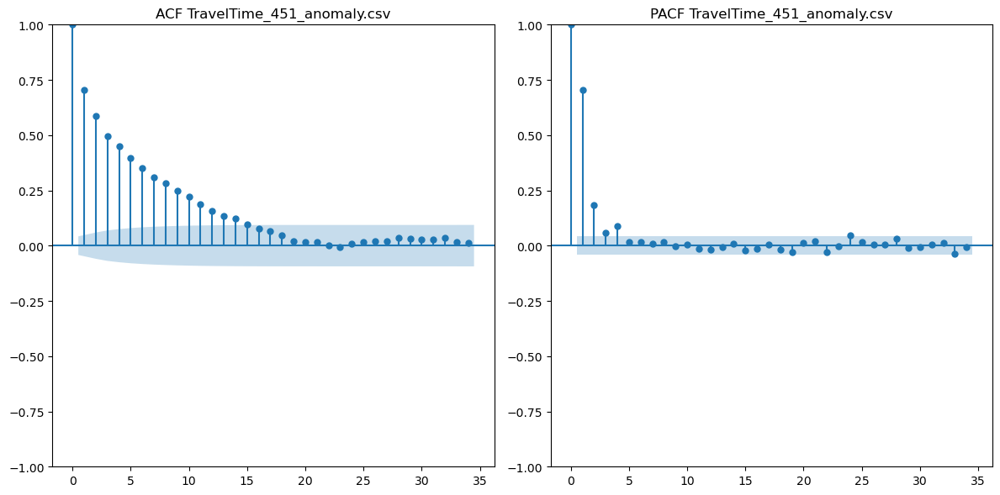

Information about: speed_t4013_anomaly.csv


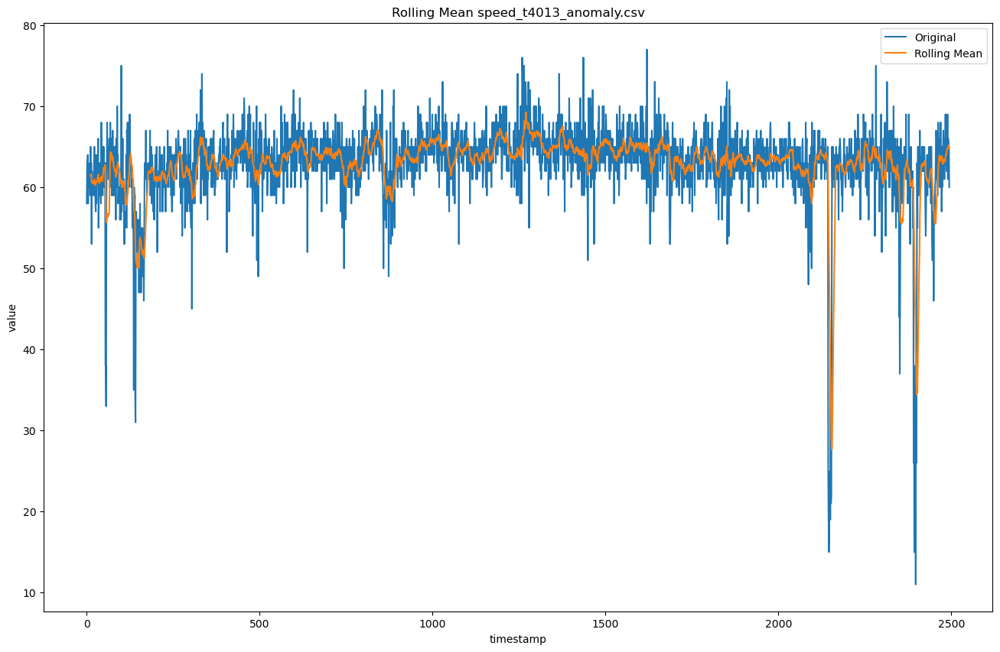

/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/255004051.py:19: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  KPSS_test = kpss(series, regression=reg)


ADF Statistic: -11.443915273509749
p-value: 6.083850299007057e-21
n_lags: 6
Number of observations:2488
Critical Values:
   1%, -3.4329810529006184
Critical Values:
   5%, -2.862702382731847
Critical Values:
   10%, -2.5673887817601657
KPSS Statistic: 0.7532584609475237
p-value: 0.01
n_lags: 26
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


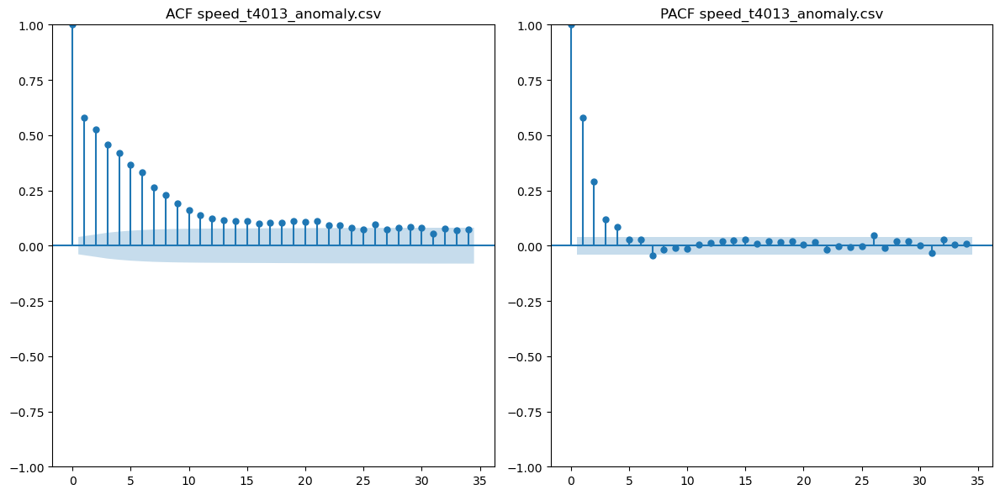

Information about: speed_6005_anomaly.csv


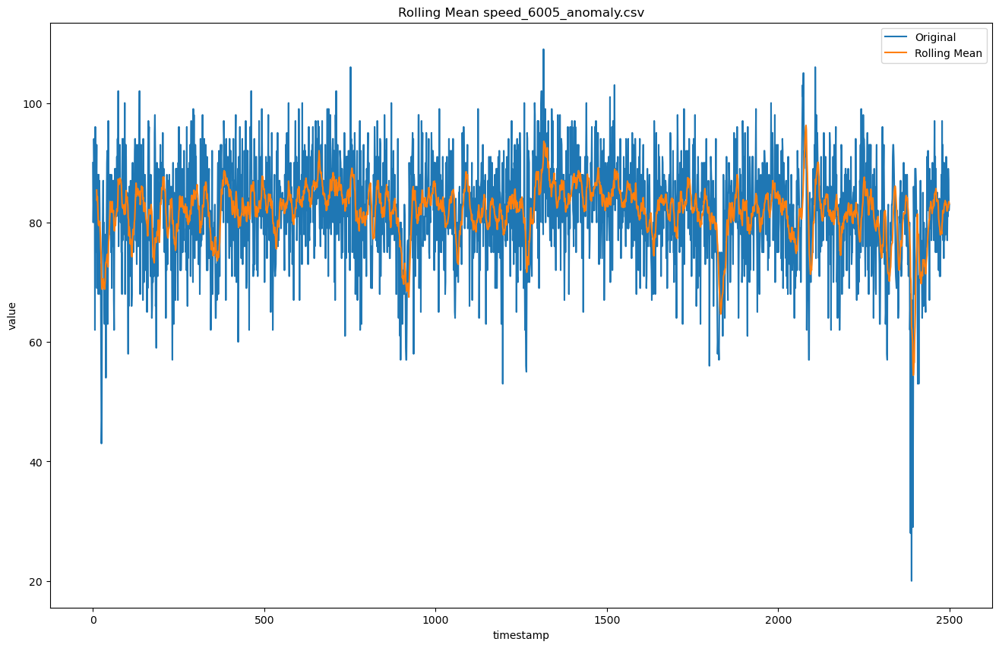

ADF Statistic: -14.297329506543006
p-value: 1.245999744632601e-26
n_lags: 5
Number of observations:2494
Critical Values:
   1%, -3.4329747166494915
Critical Values:
   5%, -2.862699584647827
Critical Values:
   10%, -2.567387292022104
KPSS Statistic: 0.5697201505363606
p-value: 0.025963930059378235
n_lags: 23
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


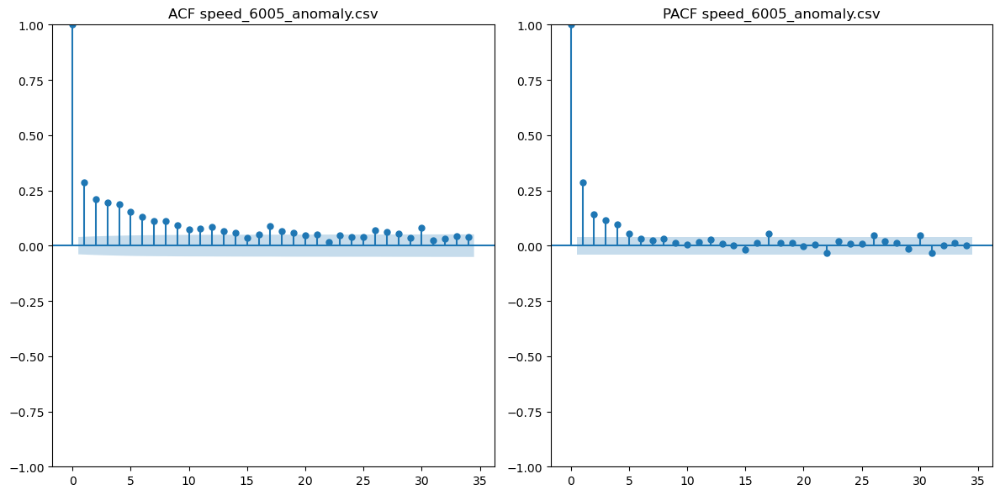

Information about: occupancy_t4013_anomaly.csv


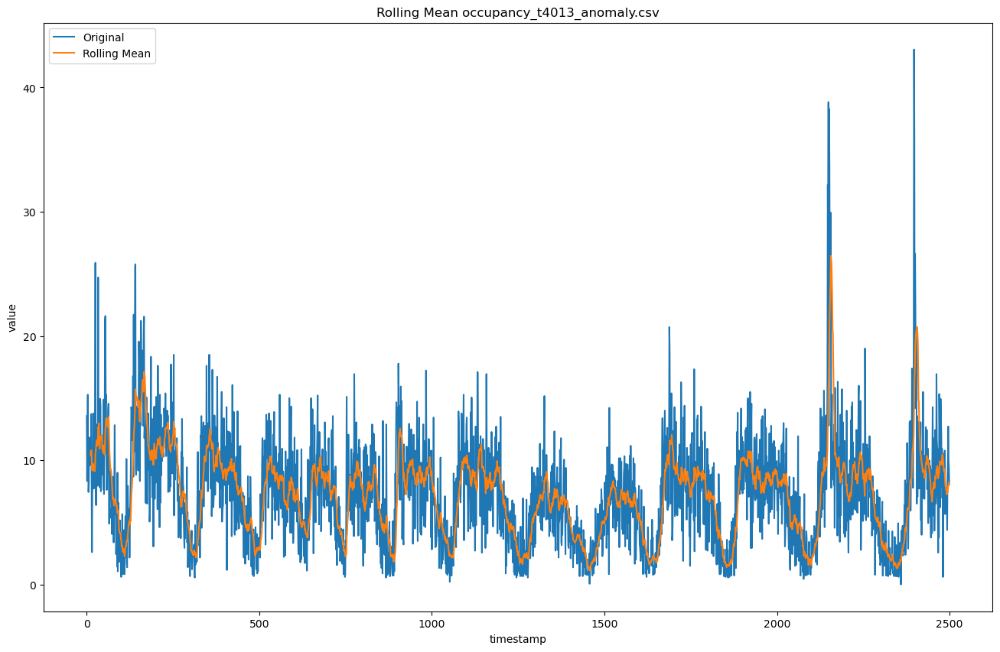

ADF Statistic: -6.020453693740056
p-value: 1.4981073547284644e-07
n_lags: 13
Number of observations:2486
Critical Values:
   1%, -3.4329831717881003
Critical Values:
   5%, -2.8627033184297384
Critical Values:
   10%, -2.5673892799386944
KPSS Statistic: 0.4285860966722039
p-value: 0.06483357902060179
n_lags: 28
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


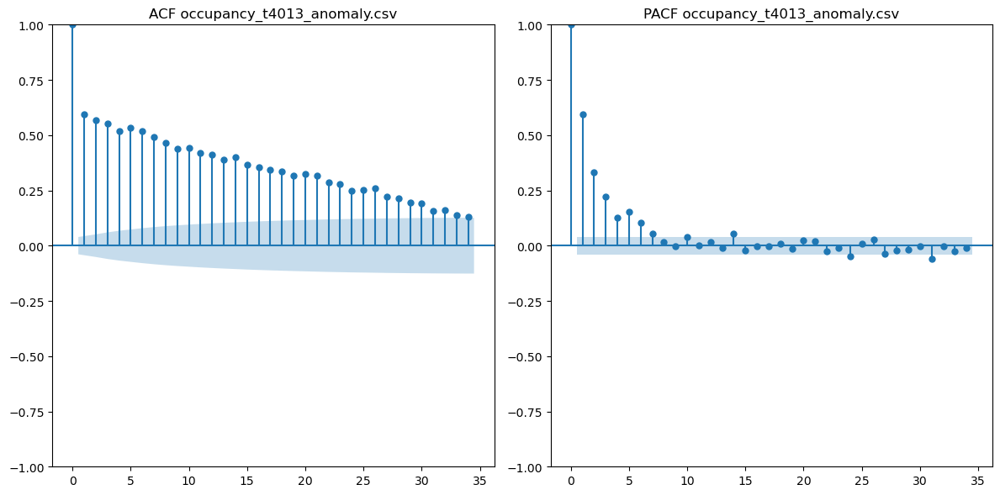

Information about: occupancy_6005_anomaly.csv


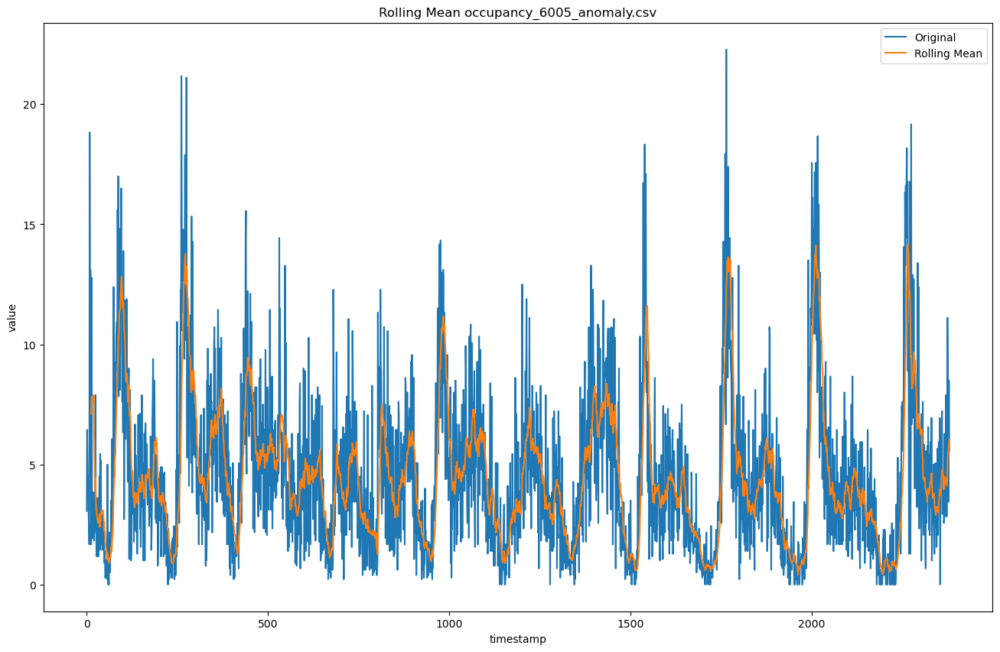

/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/255004051.py:19: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  KPSS_test = kpss(series, regression=reg)


ADF Statistic: -8.194669927818406
p-value: 7.505115581586814e-13
n_lags: 20
Number of observations:2359
Critical Values:
   1%, -3.433125086901646
Critical Values:
   5%, -2.8627659864448662
Critical Values:
   10%, -2.5674226455102995
KPSS Statistic: 0.16911202912684775
p-value: 0.1
n_lags: 28
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


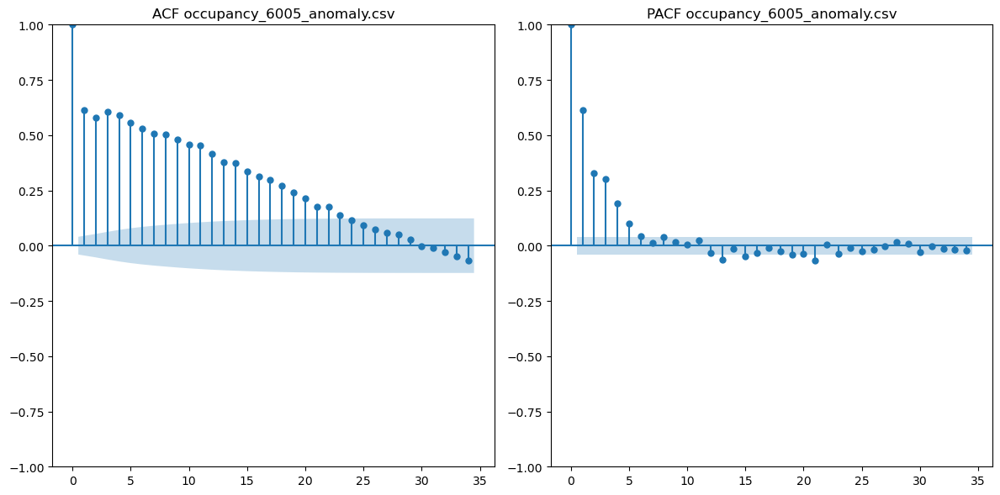

Information about: speed_7578_anomaly.csv


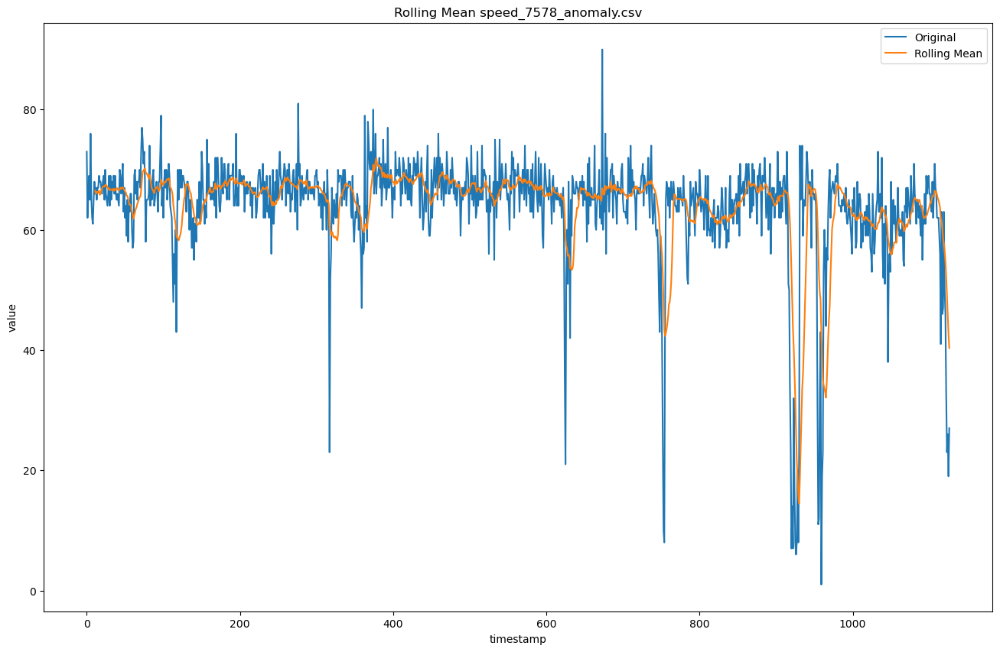

/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/255004051.py:19: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  KPSS_test = kpss(series, regression=reg)


ADF Statistic: -7.218915741290328
p-value: 2.1367134654131096e-10
n_lags: 7
Number of observations:1119
Critical Values:
   1%, -3.436207340777824
Critical Values:
   5%, -2.8641263411190323
Critical Values:
   10%, -2.5681470422493593
KPSS Statistic: 1.4217975681104325
p-value: 0.01
n_lags: 18
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


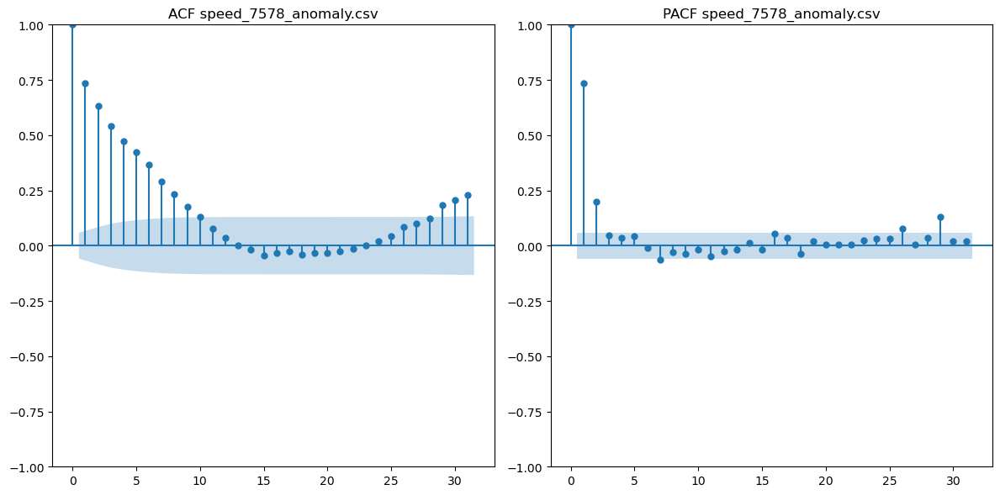

In [34]:
#become file lists
csv_files = glob.glob("NAB_labelled/realTraffic/*.csv")
file_names = [os.path.basename(file) for file in csv_files]

#print information and plots
for file_name in file_names:
    df = pd.read_csv(f'NAB_labelled/realTraffic/{file_name}')
    print_information_about_file(df, file_name)

In [35]:
#create a summary information
for i in range(len(regression_ADF_values)):
    regression_ADF = regression_ADF_values[i]
    regression_KPSS = regression_KPSS_values[i]
    for file_name in file_names:
        df = pd.read_csv(f'NAB_labelled/realTraffic/{file_name}')
        df_info = create_summary_frame(df_info, df, file_name, regression_ADF, regression_KPSS)

/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/255004051.py:19: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  KPSS_test = kpss(series, regression=reg)
/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/1717271452.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_info = df_info.append({'File Name': file_name,
/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/255004051.py:19: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  KPSS_test = kpss(series, regression=reg)
/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/1717271452.py:30: FutureWarning: The frame.append method is deprecated and will be remo

In [36]:
#save the information as a .csv file
df_info.to_csv('Summary/Summary_stationarity_NAB_real_traffic.csv',index=False)

Real Tweets

In [37]:
#create an information data frame
columns = ['File Name', 'Length', 'Amount of Anomaly Points', 'ADF Statistic', 'ADF Regression', 'ADF p-value', 'ADF lags', 'ADF Critical Value 10%', 'ADF Critical Value 5%', 'KPSS Statistics', 'KPSS Regression', 'KPSS p-value', 'KPSS Critical Value 10%', 'KPSS Critical Value 5%']
df_info = pd.DataFrame(columns=columns)
regression_ADF_values = ['c', 'n', 'ct', 'ctt']
regression_KPSS_values = ['c', 'c', 'ct', 'ct']

Information about: Twitter_volume_IBM_anomaly.csv


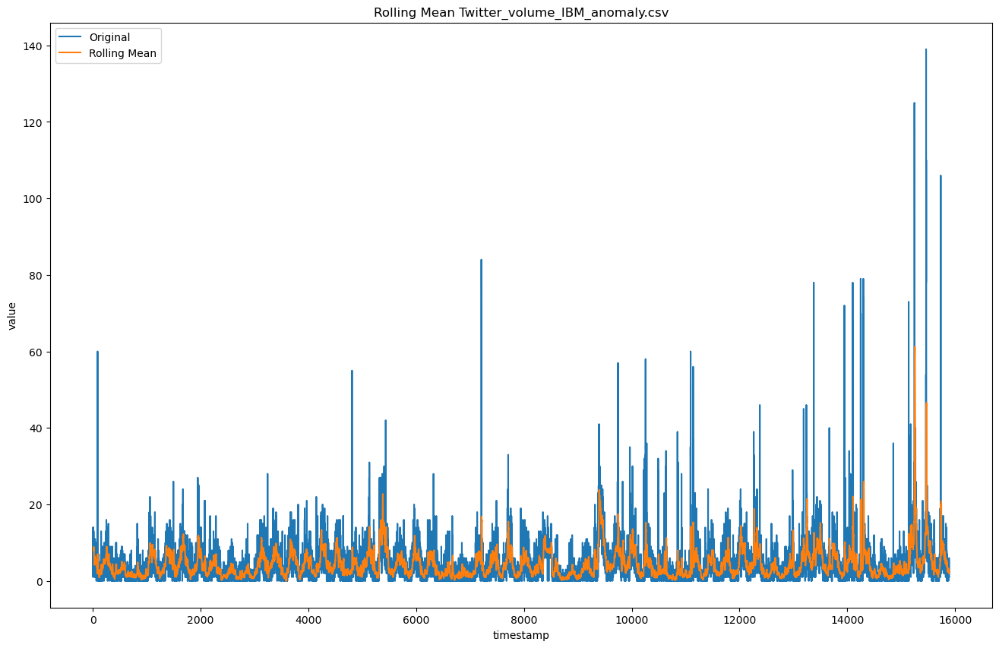

ADF Statistic: -11.93755480280571
p-value: 4.624139811882084e-22
n_lags: 26
Number of observations:15866
Critical Values:
   1%, -3.430762224776325
Critical Values:
   5%, -2.8617221862485196
Critical Values:
   10%, -2.5668669732160123
KPSS Statistic: 0.6502081651146686
p-value: 0.01807198498957558
n_lags: 66
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


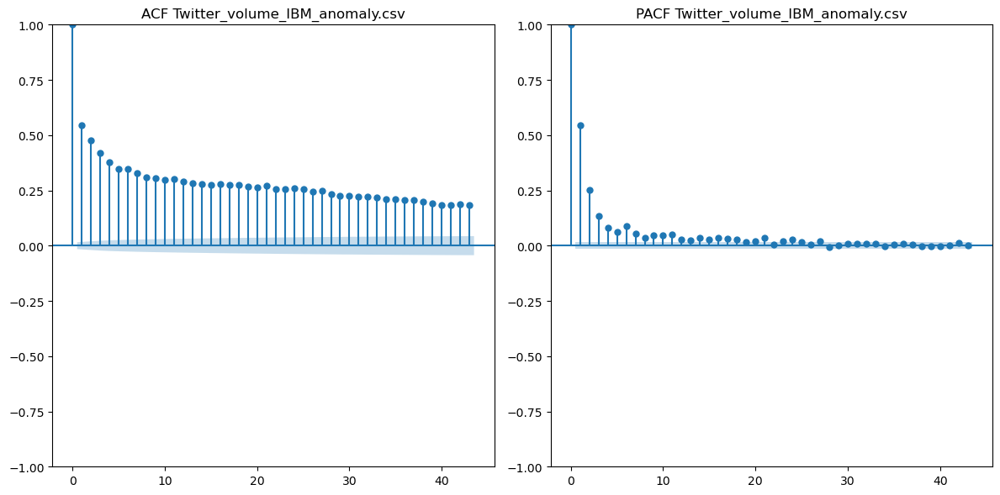

Information about: Twitter_volume_AAPL_anomaly.csv


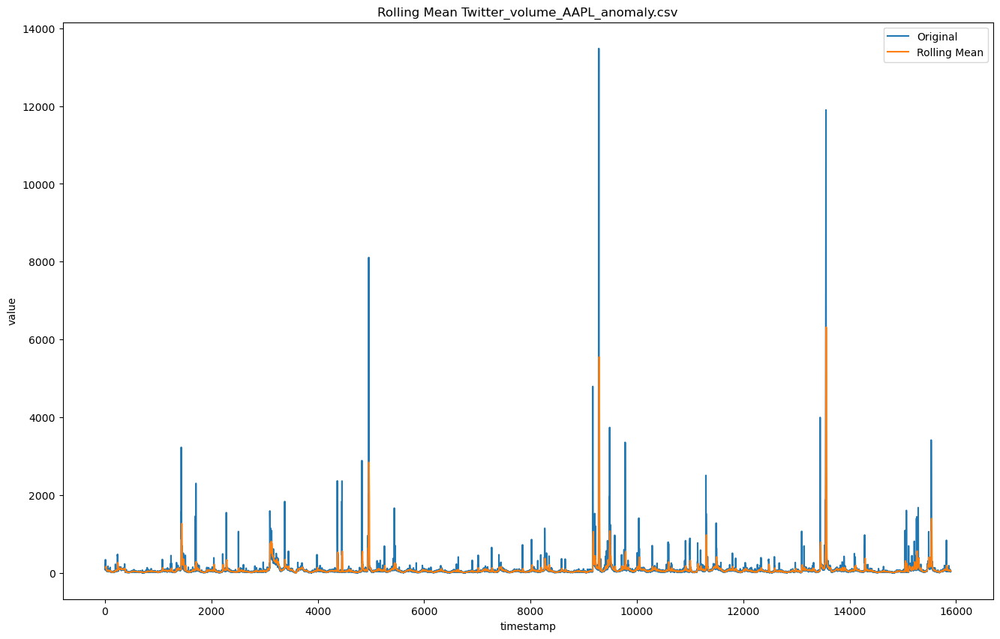

/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/255004051.py:19: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  KPSS_test = kpss(series, regression=reg)


ADF Statistic: -23.20095085153635
p-value: 0.0
n_lags: 16
Number of observations:15885
Critical Values:
   1%, -3.4307617316358177
Critical Values:
   5%, -2.8617219683159862
Critical Values:
   10%, -2.5668668572133138
KPSS Statistic: 0.20093206982262482
p-value: 0.1
n_lags: 60
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


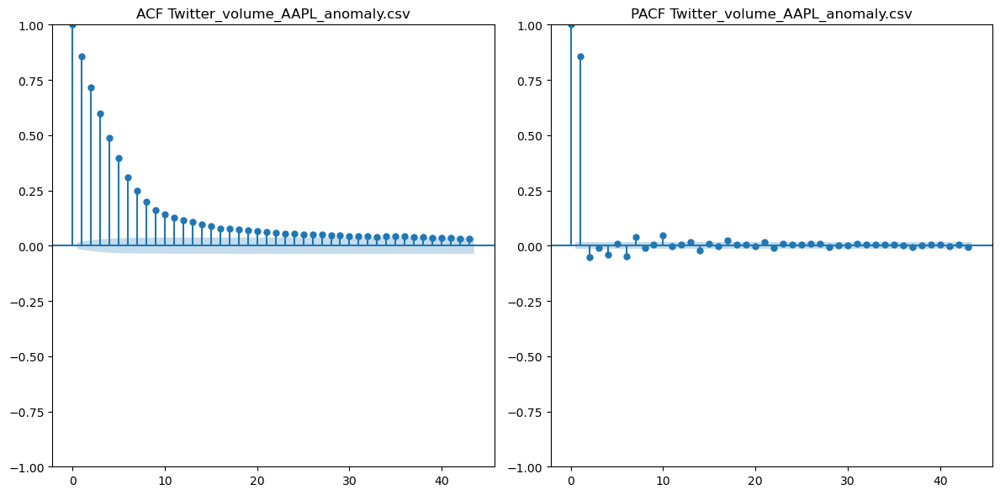

Information about: Twitter_volume_AMZN_anomaly.csv


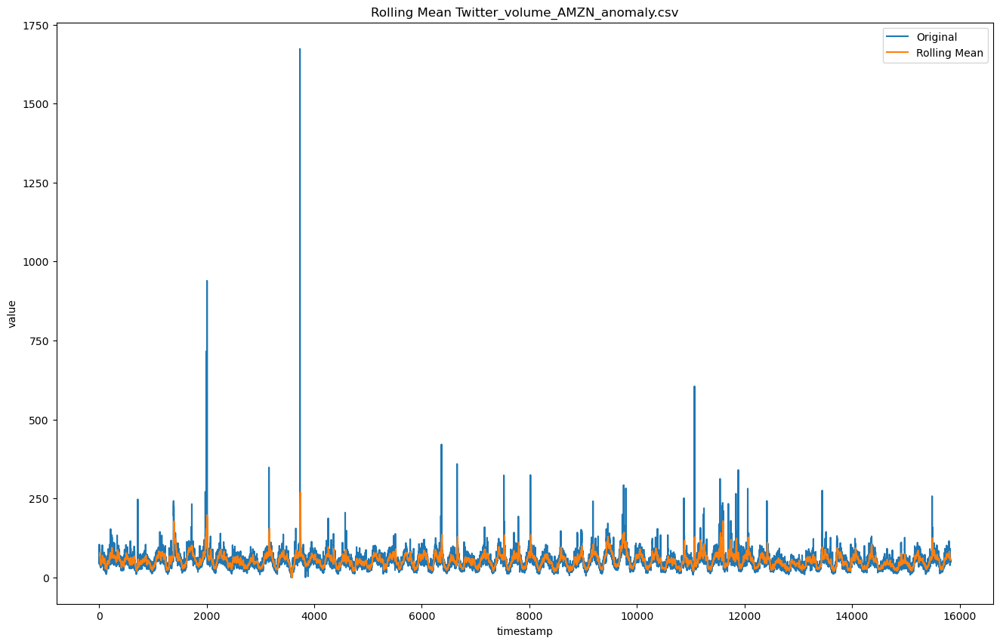

/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/255004051.py:19: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  KPSS_test = kpss(series, regression=reg)


ADF Statistic: -12.834600871520715
p-value: 5.776504693395812e-24
n_lags: 21
Number of observations:15809
Critical Values:
   1%, -3.430763711311156
Critical Values:
   5%, -2.8617228431894706
Critical Values:
   10%, -2.5668673228973113
KPSS Statistic: 0.3170669652473919
p-value: 0.1
n_lags: 67
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


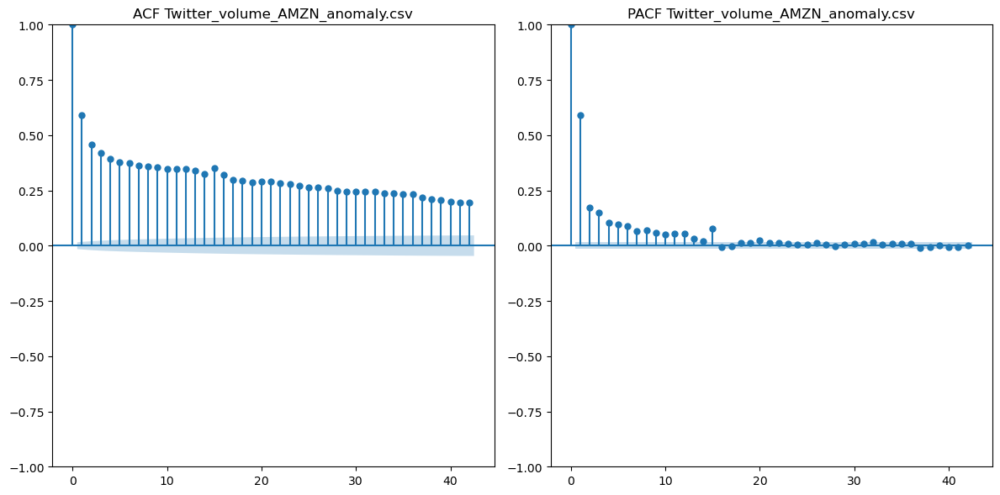

Information about: Twitter_volume_FB_anomaly.csv


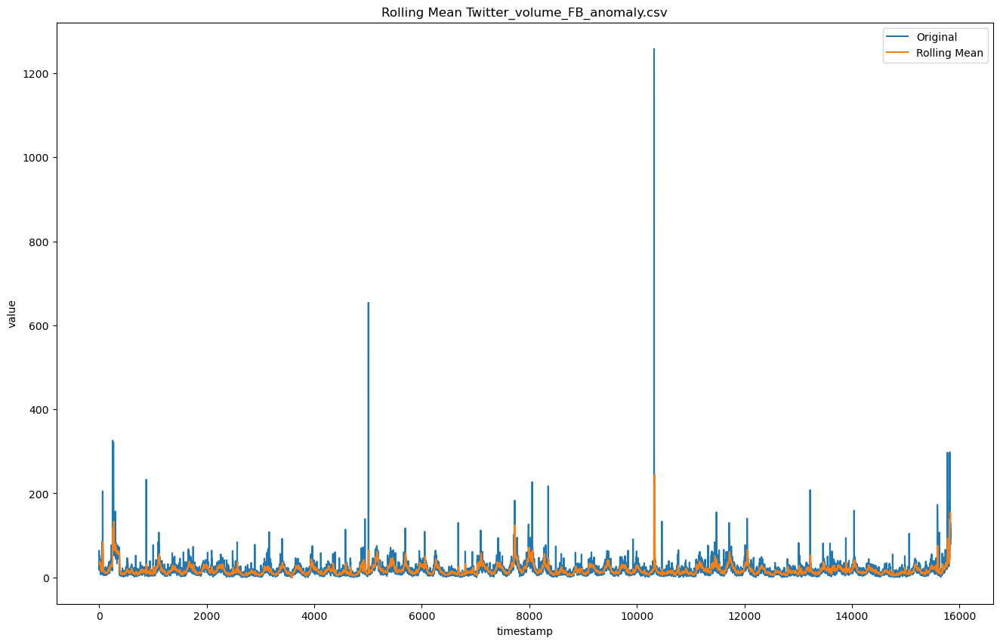

/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/255004051.py:19: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  KPSS_test = kpss(series, regression=reg)


ADF Statistic: -10.371070658792119
p-value: 2.263366834867789e-18
n_lags: 31
Number of observations:15801
Critical Values:
   1%, -3.430763920806023
Critical Values:
   5%, -2.8617229357710334
Critical Values:
   10%, -2.5668673721773025
KPSS Statistic: 0.12178626861720654
p-value: 0.1
n_lags: 65
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


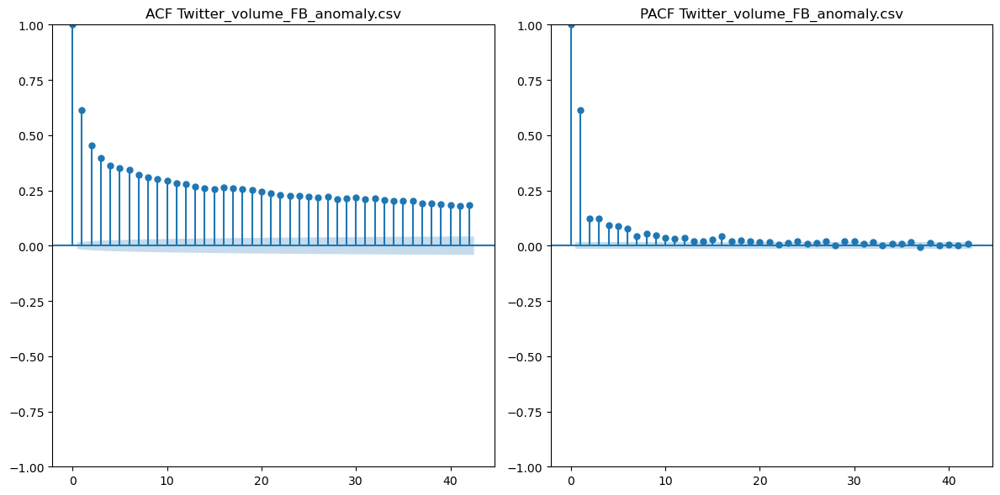

Information about: Twitter_volume_UPS_anomaly.csv


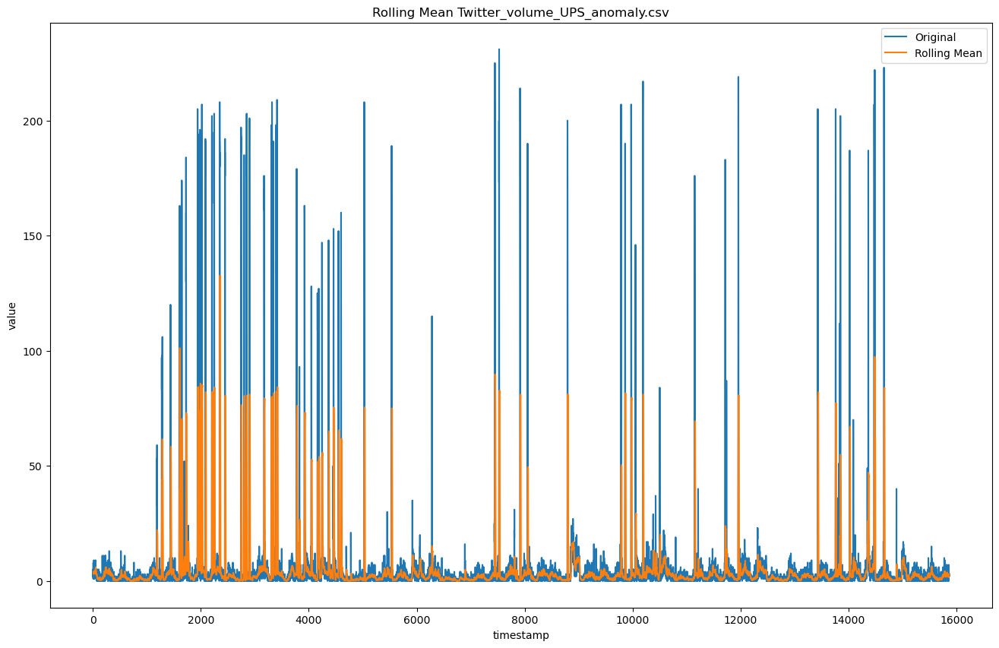

/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/255004051.py:19: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  KPSS_test = kpss(series, regression=reg)


ADF Statistic: -23.28718338981333
p-value: 0.0
n_lags: 19
Number of observations:15846
Critical Values:
   1%, -3.4307627451493947
Critical Values:
   5%, -2.861722416215842
Critical Values:
   10%, -2.566867095624682
KPSS Statistic: 1.4659556266355311
p-value: 0.01
n_lags: 44
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


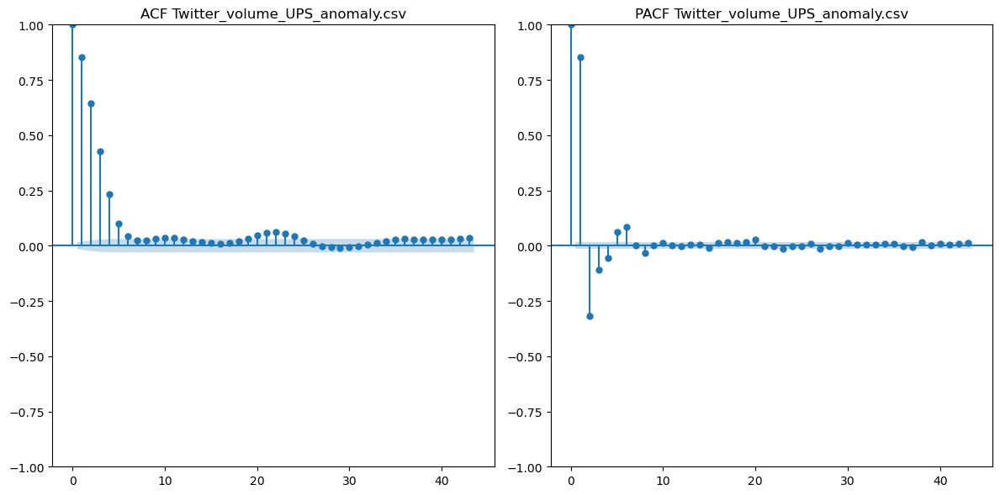

Information about: Twitter_volume_CVS_anomaly.csv


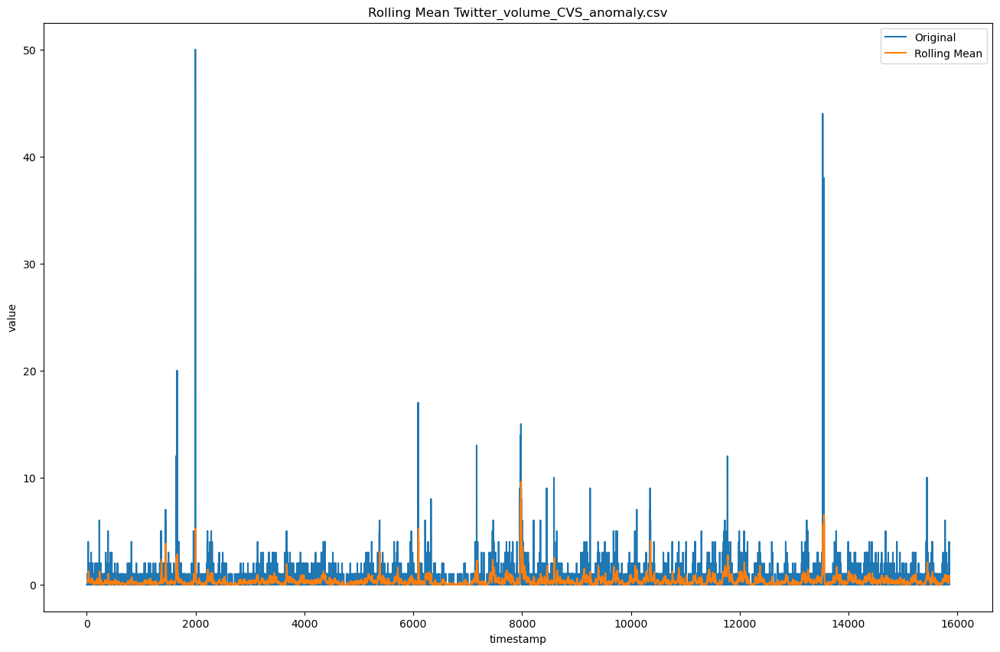

ADF Statistic: -17.448953092812957
p-value: 4.664323980940936e-30
n_lags: 22
Number of observations:15830
Critical Values:
   1%, -3.4307631623947343
Critical Values:
   5%, -2.8617226006081253
Critical Values:
   10%, -2.5668671937743452
KPSS Statistic: 0.4579183977220655
p-value: 0.05219034580945454
n_lags: 58
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


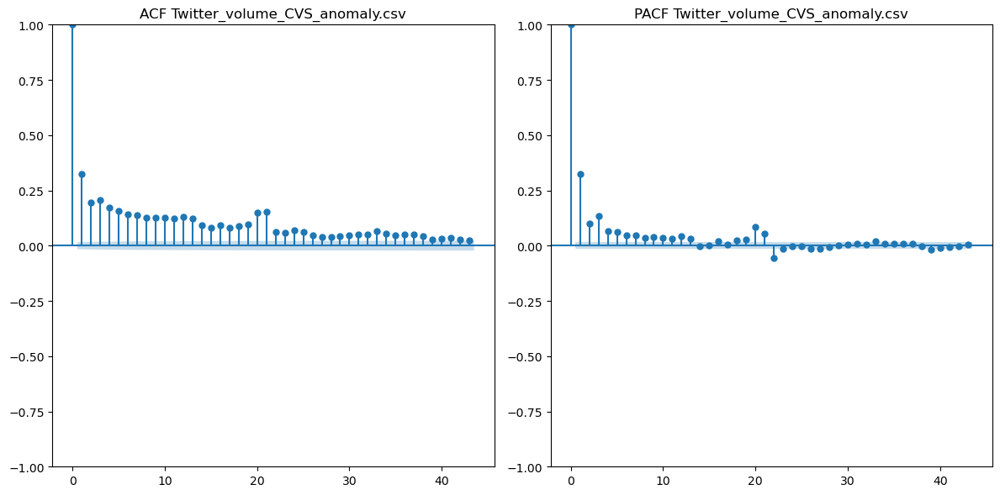

Information about: Twitter_volume_GOOG_anomaly.csv


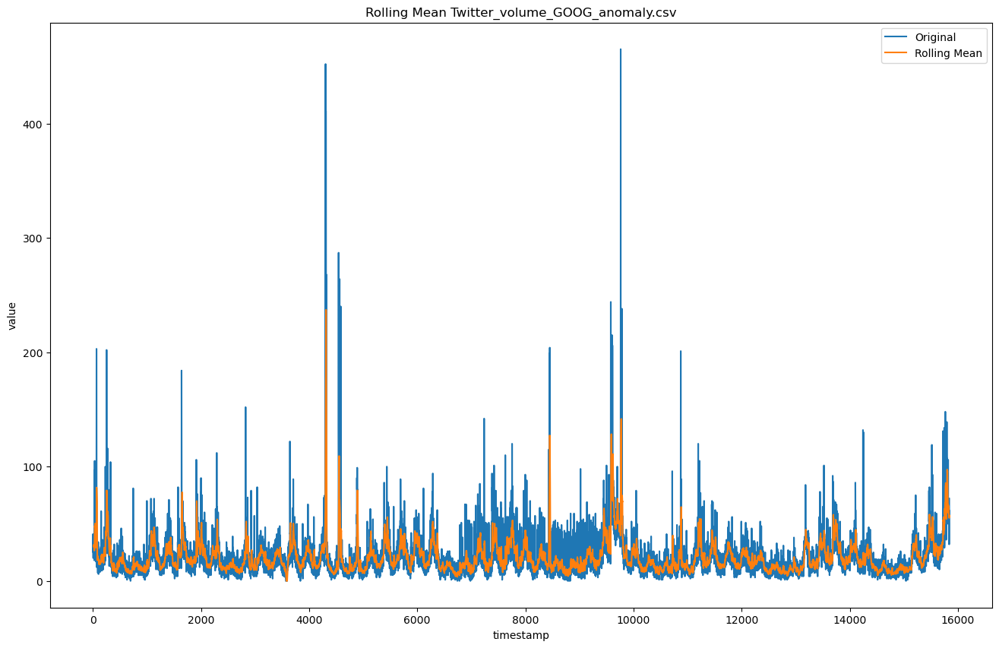

/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/255004051.py:19: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  KPSS_test = kpss(series, regression=reg)


ADF Statistic: -10.603732076529857
p-value: 6.077613473799852e-19
n_lags: 34
Number of observations:15807
Critical Values:
   1%, -3.4307637636649897
Critical Values:
   5%, -2.8617228663260748
Critical Values:
   10%, -2.5668673352126326
KPSS Statistic: 0.08459175582581273
p-value: 0.1
n_lags: 69
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


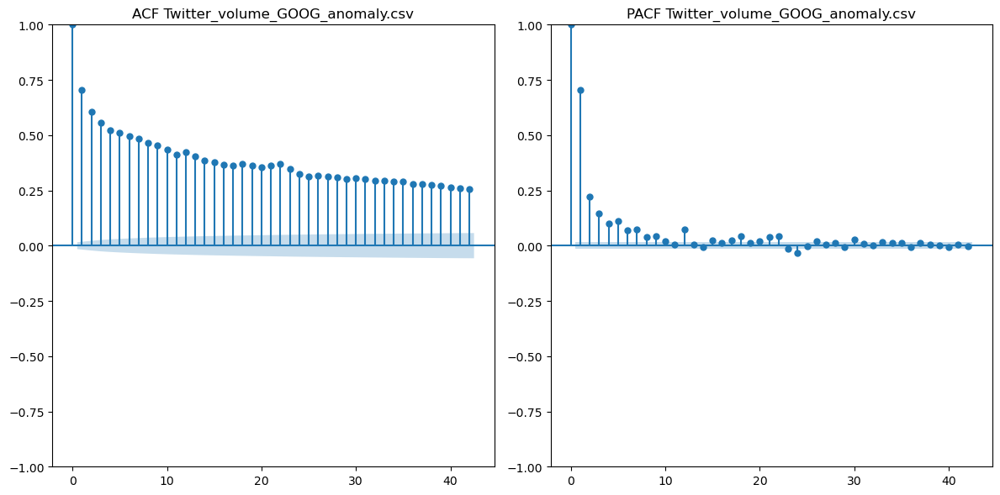

Information about: Twitter_volume_KO_anomaly.csv


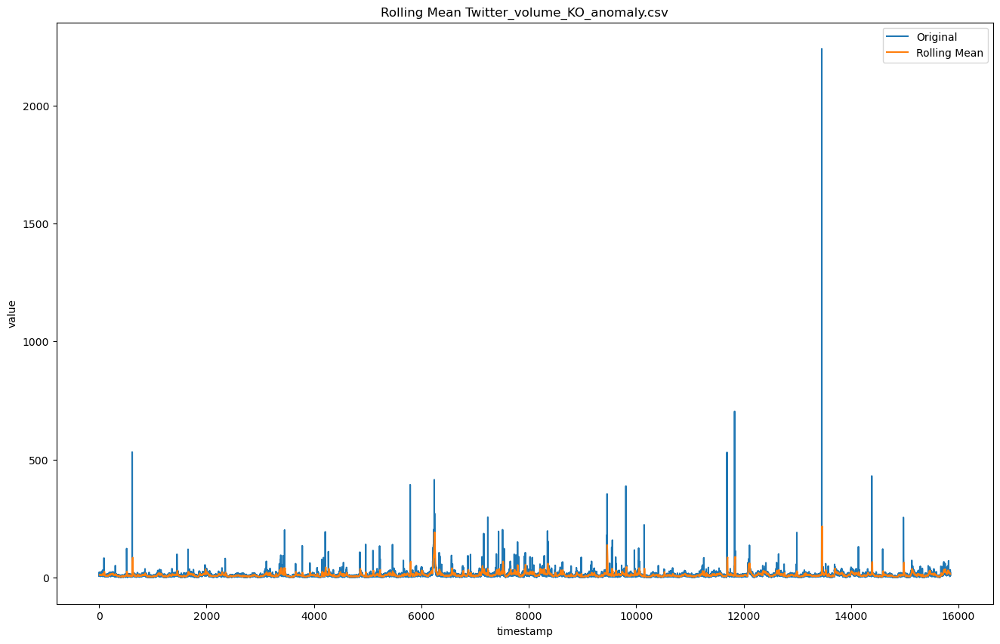

ADF Statistic: -17.675238542944655
p-value: 3.629241380994258e-30
n_lags: 23
Number of observations:15827
Critical Values:
   1%, -3.4307632407221686
Critical Values:
   5%, -2.861722635223187
Critical Values:
   10%, -2.566867212199502
KPSS Statistic: 0.6207690014884392
p-value: 0.020748272591960073
n_lags: 56
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


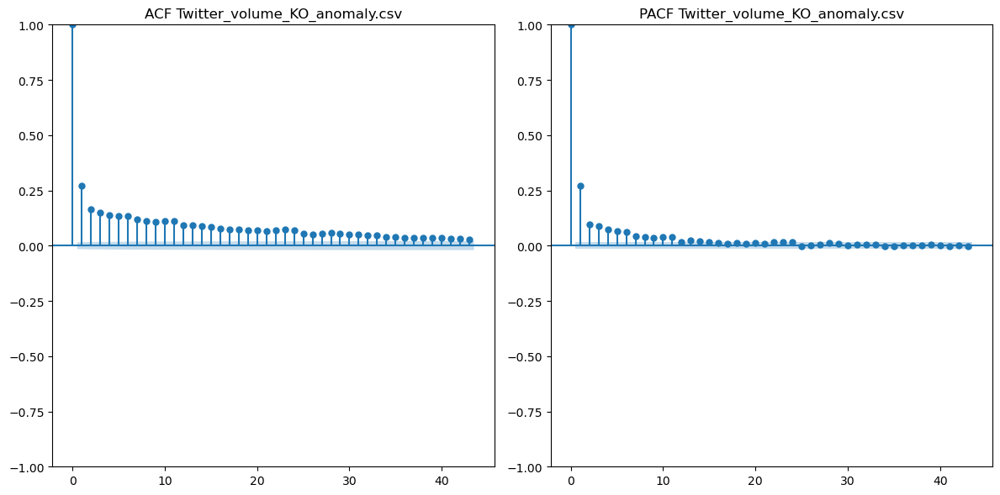

Information about: Twitter_volume_PFE_anomaly.csv


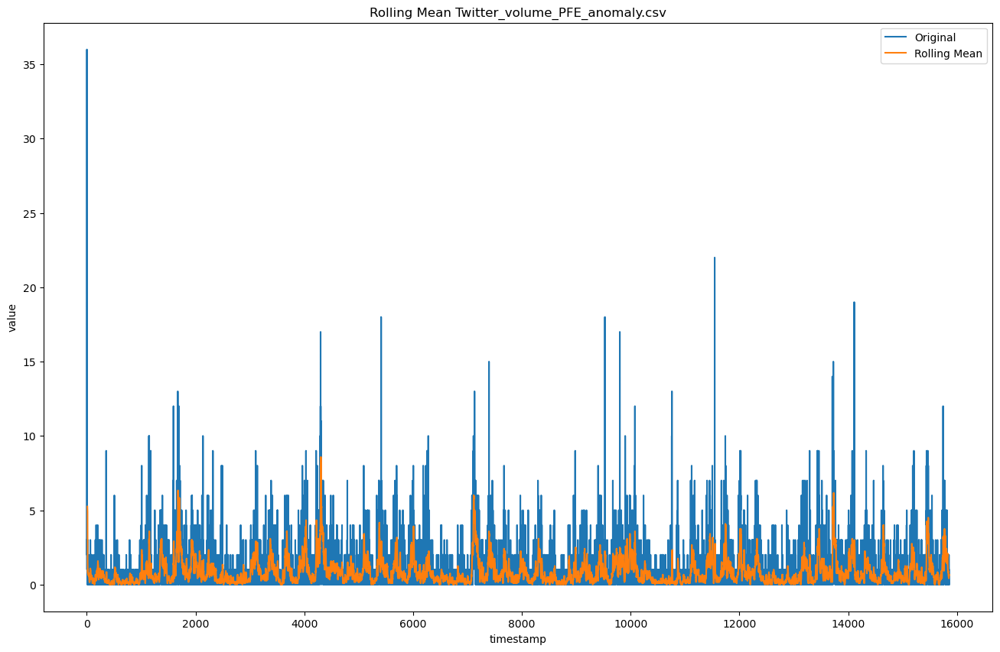

/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/255004051.py:19: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  KPSS_test = kpss(series, regression=reg)


ADF Statistic: -10.492372615756098
p-value: 1.138247324015025e-18
n_lags: 42
Number of observations:15815
Critical Values:
   1%, -3.4307635543291175
Critical Values:
   5%, -2.8617227738147712
Critical Values:
   10%, -2.5668672859700403
KPSS Statistic: 0.10681261717153907
p-value: 0.1
n_lags: 65
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


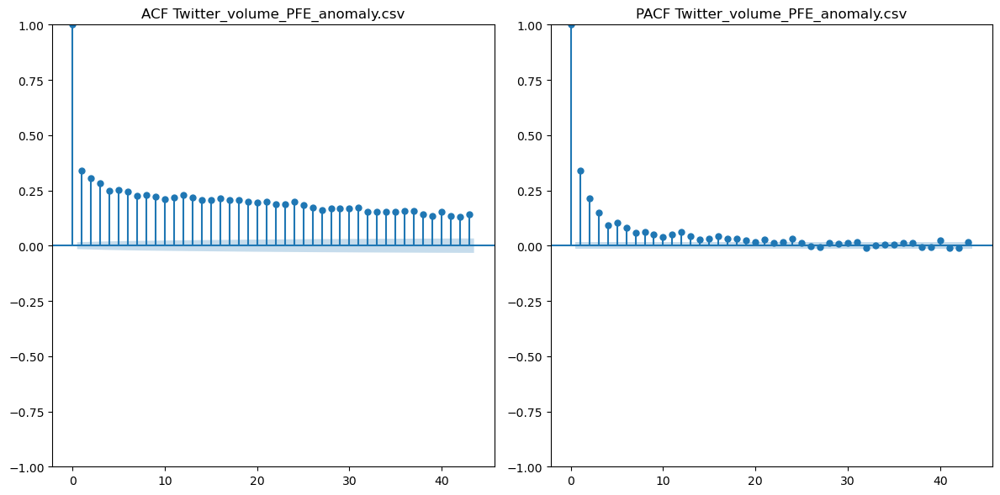

Information about: Twitter_volume_CRM_anomaly.csv


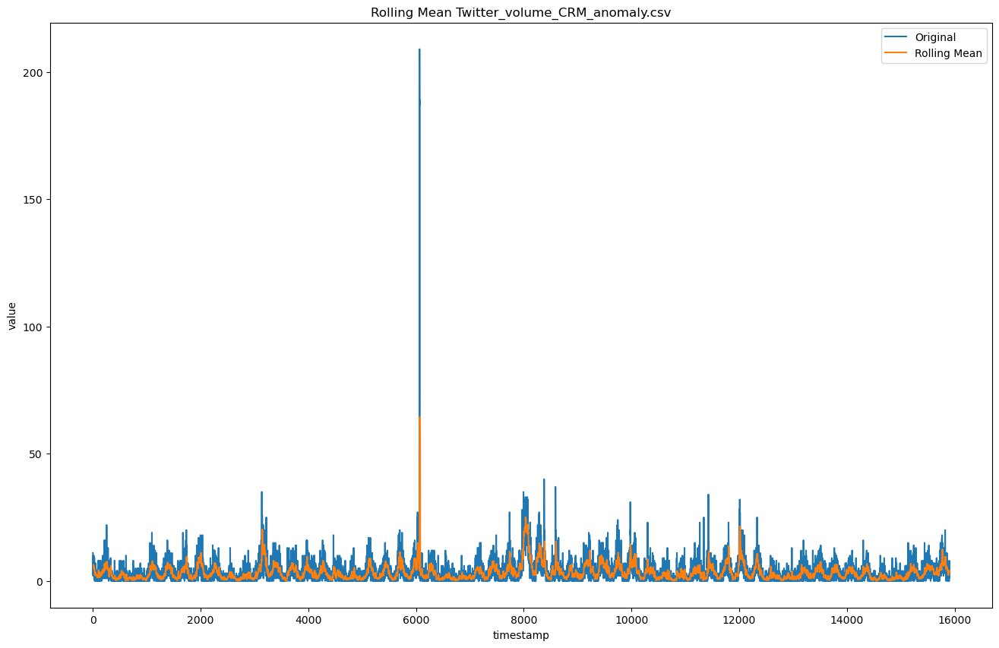

/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/255004051.py:19: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  KPSS_test = kpss(series, regression=reg)


ADF Statistic: -8.612995052068847
p-value: 6.400625735038635e-14
n_lags: 42
Number of observations:15859
Critical Values:
   1%, -3.4307624067575784
Critical Values:
   5%, -2.861722266671098
Critical Values:
   10%, -2.5668670160239233
KPSS Statistic: 0.3315820528852594
p-value: 0.1
n_lags: 65
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


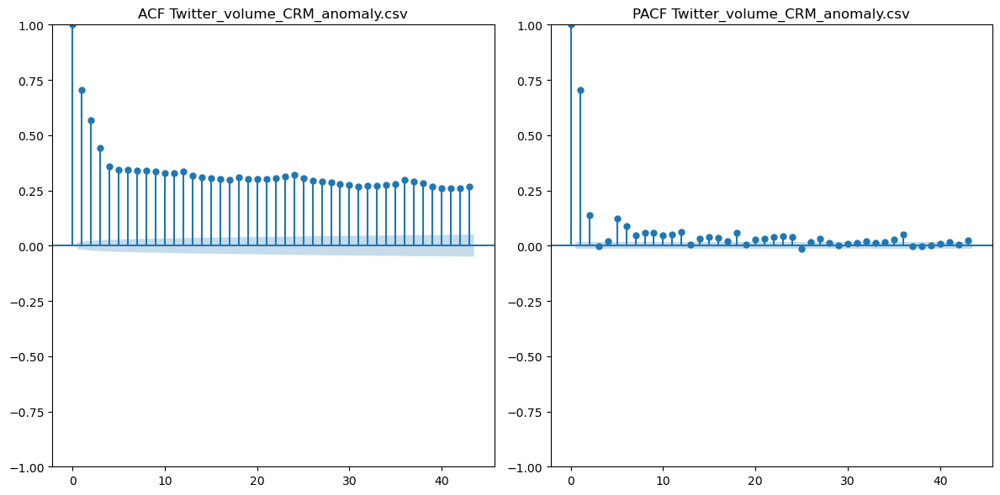

In [38]:
#become file lists
csv_files = glob.glob("NAB_labelled/realTweets/*.csv")
file_names = [os.path.basename(file) for file in csv_files]
#print information and plots
for file_name in file_names:
    df = pd.read_csv(f'NAB_labelled/realTweets/{file_name}')
    print_information_about_file(df, file_name)

In [39]:
#create a summary information

for i in range(len(regression_ADF_values)):
    regression_ADF = regression_ADF_values[i]
    regression_KPSS = regression_KPSS_values[i]
    for file_name in file_names:
        df = pd.read_csv(f'NAB_labelled/realTweets/{file_name}')
        df_info = create_summary_frame(df_info, df, file_name, regression_ADF, regression_KPSS)

/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/1717271452.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_info = df_info.append({'File Name': file_name,
/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/255004051.py:19: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  KPSS_test = kpss(series, regression=reg)
/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/1717271452.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_info = df_info.append({'File Name': file_name,
/var/folders/ks/j5w6xqqs1454hlwdqd8w2gg80000gn/T/ipykernel_6318/255004051.py:19: InterpolationWarning: The test statistic is outside of the range of p-values available in the


In [40]:
#save the information as a .csv file
df_info.to_csv('Summary/Summary_stationarity_NAB_real_tweets.csv',index=False)

## Check the stationarity of signals from different collections of NAB Dataset

Stationarity was assessed using a singular ADF test with various regression parameters and a combination of ADF and KPSS tests. The null hypothesis is rejected when the p-value is less than 0.5

Necessary functions.

In [17]:
def display_stationary_files_ADF(df, regression_type, p_value_threshold=0.05):
    """
    Display files from a DataFrame that meet stationary criteria based on the ADF test.

    Parameters:
    df (DataFrame): The DataFrame containing the data.
    regression_type (str): The type of ADF regression ('n', 'ctt', 'ct', 'c').
    p_value_threshold (float, optional): The p-value threshold for considering a file as stationary. Default is 0.05.
    """
    stationary_files = df[((df['ADF Regression'] == regression_type) & (df['ADF p-value'] < p_value_threshold))]
    print(f"Number of stationary files for '{regression_type}': {len(stationary_files)}")
    print(stationary_files['File Name'].head(20))


In [18]:
def filter_and_print_stationary_ADF_KPSS(df):
    """
    Filter and print file names based on stationary criteria using ADF and KPSS tests.

    Parameters:
    df (DataFrame): The DataFrame containing the data.

    Returns:
    None
    """

    ts_stationary_c = df[((df['KPSS Regression'] == 'c') & (df['KPSS p-value'] >= 0.05)) & (df['ADF Regression'] == 'c') & (df['ADF p-value'] < 0.05)]
    ts_stationary_ct = df[((df['KPSS Regression'] == 'ct') & (df['KPSS p-value'] >= 0.05)) & (df['ADF Regression'] == 'ct') & (df['ADF p-value'] < 0.05)]
    stationary_ct = df[((df['KPSS Regression'] == 'ct') & (df['KPSS p-value'] < 0.05)) & (df['ADF Regression'] == 'ct') & (df['ADF p-value'] < 0.05)]
    stationary_c = df[((df['KPSS Regression'] == 'c') & (df['KPSS p-value'] < 0.05)) & (df['ADF Regression'] == 'c') & (df['ADF p-value'] < 0.05)]
    ds_stationary_c = df[((df['KPSS Regression'] == 'c') & (df['KPSS p-value'] < 0.05)) & (df['ADF Regression'] == 'c') & (df['ADF p-value'] >= 0.05)]
    ds_stationary_ct = df[((df['KPSS Regression'] == 'ct') & (df['KPSS p-value'] < 0.05)) & (df['ADF Regression'] == 'ct') & (df['ADF p-value'] >= 0.05)]

    print("TS-Stationary_c:")
    print(ts_stationary_c['File Name'])
    print("\nTS-Stationary_ct:")
    print(ts_stationary_ct['File Name'])
    print("\nStationary_ct:")
    print(stationary_ct['File Name'])
    print("\nStationary_c:")
    print(stationary_c['File Name'])
    print("\nDS-Stationary_c:")
    print(ds_stationary_c['File Name'])
    print("\nDS-Stationary_ct:")
    print(ds_stationary_ct['File Name'])


ArtificialWithAnomaly collection.

In [19]:
#read the .csv file with summary information.
art = pd.read_csv('Summary/Summary_stationarity_NAB_Art_An.csv')

In [20]:
#use function for each regression parameter 
display_stationary_files_ADF(art, 'n') #no constant, no thend
display_stationary_files_ADF(art, 'ctt') #constant and quadratic trend
display_stationary_files_ADF(art, 'ct') #constant and linear trend
display_stationary_files_ADF(art, 'c') #constant only

Number of stationary files for 'n': 6
6       art_load_balancer_spikes_anomaly.csv
7            art_daily_jumpsdown_anomaly.csv
8     art_increase_spike_density_anomaly.csv
9           art_daily_flatmiddle_anomaly.csv
10             art_daily_jumpsup_anomaly.csv
11              art_daily_nojump_anomaly.csv
Name: File Name, dtype: object
Number of stationary files for 'ctt': 6
18      art_load_balancer_spikes_anomaly.csv
19           art_daily_jumpsdown_anomaly.csv
20    art_increase_spike_density_anomaly.csv
21          art_daily_flatmiddle_anomaly.csv
22             art_daily_jumpsup_anomaly.csv
23              art_daily_nojump_anomaly.csv
Name: File Name, dtype: object
Number of stationary files for 'ct': 6
12      art_load_balancer_spikes_anomaly.csv
13           art_daily_jumpsdown_anomaly.csv
14    art_increase_spike_density_anomaly.csv
15          art_daily_flatmiddle_anomaly.csv
16             art_daily_jumpsup_anomaly.csv
17              art_daily_nojump_anomaly.csv
Name: File 

In [22]:
#print summary for a stationarity using ADF and KPSS tests
filter_and_print_stationary_ADF_KPSS(art)

TS-Stationary_c:
1           art_daily_jumpsdown_anomaly.csv
2    art_increase_spike_density_anomaly.csv
3          art_daily_flatmiddle_anomaly.csv
4             art_daily_jumpsup_anomaly.csv
5              art_daily_nojump_anomaly.csv
Name: File Name, dtype: object

TS-Stationary_ct:
13           art_daily_jumpsdown_anomaly.csv
14    art_increase_spike_density_anomaly.csv
15          art_daily_flatmiddle_anomaly.csv
16             art_daily_jumpsup_anomaly.csv
17              art_daily_nojump_anomaly.csv
Name: File Name, dtype: object

Stationary_ct:
12    art_load_balancer_spikes_anomaly.csv
Name: File Name, dtype: object

Stationary_c:
0    art_load_balancer_spikes_anomaly.csv
Name: File Name, dtype: object

DS-Stationary_c:
Series([], Name: File Name, dtype: object)

DS-Stationary_ct:
Series([], Name: File Name, dtype: object)


RealAdExchange collection.

In [23]:
#read the .csv file with summary information.
adex = pd.read_csv('Summary/Summary_stationarity_NAB_real_AD_exhange.csv')

In [24]:
#use function for each regression parameter 
display_stationary_files_ADF(adex, 'n') #no constant, no thend
display_stationary_files_ADF(adex, 'ctt') #constant and quadratic trend
display_stationary_files_ADF(adex, 'ct') #constant and linear trend
display_stationary_files_ADF(adex, 'c') #constant only

Number of stationary files for 'n': 2
9     exchange-4_cpm_results_anomaly.csv
10    exchange-4_cpc_results_anomaly.csv
Name: File Name, dtype: object
Number of stationary files for 'ctt': 5
18    exchange-2_cpc_results_anomaly.csv
20    exchange-3_cpc_results_anomaly.csv
21    exchange-4_cpm_results_anomaly.csv
22    exchange-4_cpc_results_anomaly.csv
23    exchange-3_cpm_results_anomaly.csv
Name: File Name, dtype: object
Number of stationary files for 'ct': 5
12    exchange-2_cpc_results_anomaly.csv
13    exchange-2_cpm_results_anomaly.csv
14    exchange-3_cpc_results_anomaly.csv
15    exchange-4_cpm_results_anomaly.csv
16    exchange-4_cpc_results_anomaly.csv
Name: File Name, dtype: object
Number of stationary files for 'c': 4
1    exchange-2_cpm_results_anomaly.csv
2    exchange-3_cpc_results_anomaly.csv
3    exchange-4_cpm_results_anomaly.csv
4    exchange-4_cpc_results_anomaly.csv
Name: File Name, dtype: object


In [25]:
#print summary for a stationarity using ADF and KPSS tests
filter_and_print_stationary_ADF_KPSS(adex)

TS-Stationary_c:
3    exchange-4_cpm_results_anomaly.csv
Name: File Name, dtype: object

TS-Stationary_ct:
15    exchange-4_cpm_results_anomaly.csv
16    exchange-4_cpc_results_anomaly.csv
Name: File Name, dtype: object

Stationary_ct:
12    exchange-2_cpc_results_anomaly.csv
13    exchange-2_cpm_results_anomaly.csv
14    exchange-3_cpc_results_anomaly.csv
Name: File Name, dtype: object

Stationary_c:
1    exchange-2_cpm_results_anomaly.csv
2    exchange-3_cpc_results_anomaly.csv
4    exchange-4_cpc_results_anomaly.csv
Name: File Name, dtype: object

DS-Stationary_c:
0    exchange-2_cpc_results_anomaly.csv
5    exchange-3_cpm_results_anomaly.csv
Name: File Name, dtype: object

DS-Stationary_ct:
17    exchange-3_cpm_results_anomaly.csv
Name: File Name, dtype: object


RealAWSCloudwatch collection

In [26]:
#read the .csv file with summary information.
aws = pd.read_csv('Summary/Summary_stationarity_NAB_real_aws_cloudwatch.csv')

In [27]:
#use function for each regression parameter 
display_stationary_files_ADF(aws, 'n') #no constant, no thend
display_stationary_files_ADF(aws, 'ctt') #constant and quadratic trend
display_stationary_files_ADF(aws, 'ct') #constant and linear trend
display_stationary_files_ADF(aws, 'c') #constant only

Number of stationary files for 'n': 8
17           ec2_disk_write_bytes_c0d644_anomaly.csv
18                 ec2_network_in_5abac7_anomaly.csv
20            ec2_cpu_utilization_fe7f93_anomaly.csv
22                 ec2_network_in_257a54_anomaly.csv
23              elb_request_count_8c0756_anomaly.csv
26    iio_us-east-1_i-a2eb1cd9_NetworkIn_anomaly.csv
31            ec2_cpu_utilization_77c1ca_anomaly.csv
33           ec2_disk_write_bytes_1ef3de_anomaly.csv
Name: File Name, dtype: object
Number of stationary files for 'ctt': 12
51           ec2_disk_write_bytes_c0d644_anomaly.csv
52                 ec2_network_in_5abac7_anomaly.csv
54            ec2_cpu_utilization_fe7f93_anomaly.csv
55            ec2_cpu_utilization_825cc2_anomaly.csv
56                 ec2_network_in_257a54_anomaly.csv
57              elb_request_count_8c0756_anomaly.csv
59            ec2_cpu_utilization_53ea38_anomaly.csv
60    iio_us-east-1_i-a2eb1cd9_NetworkIn_anomaly.csv
62            ec2_cpu_utilization_c6585a_a

In [28]:
#print summary for a stationarity using ADF and KPSS tests
filter_and_print_stationary_ADF_KPSS(adex)

TS-Stationary_c:
3    exchange-4_cpm_results_anomaly.csv
Name: File Name, dtype: object

TS-Stationary_ct:
15    exchange-4_cpm_results_anomaly.csv
16    exchange-4_cpc_results_anomaly.csv
Name: File Name, dtype: object

Stationary_ct:
12    exchange-2_cpc_results_anomaly.csv
13    exchange-2_cpm_results_anomaly.csv
14    exchange-3_cpc_results_anomaly.csv
Name: File Name, dtype: object

Stationary_c:
1    exchange-2_cpm_results_anomaly.csv
2    exchange-3_cpc_results_anomaly.csv
4    exchange-4_cpc_results_anomaly.csv
Name: File Name, dtype: object

DS-Stationary_c:
0    exchange-2_cpc_results_anomaly.csv
5    exchange-3_cpm_results_anomaly.csv
Name: File Name, dtype: object

DS-Stationary_ct:
17    exchange-3_cpm_results_anomaly.csv
Name: File Name, dtype: object


RealKnownCause collection

In [29]:
#read the .csv file with summary information.
known = pd.read_csv('Summary/Summary_stationarity_NAB_real_known_cause.csv')

In [30]:
#use function for each regression parameter 
display_stationary_files_ADF(known, 'n') #no constant, no thend
display_stationary_files_ADF(known, 'ctt') #constant and quadratic trend
display_stationary_files_ADF(known, 'ct') #constant and linear trend
display_stationary_files_ADF(known, 'c') #constant only

Number of stationary files for 'n': 2
7     rogue_agent_key_updown_anomaly.csv
13      rogue_agent_key_hold_anomaly.csv
Name: File Name, dtype: object
Number of stationary files for 'ctt': 7
21                  rogue_agent_key_updown_anomaly.csv
22      ambient_temperature_system_failure_anomaly.csv
23      ec2_request_latency_system_failure_anomaly.csv
24    cpu_utilization_asg_misconfiguration_anomaly.csv
25      machine_temperature_system_failure_anomaly.csv
26                                nyc_taxi_anomaly.csv
27                    rogue_agent_key_hold_anomaly.csv
Name: File Name, dtype: object
Number of stationary files for 'ct': 7
14                  rogue_agent_key_updown_anomaly.csv
15      ambient_temperature_system_failure_anomaly.csv
16      ec2_request_latency_system_failure_anomaly.csv
17    cpu_utilization_asg_misconfiguration_anomaly.csv
18      machine_temperature_system_failure_anomaly.csv
19                                nyc_taxi_anomaly.csv
20                    ro

In [31]:
#print summary for a stationarity using ADF and KPSS tests
filter_and_print_stationary_ADF_KPSS(known)

TS-Stationary_c:
0    rogue_agent_key_updown_anomaly.csv
5                  nyc_taxi_anomaly.csv
Name: File Name, dtype: object

TS-Stationary_ct:
Series([], Name: File Name, dtype: object)

Stationary_ct:
14                  rogue_agent_key_updown_anomaly.csv
15      ambient_temperature_system_failure_anomaly.csv
16      ec2_request_latency_system_failure_anomaly.csv
17    cpu_utilization_asg_misconfiguration_anomaly.csv
18      machine_temperature_system_failure_anomaly.csv
19                                nyc_taxi_anomaly.csv
20                    rogue_agent_key_hold_anomaly.csv
Name: File Name, dtype: object

Stationary_c:
1      ambient_temperature_system_failure_anomaly.csv
2      ec2_request_latency_system_failure_anomaly.csv
3    cpu_utilization_asg_misconfiguration_anomaly.csv
4      machine_temperature_system_failure_anomaly.csv
6                    rogue_agent_key_hold_anomaly.csv
Name: File Name, dtype: object

DS-Stationary_c:
Series([], Name: File Name, dtype: object)



RealTraffic collection

In [32]:
#read the .csv file with summary information.
traf =pd.read_csv('Summary/Summary_stationarity_NAB_real_traffic.csv')

In [33]:
#use function for each regression parameter 
display_stationary_files_ADF(traf, 'n') #no constant, no thend
display_stationary_files_ADF(traf, 'ctt') #constant and quadratic trend
display_stationary_files_ADF(traf, 'ct') #constant and linear trend
display_stationary_files_ADF(traf, 'c') #constant only

Number of stationary files for 'n': 4
7      TravelTime_387_anomaly.csv
8      TravelTime_451_anomaly.csv
11    occupancy_t4013_anomaly.csv
12     occupancy_6005_anomaly.csv
Name: File Name, dtype: object
Number of stationary files for 'ctt': 7
21     TravelTime_387_anomaly.csv
22     TravelTime_451_anomaly.csv
23        speed_t4013_anomaly.csv
24         speed_6005_anomaly.csv
25    occupancy_t4013_anomaly.csv
26     occupancy_6005_anomaly.csv
27         speed_7578_anomaly.csv
Name: File Name, dtype: object
Number of stationary files for 'ct': 7
14     TravelTime_387_anomaly.csv
15     TravelTime_451_anomaly.csv
16        speed_t4013_anomaly.csv
17         speed_6005_anomaly.csv
18    occupancy_t4013_anomaly.csv
19     occupancy_6005_anomaly.csv
20         speed_7578_anomaly.csv
Name: File Name, dtype: object
Number of stationary files for 'c': 7
0     TravelTime_387_anomaly.csv
1     TravelTime_451_anomaly.csv
2        speed_t4013_anomaly.csv
3         speed_6005_anomaly.csv
4    occ

In [34]:
#print summary for a stationarity using ADF and KPSS tests
filter_and_print_stationary_ADF_KPSS(traf)

TS-Stationary_c:
0     TravelTime_387_anomaly.csv
4    occupancy_t4013_anomaly.csv
5     occupancy_6005_anomaly.csv
Name: File Name, dtype: object

TS-Stationary_ct:
15    TravelTime_451_anomaly.csv
19    occupancy_6005_anomaly.csv
Name: File Name, dtype: object

Stationary_ct:
14     TravelTime_387_anomaly.csv
16        speed_t4013_anomaly.csv
17         speed_6005_anomaly.csv
18    occupancy_t4013_anomaly.csv
20         speed_7578_anomaly.csv
Name: File Name, dtype: object

Stationary_c:
1    TravelTime_451_anomaly.csv
2       speed_t4013_anomaly.csv
3        speed_6005_anomaly.csv
6        speed_7578_anomaly.csv
Name: File Name, dtype: object

DS-Stationary_c:
Series([], Name: File Name, dtype: object)

DS-Stationary_ct:
Series([], Name: File Name, dtype: object)


RealTweets collection

In [35]:
#read the .csv file with summary information.
tweets = pd.read_csv('Summary/Summary_stationarity_NAB_real_tweets.csv')

In [36]:
#use function for each regression parameter 
display_stationary_files_ADF(tweets, 'n') #no constant, no thend
display_stationary_files_ADF(tweets, 'ctt') #constant and quadratic trend
display_stationary_files_ADF(tweets, 'ct') #constant and linear trend
display_stationary_files_ADF(tweets, 'c') #constant only

Number of stationary files for 'n': 10
10     Twitter_volume_IBM_anomaly.csv
11    Twitter_volume_AAPL_anomaly.csv
12    Twitter_volume_AMZN_anomaly.csv
13      Twitter_volume_FB_anomaly.csv
14     Twitter_volume_UPS_anomaly.csv
15     Twitter_volume_CVS_anomaly.csv
16    Twitter_volume_GOOG_anomaly.csv
17      Twitter_volume_KO_anomaly.csv
18     Twitter_volume_PFE_anomaly.csv
19     Twitter_volume_CRM_anomaly.csv
Name: File Name, dtype: object
Number of stationary files for 'ctt': 10
30     Twitter_volume_IBM_anomaly.csv
31    Twitter_volume_AAPL_anomaly.csv
32    Twitter_volume_AMZN_anomaly.csv
33      Twitter_volume_FB_anomaly.csv
34     Twitter_volume_UPS_anomaly.csv
35     Twitter_volume_CVS_anomaly.csv
36    Twitter_volume_GOOG_anomaly.csv
37      Twitter_volume_KO_anomaly.csv
38     Twitter_volume_PFE_anomaly.csv
39     Twitter_volume_CRM_anomaly.csv
Name: File Name, dtype: object
Number of stationary files for 'ct': 10
20     Twitter_volume_IBM_anomaly.csv
21    Twitter_volume

In [37]:
#print summary for a stationarity using ADF and KPSS tests
filter_and_print_stationary_ADF_KPSS(tweets)

TS-Stationary_c:
1    Twitter_volume_AAPL_anomaly.csv
2    Twitter_volume_AMZN_anomaly.csv
3      Twitter_volume_FB_anomaly.csv
5     Twitter_volume_CVS_anomaly.csv
6    Twitter_volume_GOOG_anomaly.csv
8     Twitter_volume_PFE_anomaly.csv
9     Twitter_volume_CRM_anomaly.csv
Name: File Name, dtype: object

TS-Stationary_ct:
20     Twitter_volume_IBM_anomaly.csv
21    Twitter_volume_AAPL_anomaly.csv
22    Twitter_volume_AMZN_anomaly.csv
23      Twitter_volume_FB_anomaly.csv
25     Twitter_volume_CVS_anomaly.csv
26    Twitter_volume_GOOG_anomaly.csv
28     Twitter_volume_PFE_anomaly.csv
Name: File Name, dtype: object

Stationary_ct:
24    Twitter_volume_UPS_anomaly.csv
27     Twitter_volume_KO_anomaly.csv
29    Twitter_volume_CRM_anomaly.csv
Name: File Name, dtype: object

Stationary_c:
0    Twitter_volume_IBM_anomaly.csv
4    Twitter_volume_UPS_anomaly.csv
7     Twitter_volume_KO_anomaly.csv
Name: File Name, dtype: object

DS-Stationary_c:
Series([], Name: File Name, dtype: object)

DS-